In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from math import log, sqrt, exp
from statistics import NormalDist

In [6]:
# Step 1: Define file paths
file_paths = {
    "day0": "data/day0.csv",
    "day1": "data/day1.csv",
    "day2": "data/day2.csv",
    "day3": "data/day3.csv",
    "day4": "data/day4.csv"
}

# Step 2: Load and filter for VOLCANIC_ROCK + coupon products
volcanic_data_by_day = {}

for day, path in file_paths.items():
    df = pd.read_csv(path, sep=';')  # change sep if it's comma-delimited
    volcanic_df = df[df["product"].str.startswith("VOLCANIC_ROCK")]
    volcanic_data_by_day[day] = volcanic_df.reset_index(drop=True)

# Step 3: Split by product for each day
product_data_by_day = {}

for day, df in volcanic_data_by_day.items():
    grouped = {
        product: group.reset_index(drop=True)
        for product, group in df.groupby("product")
    }
    product_data_by_day[day] = grouped

# Example usage:
# volcanic_data_by_day["day0"] → entire day 0 of volcanic products
# product_data_by_day["day0"]["VOLCANIC_ROCK"] → only underlying for day 0
#product_data_by_day["day0"]["VOLCANIC_ROCK_VOUCHER_10000"]


In [4]:
def plot_dual_axis(df1, col1, df2, col2, title=None, color1='tab:blue', color2='tab:orange', xlim=None):
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Filter by xlim if provided
    if xlim:
        df1_plot = df1[(df1.index >= xlim[0]) & (df1.index <= xlim[1])]
        df2_plot = df2[(df2.index >= xlim[0]) & (df2.index <= xlim[1])]
    else:
        df1_plot = df1
        df2_plot = df2

    ax1.plot(df1_plot.index, df1_plot[col1], color=color1, label=col1)
    ax1.set_xlabel("Timestamp")
    ax1.set_ylabel(col1, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)

    if xlim:
        ax1.set_xlim(xlim)
        ax1.set_ylim(df1_plot[col1].min(), df1_plot[col1].max())

    ax2 = ax1.twinx()
    ax2.plot(df2_plot.index, df2_plot[col2], color=color2, label=col2)
    ax2.set_ylabel(col2, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    if xlim:
        ax2.set_ylim(df2_plot[col2].min(), df2_plot[col2].max())

    plt.title(title or f"{col1} (left) vs {col2} (right) over time")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def plot_single_axis(df, col, title=None, color='tab:blue', xlim=None):
    plt.figure(figsize=(10, 5))
    
    # Plot dots
    plt.scatter(df.index, df[col], color=color, label=col, zorder=5)
    
    # Plot connecting line
    plt.plot(df.index, df[col], color=color, alpha=0.7, zorder=3)

    plt.xlabel("Timestamp" if isinstance(df.index[0], (int, float)) else df.index.name or "Index")
    plt.ylabel(col)
    plt.title(title or f"{col} over time")
    plt.grid(True)

    if xlim:
        plt.xlim(xlim)

    plt.tight_layout()
    plt.show()


In [5]:

def plot_iv_with_labels(df, x_col="moneyness", y_col="implied_volatility", label_col="product", title=None):
    """
    Plot implied volatility with labels for each call option on the dots.
    
    Parameters:
        df (pd.DataFrame): DataFrame with IV, moneyness, and product info
        x_col (str): Column to use for x-axis (e.g. moneyness)
        y_col (str): Column to use for y-axis (e.g. implied_volatility)
        label_col (str): Column to use as text label (e.g. product)
        title (str): Optional title
    """
    plt.figure(figsize=(10, 6))

    # Sort for nice line behavior
    df_sorted = df.sort_values(by=x_col)

    # Plot dots and connecting line
    plt.plot(df_sorted[x_col], df_sorted[y_col], linestyle='-', color='tab:blue', alpha=0.6)
    plt.scatter(df_sorted[x_col], df_sorted[y_col], color='tab:blue')

    # Annotate each dot
    for _, row in df_sorted.iterrows():
        plt.annotate(
            row[label_col],
            (row[x_col], row[y_col]),
            textcoords="offset points",
            xytext=(0, 5),
            ha='center',
            fontsize=8
        )

    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(title or f"{y_col} vs {x_col}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [6]:
def plot_iv_parabola_fit_with_labels(df, spot_price, x_col="moneyness", y_col="implied_volatility", label_col="product", degree=2, title=None):
    import numpy as np
    import matplotlib.pyplot as plt

    # Print underlying price
    print(f"📈 Spot price of underlying: {spot_price}")

    # Clean and sort data
    df = df[[x_col, y_col, label_col]].dropna().sort_values(by=x_col)
    x = df[x_col].values
    y = df[y_col].values
    labels = df[label_col].values

    # Fit polynomial
    coeffs = np.polyfit(x, y, degree)
    poly = np.poly1d(coeffs)
    x_fit = np.linspace(min(x), max(x), 100)
    y_fit = poly(x_fit)

    # Plot
    plt.figure(figsize=(10, 5))
    plt.scatter(x, y, color='tab:blue', label="Observed IV")
    plt.plot(x_fit, y_fit, color='tab:orange', label=f"Degree {degree} Fit")

    # Annotate each point
    for xi, yi, label in zip(x, y, labels):
        plt.annotate(label, (xi, yi), textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8)

    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(title or f"{y_col} vs {x_col}")

    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [7]:
def black_scholes_call(spot, strike, time_to_expiry, volatility):
        d1 = (
            log(spot) - log(strike) + (0.5 * volatility * volatility) * time_to_expiry
        ) / (volatility * sqrt(time_to_expiry))
        d2 = d1 - volatility * sqrt(time_to_expiry)
        call_price = spot * NormalDist().cdf(d1) - strike * NormalDist().cdf(d2)
        return call_price


In [8]:
def implied_volatility(call_price, spot, strike, time_to_expiry, max_iterations=200, tolerance=1e-10, debug=False):
    # Guard invalid inputs
    if call_price <= 0 or spot <= 0 or strike <= 0 or time_to_expiry <= 0:
        if debug:
            print(f"[SKIP] Invalid input → call={call_price}, spot={spot}, strike={strike}, T={time_to_expiry}")
        return float("nan")

    low_vol = 0.01
    high_vol = 1.0
    volatility = (low_vol + high_vol) / 2.0

    if debug:
        print(f"[IV] ENTER: spot={spot}, strike={strike}, call={call_price}, T={time_to_expiry:.5f}")

    for i in range(max_iterations):
        try:
            estimated_price = black_scholes_call(
                spot, strike, time_to_expiry, volatility
            )
        except Exception as e:
            if debug:
                print(f"[EXCEPTION] Pricing failed: {e}")
            return float("nan")

        diff = estimated_price - call_price

        if debug:
            if i == 0:
                print(f"  [start] vol={volatility:.4f}, price={estimated_price:.2f}, diff={diff:.4f}")
            print(f"  [step {i:03}] vol={volatility:.4f}, price={estimated_price:.2f}, diff={diff:.4f}")

        if abs(diff) < tolerance:
            if debug:
                print(f"  [BREAK @ {i}] tolerance hit → diff={diff:.4e}")
            break
        elif diff > 0:
            high_vol = volatility
        else:
            low_vol = volatility

        volatility = (low_vol + high_vol) / 2.0

    if debug:
        print(f"[DONE] final_vol={volatility:.4f}, final_price={estimated_price:.2f}, final_diff={diff:.4f}")

    return volatility


In [9]:
def compute_ivs_for_timestamp(df, spot_price, current_day, current_timestamp):
    """
    Compute implied volatility for all options at a single timestamp using dynamic time to expiry.

    Parameters:
        df (pd.DataFrame): DataFrame for one timestamp
        spot_price (float): Underlying mid price at the same timestamp
        current_day (int): Day index (0-based)
        current_timestamp (int): Timestamp within the current day (0–999999)

    Returns:
        pd.DataFrame with added 'implied_volatility' column
    """
    total_ticks = 8_000_000
    ticks_elapsed = current_day * 1_000_000 + current_timestamp
    time_to_expiry = (total_ticks - ticks_elapsed) / 252_000_000  # convert to years

    ivs = []

    for _, row in df.iterrows():
        call_price = row["mid_price"]
        strike = int(row["product"].split("_")[-1])
        try:
            iv = implied_volatility(
                call_price=call_price,
                spot=spot_price,
                strike=strike,
                time_to_expiry=time_to_expiry
            )
        except Exception as e:
            print(f"        Reason: {e}")
            iv = float("nan")

        ivs.append(iv)

    df_with_iv = df.copy()
    df_with_iv["implied_volatility"] = ivs
    return df_with_iv


In [10]:
def compute_moneyness_for_timestamp(df, spot_price, current_day, current_timestamp):
    """
    Compute moneyness for each option at a given timestamp.

    Parameters:
        df (pd.DataFrame): Options for one timestamp
        spot_price (float): Spot price at the timestamp
        current_day (int): Day index (0-based)
        current_timestamp (int): Timestamp within the day

    Returns:
        pd.DataFrame: Original df with added 'moneyness' column
    """
    total_ticks = 8_000_000
    ticks_elapsed = current_day * 1_000_000 + current_timestamp
    tte = (total_ticks - ticks_elapsed) / 252_000_000  # time to expiry in years

    moneyness = []

    for _, row in df.iterrows():
        strike = int(row["product"].split("_")[-1])
        try:
            m_t = np.log(strike / spot_price) / np.sqrt(tte)
        except:
            m_t = float("nan")
        moneyness.append(m_t)

    df_with_m = df.copy()
    df_with_m["moneyness"] = moneyness
    return df_with_m


In [11]:
def plot_iv_vs_moneyness(day_label, timestamp, valid_9500_timestamps=None):
    options_df = volcanic_data_by_day[day_label]
    options = options_df[(options_df["timestamp"] == timestamp) & options_df["product"].str.contains("VOUCHER")]

    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    spot_price = spot_df[spot_df["timestamp"] == timestamp]["mid_price"].values[0]

    current_day_index = int(day_label.replace("day", ""))
    options = compute_ivs_for_timestamp(options, spot_price, current_day_index, timestamp)
    options = compute_moneyness_for_timestamp(options, spot_price, current_day_index, timestamp)

    # ✂️ Remove 9500 if timestamp not valid
    if valid_9500_timestamps is not None:
        is_9500 = options["product"] == "VOLCANIC_ROCK_VOUCHER_9500"
        not_in_valid = ~options["timestamp"].isin(valid_9500_timestamps)
        options = options[~(is_9500 & not_in_valid)]

    plot_iv_parabola_fit_with_labels(
        options,
        spot_price=spot_price,
        x_col="moneyness",
        y_col="implied_volatility",
        label_col="product",
        degree=2,
        title=f"{day_label} @ t={timestamp}"
    )


Plotting timestamp 0...
📈 Spot price of underlying: 10503.0


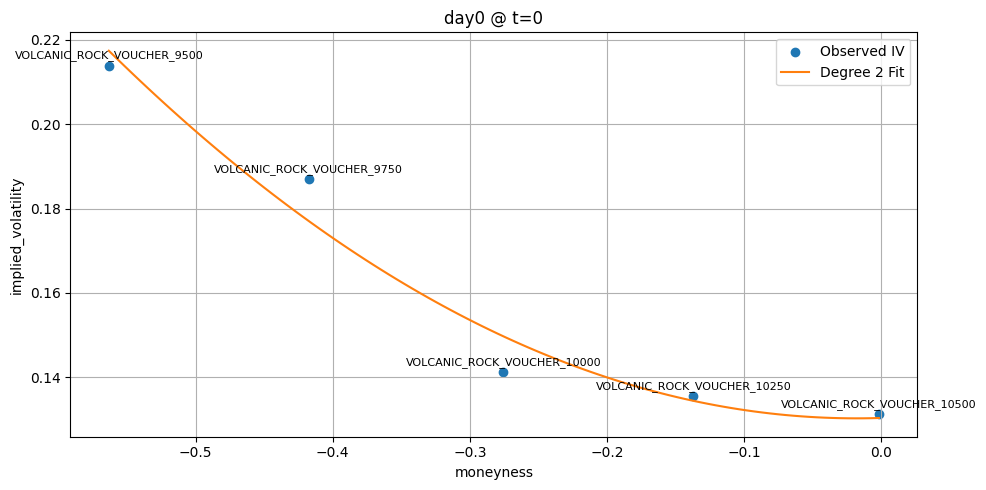

Plotting timestamp 100...
📈 Spot price of underlying: 10510.0


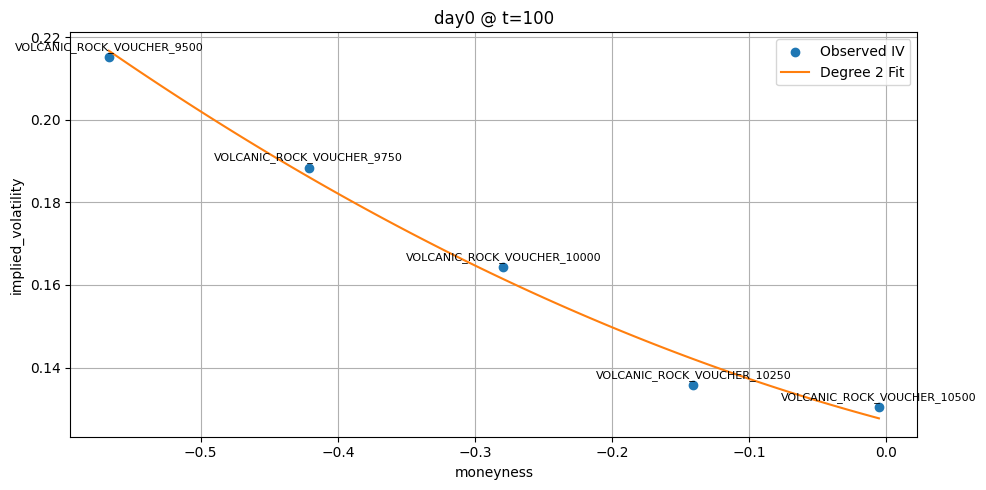

Plotting timestamp 200...
📈 Spot price of underlying: 10513.0


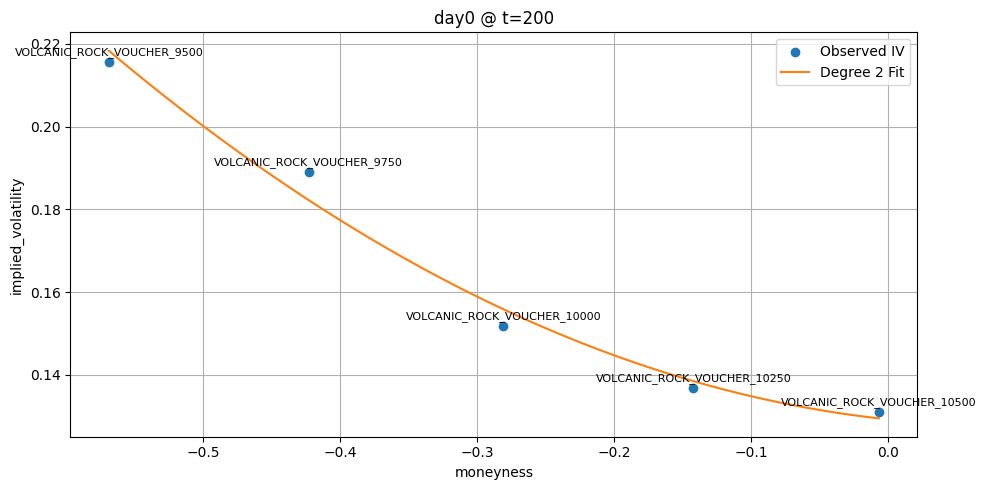

Plotting timestamp 300...
📈 Spot price of underlying: 10517.5


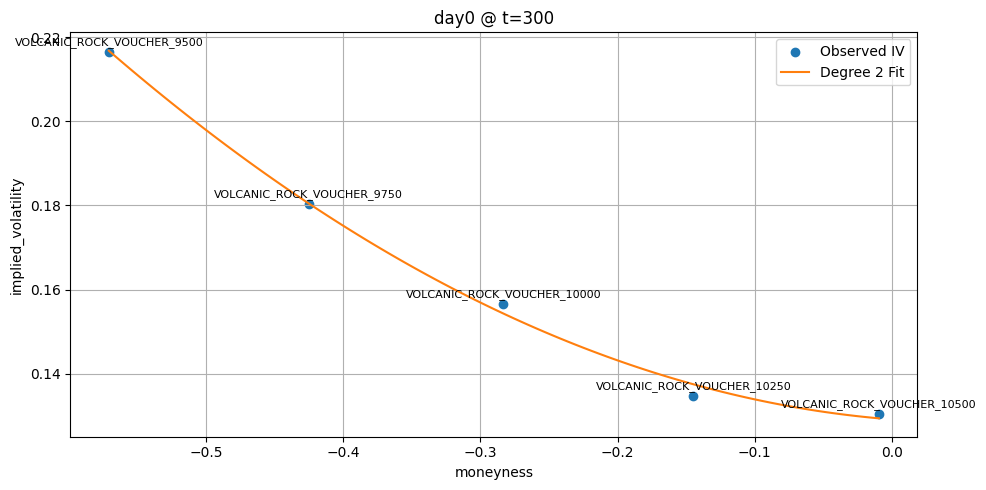

Plotting timestamp 400...
📈 Spot price of underlying: 10509.5


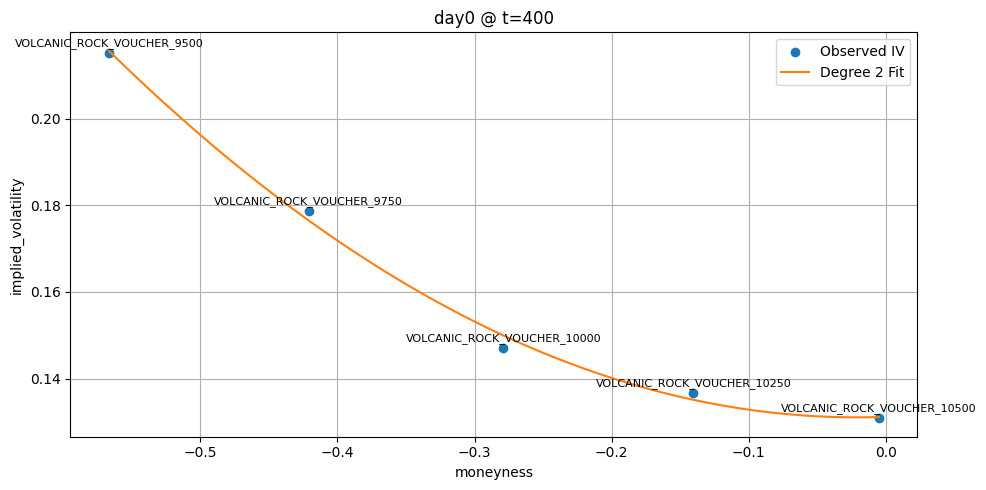

Plotting timestamp 500...
📈 Spot price of underlying: 10506.0


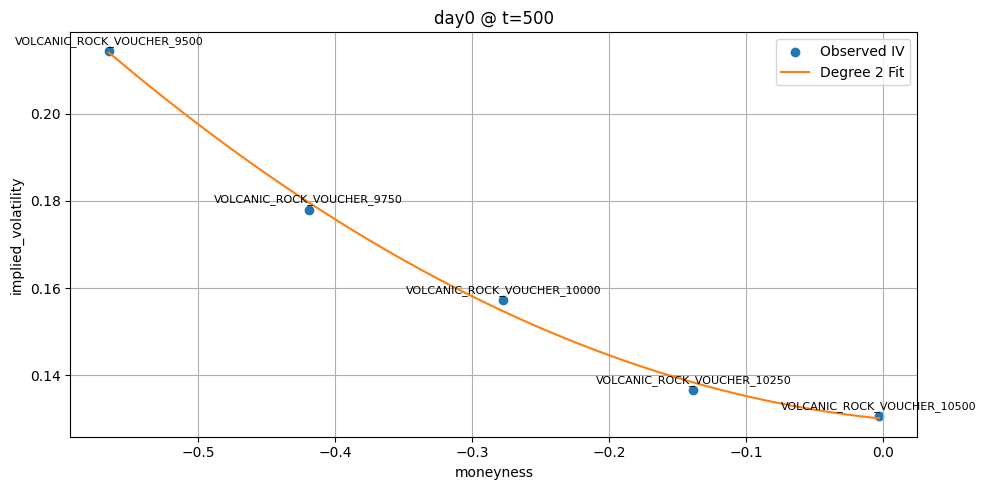

Plotting timestamp 600...
📈 Spot price of underlying: 10503.5


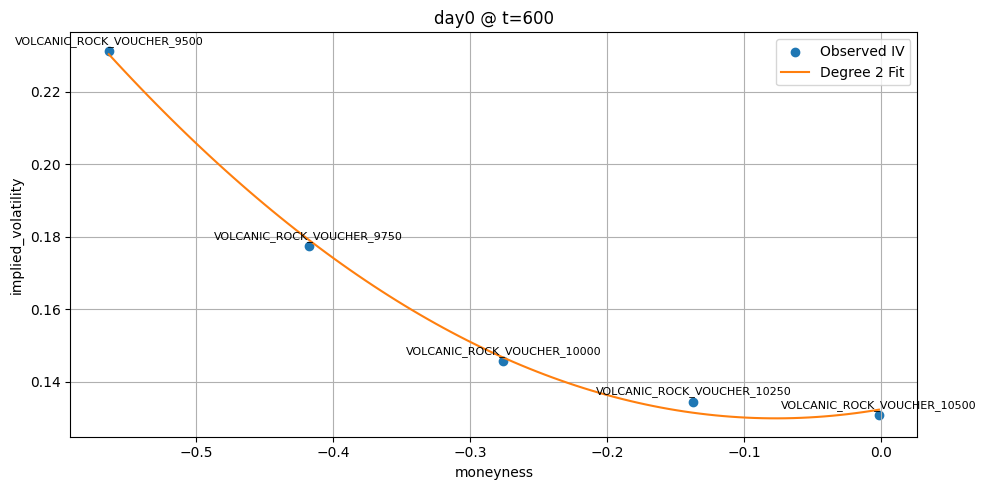

Plotting timestamp 700...
📈 Spot price of underlying: 10503.0


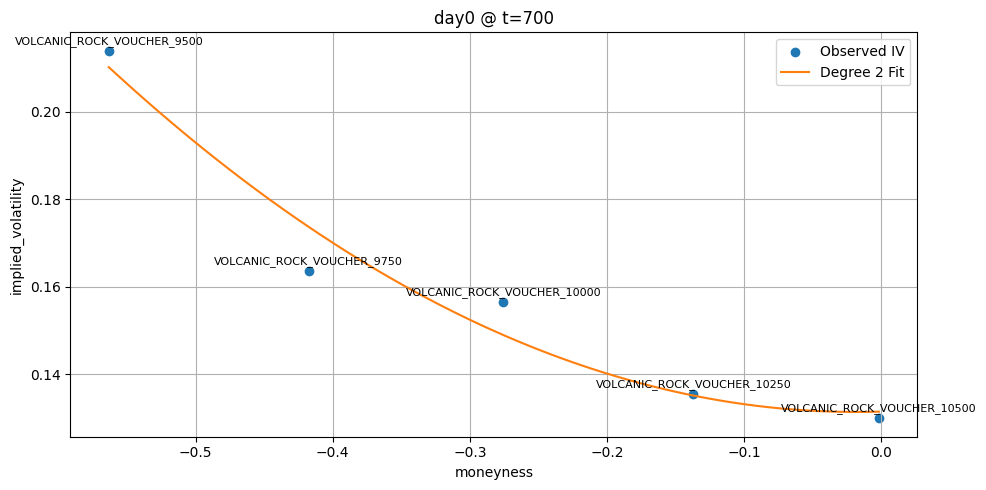

Plotting timestamp 800...
📈 Spot price of underlying: 10497.5


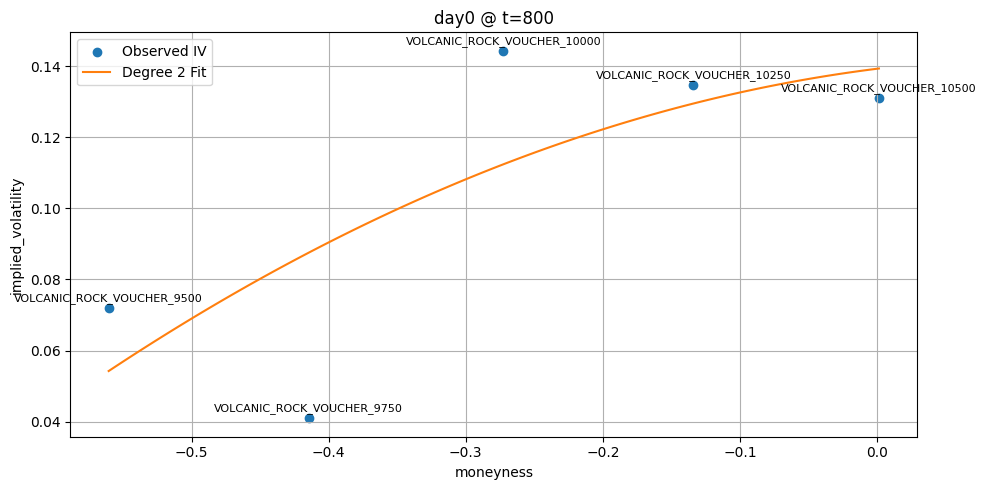

Plotting timestamp 900...
📈 Spot price of underlying: 10495.5


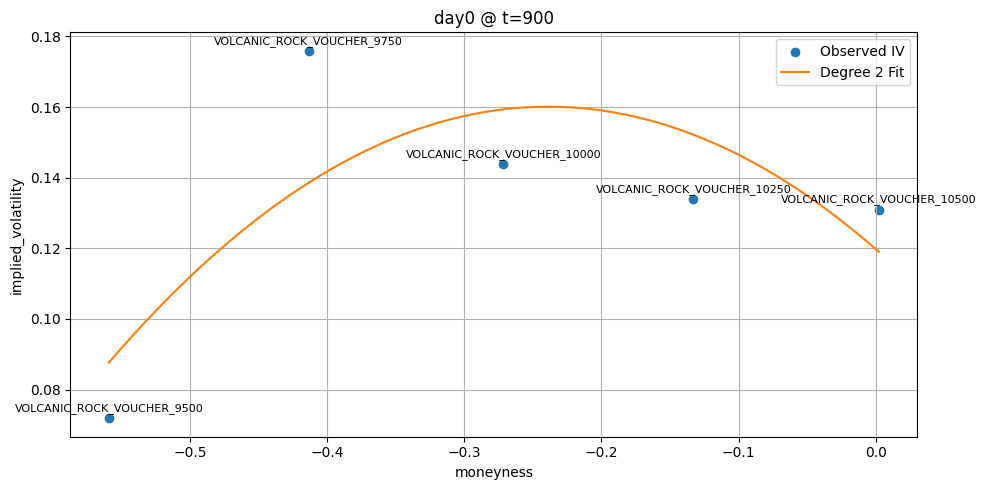

Plotting timestamp 1000...
📈 Spot price of underlying: 10499.0


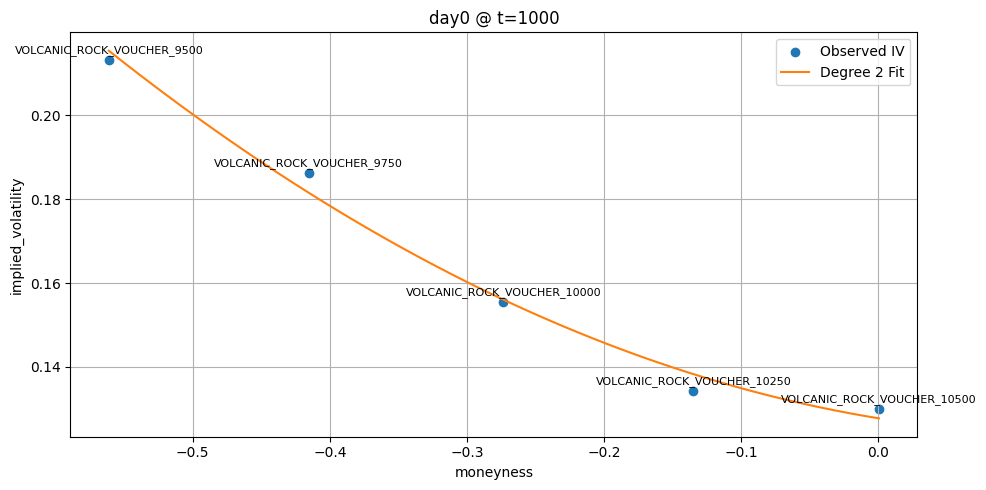

Plotting timestamp 1100...
📈 Spot price of underlying: 10501.0


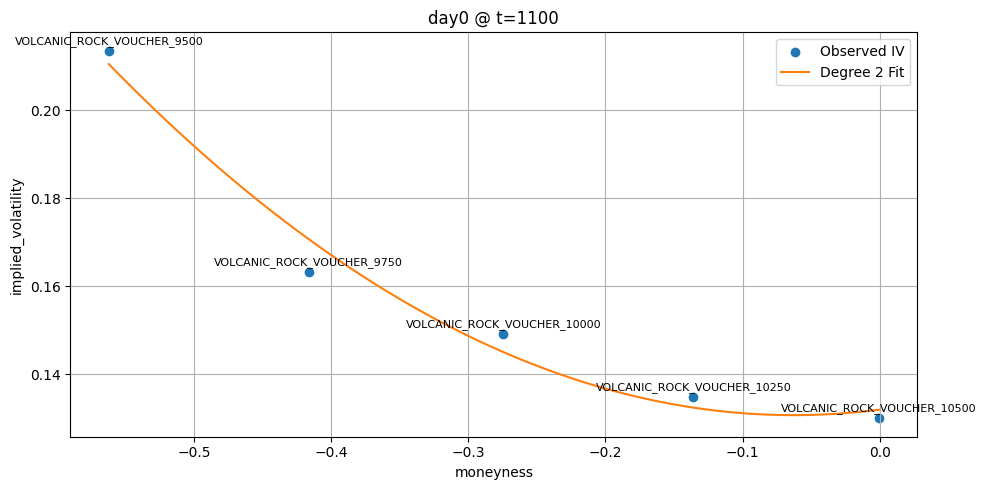

Plotting timestamp 1200...
📈 Spot price of underlying: 10504.5


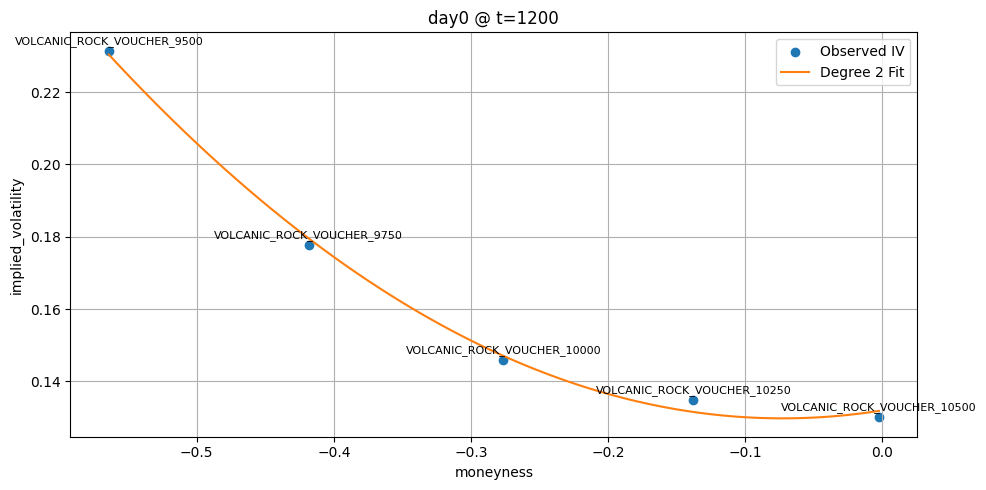

Plotting timestamp 1300...
📈 Spot price of underlying: 10510.0


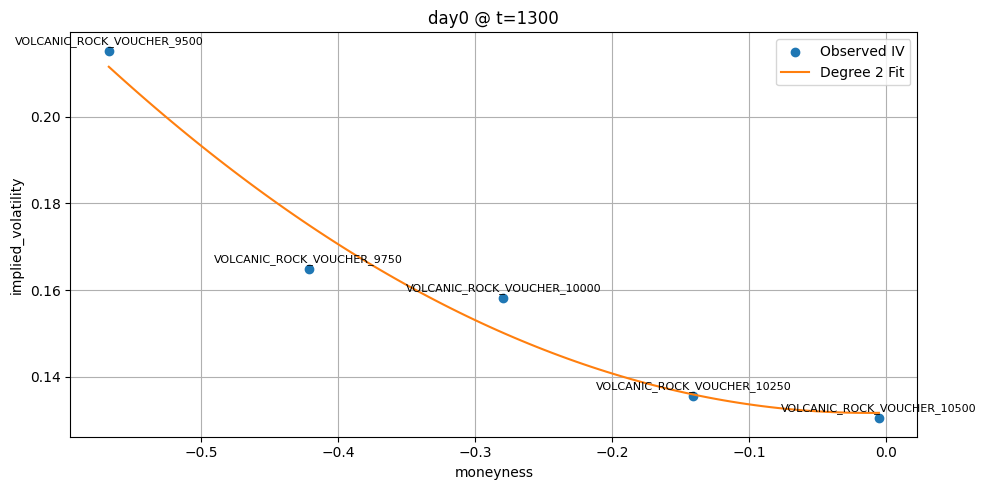

Plotting timestamp 1400...
📈 Spot price of underlying: 10510.0


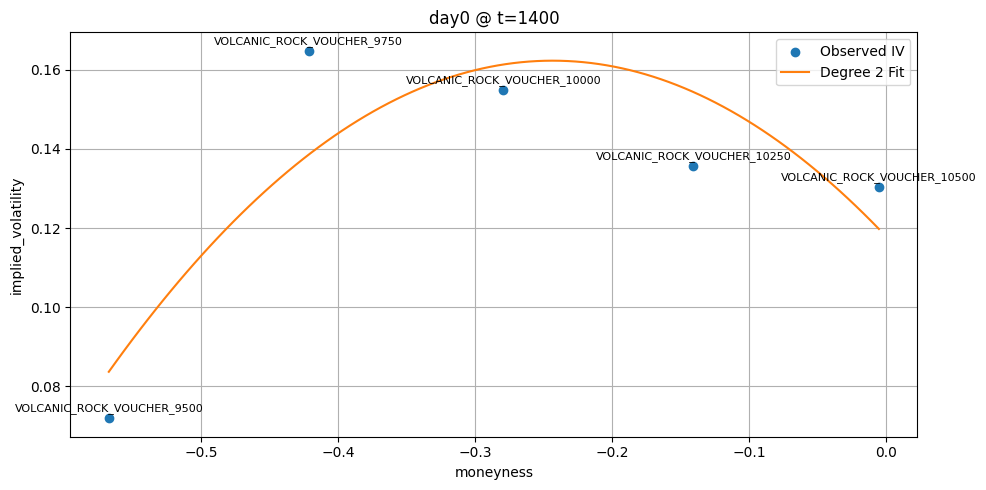

Plotting timestamp 1500...
📈 Spot price of underlying: 10504.5


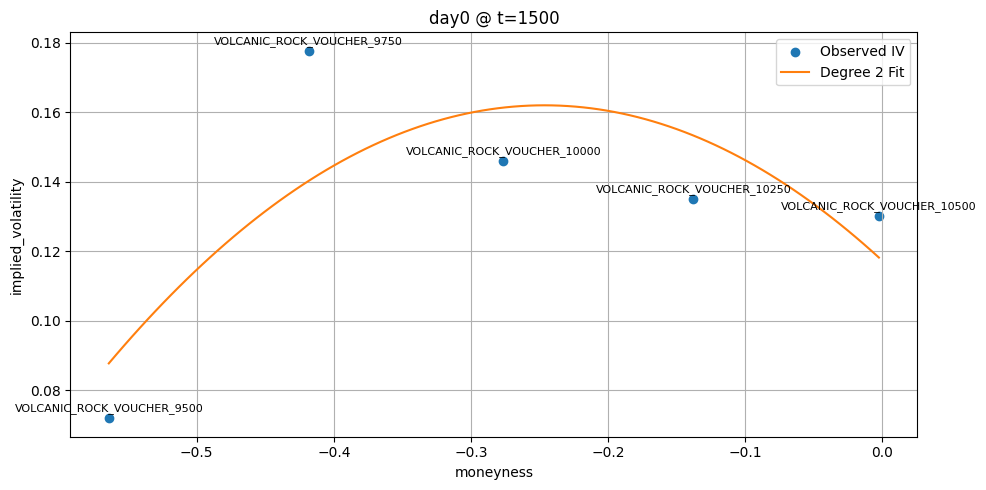

Plotting timestamp 1600...
📈 Spot price of underlying: 10504.5


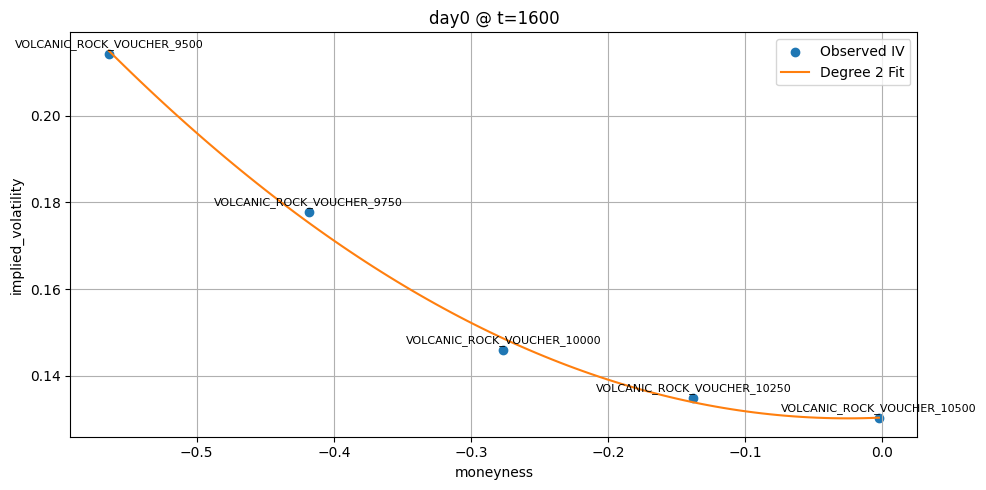

Plotting timestamp 1700...
📈 Spot price of underlying: 10499.0


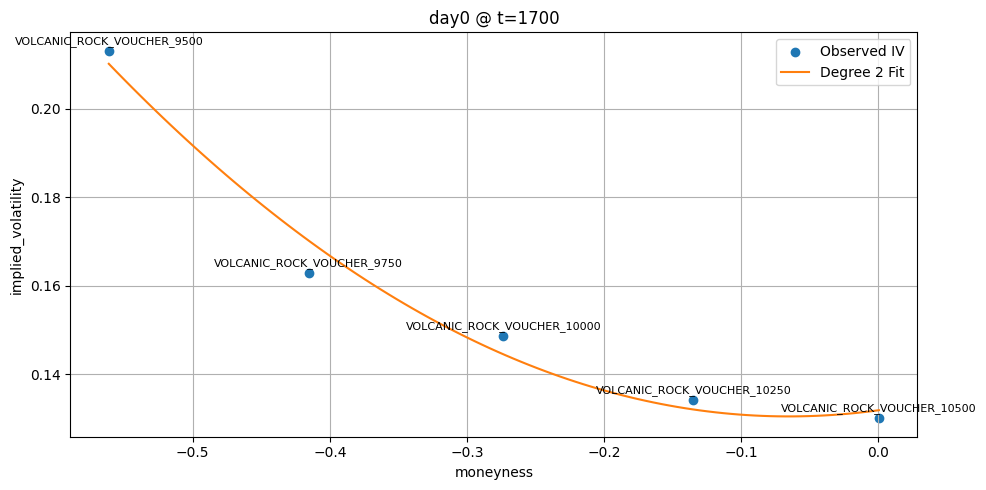

Plotting timestamp 1800...
📈 Spot price of underlying: 10497.5


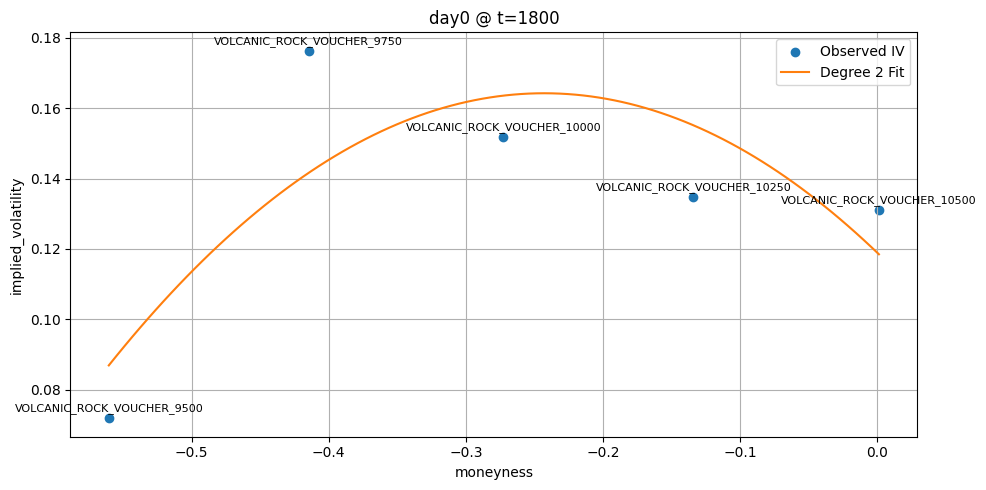

Plotting timestamp 1900...
📈 Spot price of underlying: 10493.5


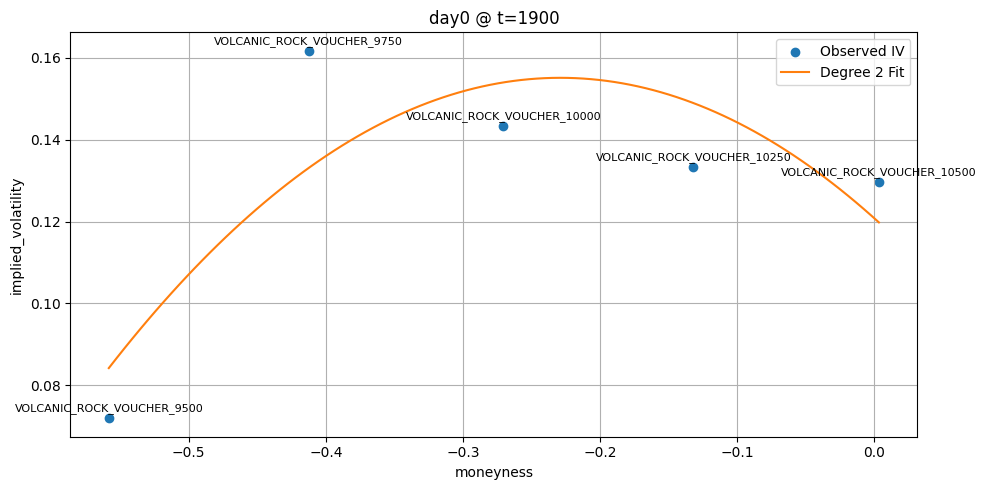

Plotting timestamp 2000...
📈 Spot price of underlying: 10493.0


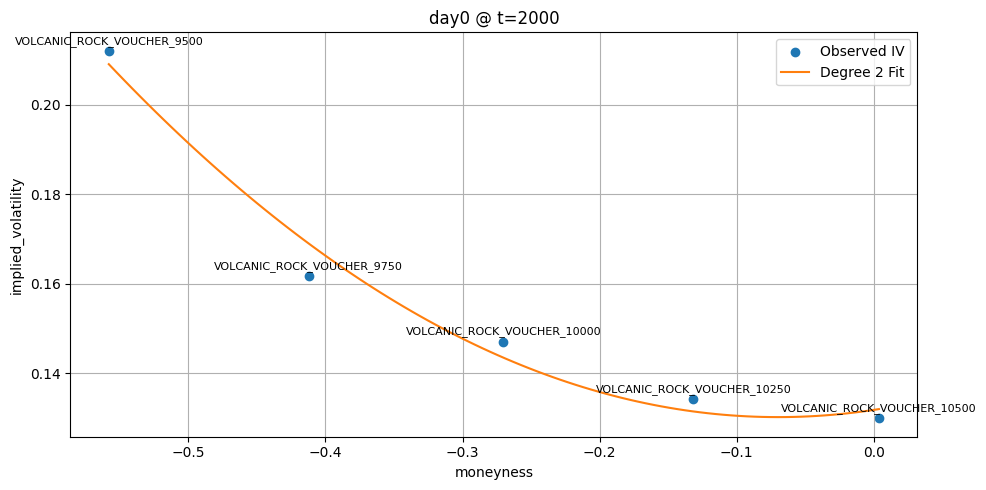

Plotting timestamp 2100...
📈 Spot price of underlying: 10488.5


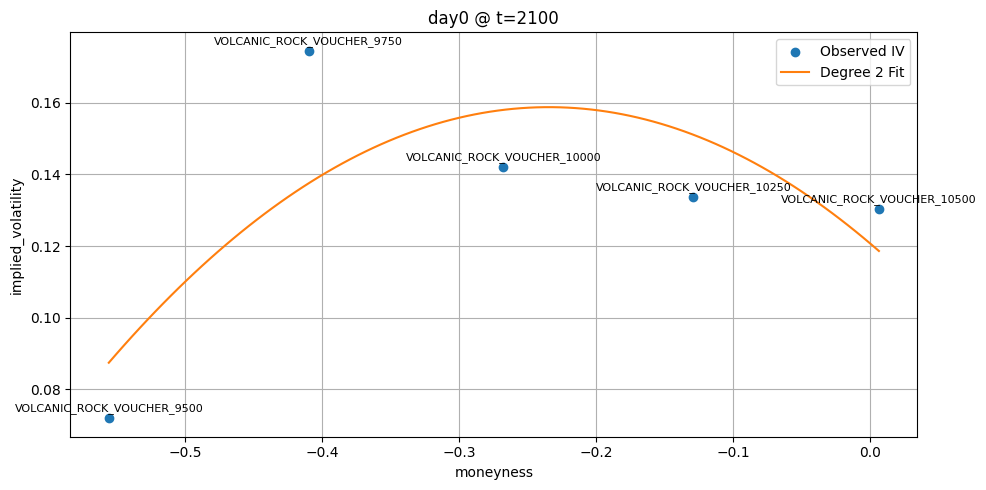

Plotting timestamp 2200...
📈 Spot price of underlying: 10485.5


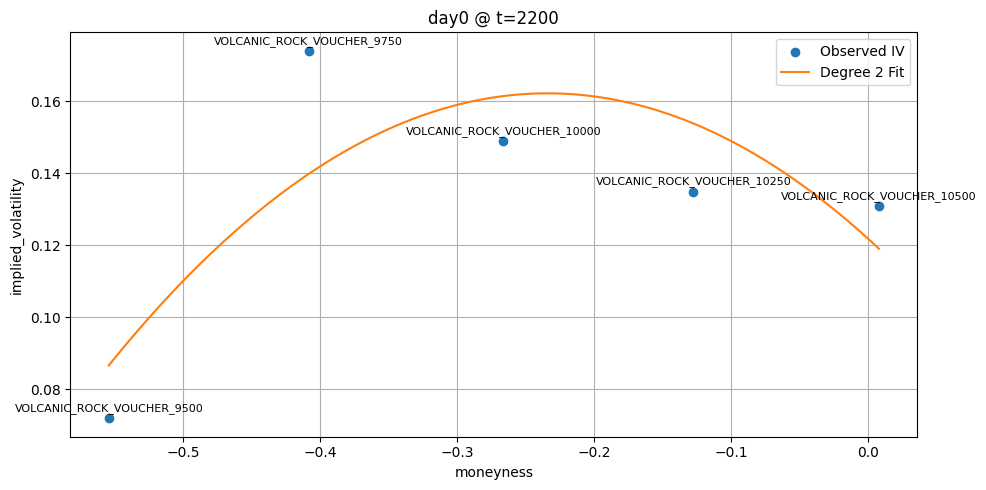

Plotting timestamp 2300...
📈 Spot price of underlying: 10491.5


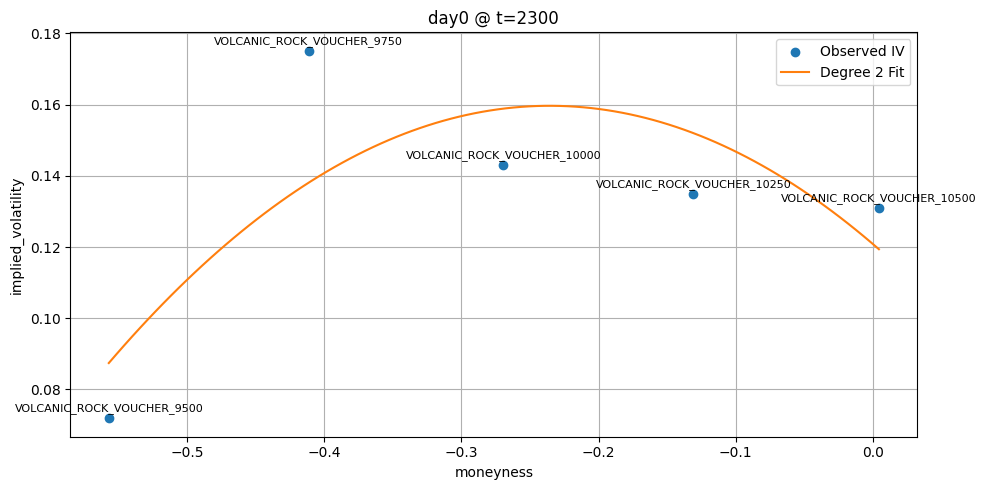

Plotting timestamp 2400...
📈 Spot price of underlying: 10486.0


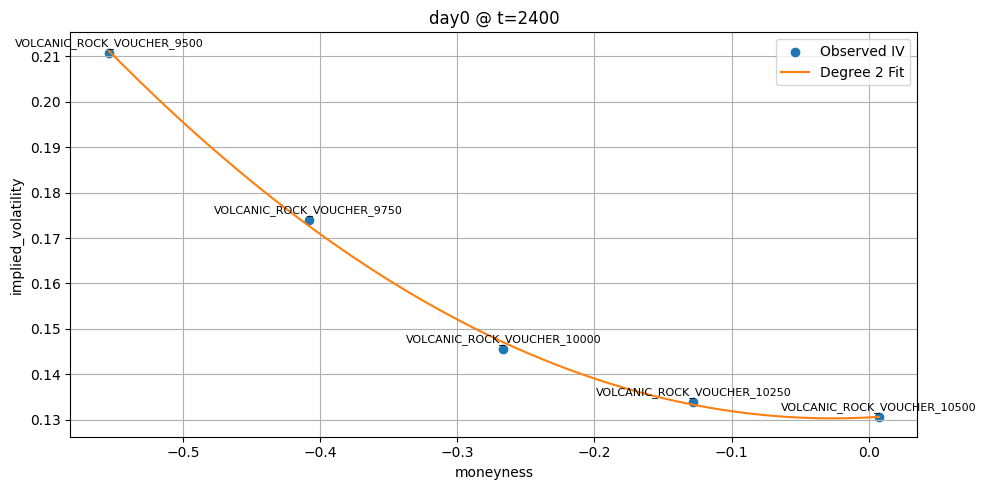

Plotting timestamp 2500...
📈 Spot price of underlying: 10480.5


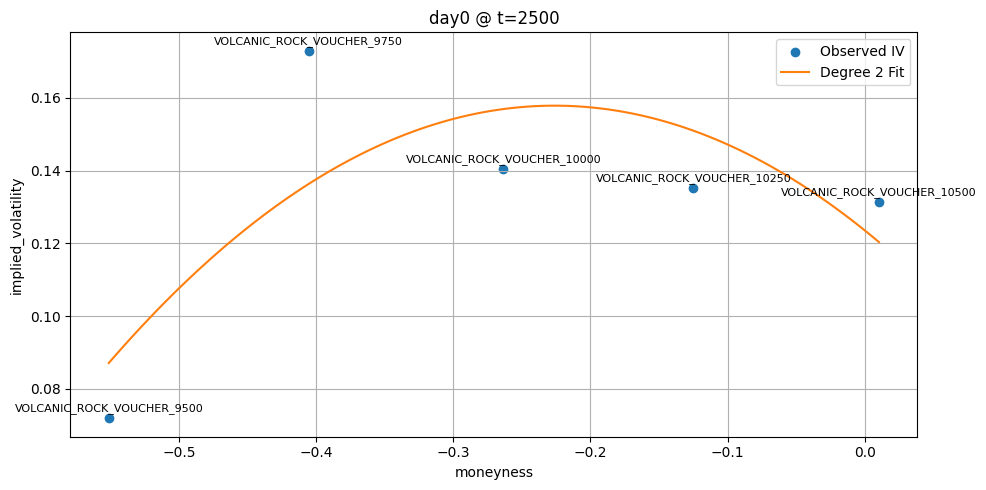

Plotting timestamp 2600...
📈 Spot price of underlying: 10475.0


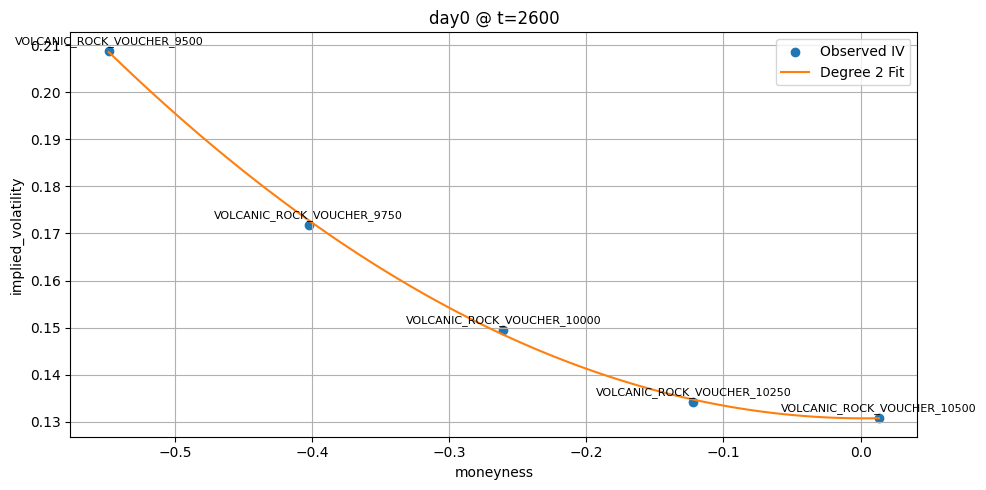

Plotting timestamp 2700...
📈 Spot price of underlying: 10464.5


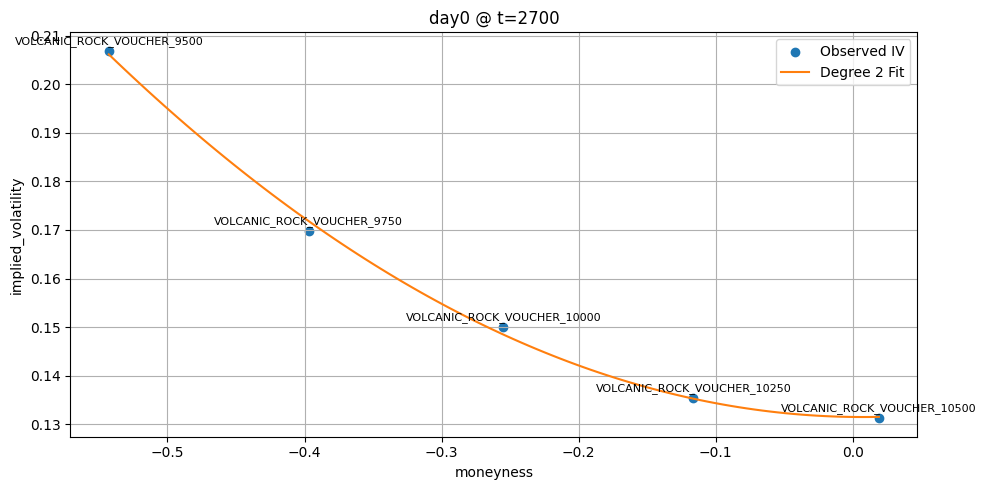

Plotting timestamp 2800...
📈 Spot price of underlying: 10472.5


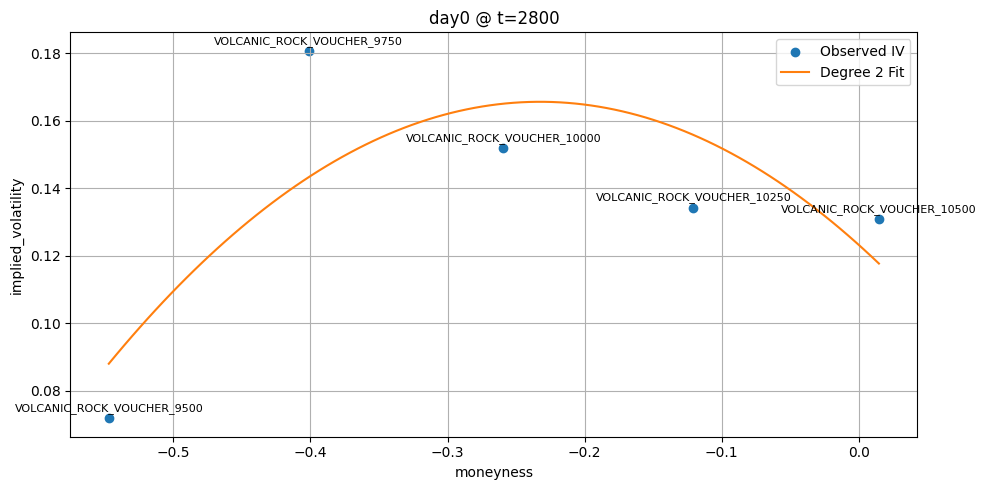

Plotting timestamp 2900...
📈 Spot price of underlying: 10473.0


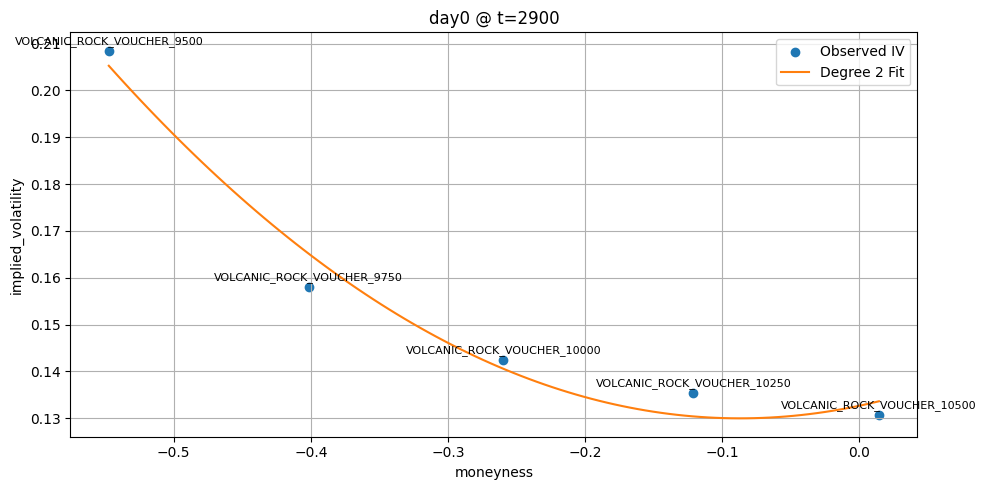

Plotting timestamp 3000...
📈 Spot price of underlying: 10478.5


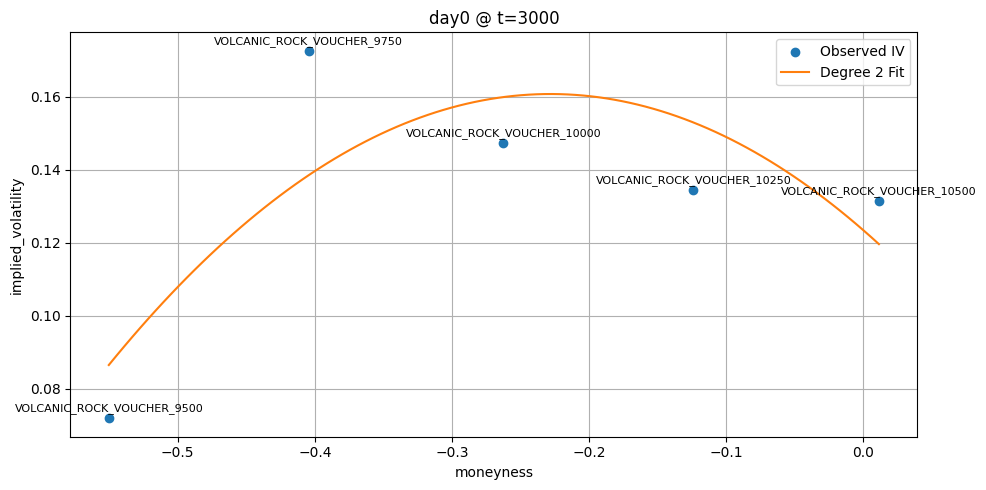

Plotting timestamp 3100...
📈 Spot price of underlying: 10473.5


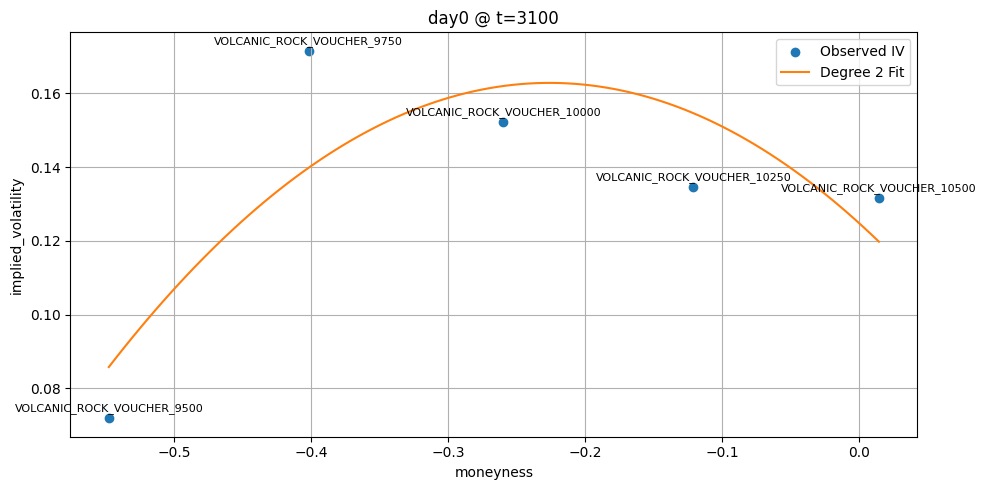

Plotting timestamp 3200...
📈 Spot price of underlying: 10479.0


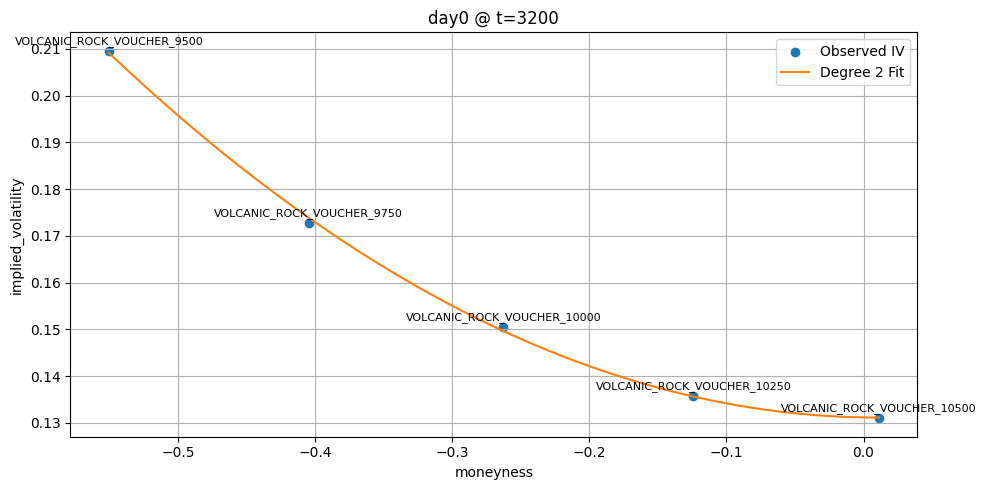

Plotting timestamp 3300...
📈 Spot price of underlying: 10479.5


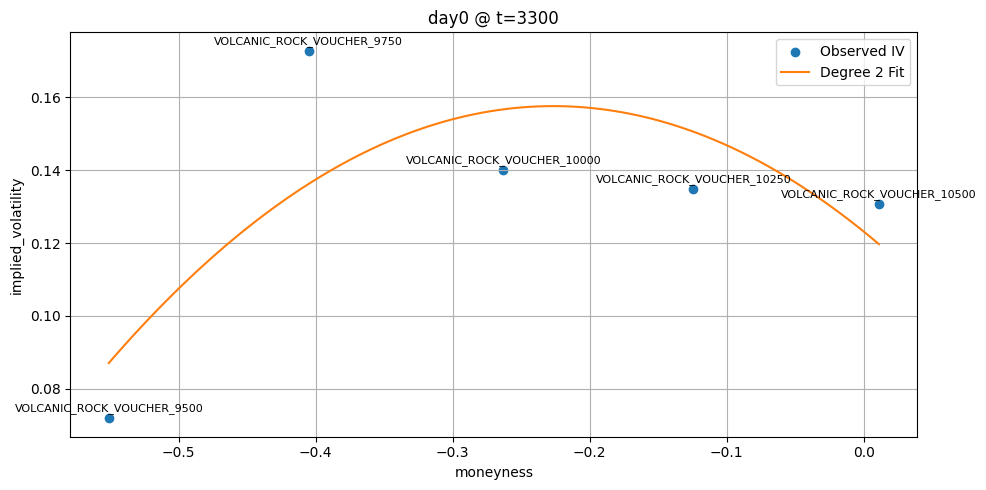

Plotting timestamp 3400...
📈 Spot price of underlying: 10480.0


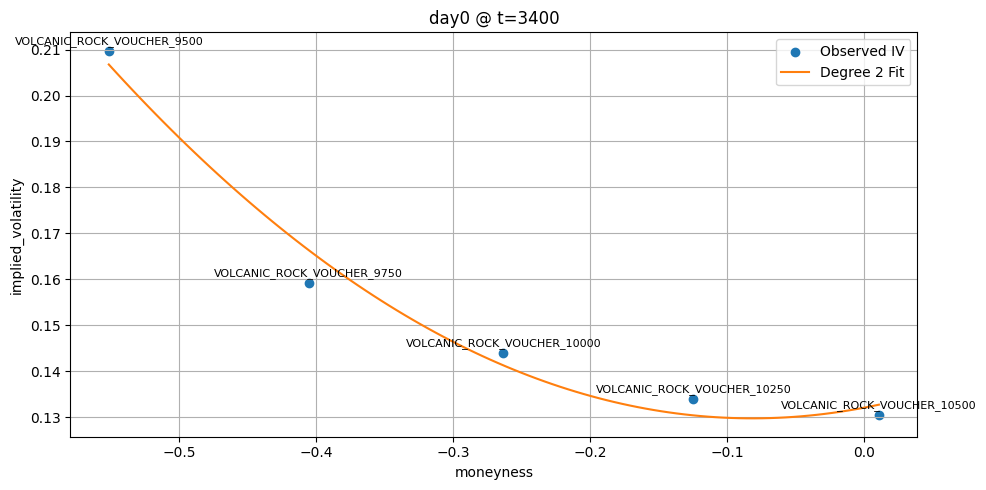

Plotting timestamp 3500...
📈 Spot price of underlying: 10489.0


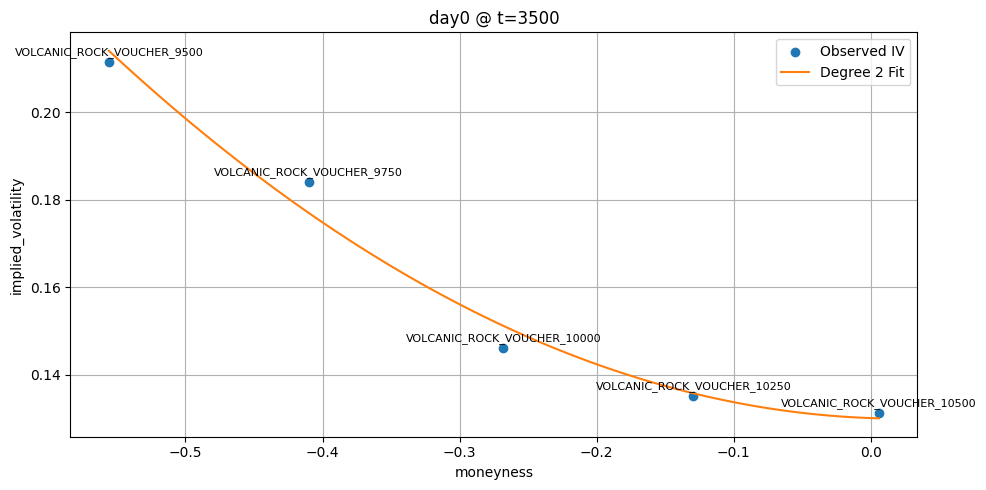

Plotting timestamp 3600...
📈 Spot price of underlying: 10484.0


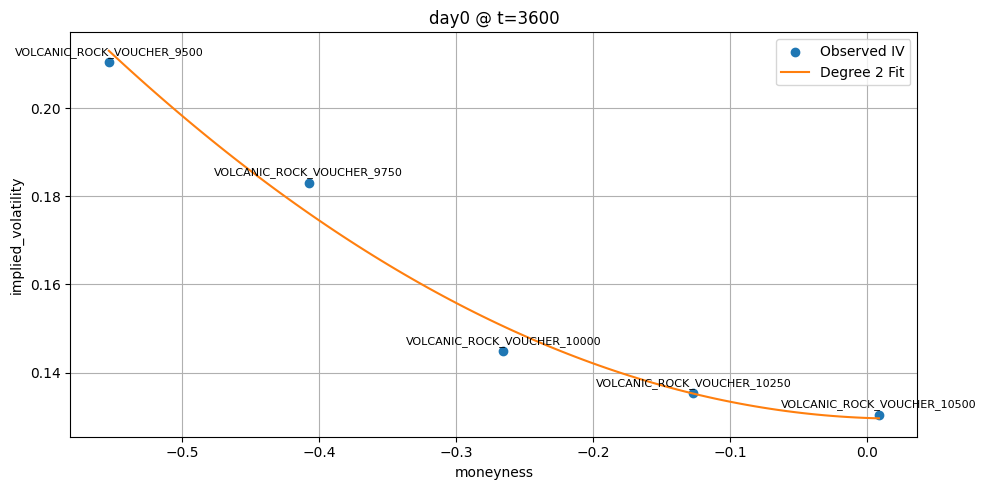

Plotting timestamp 3700...
📈 Spot price of underlying: 10483.0


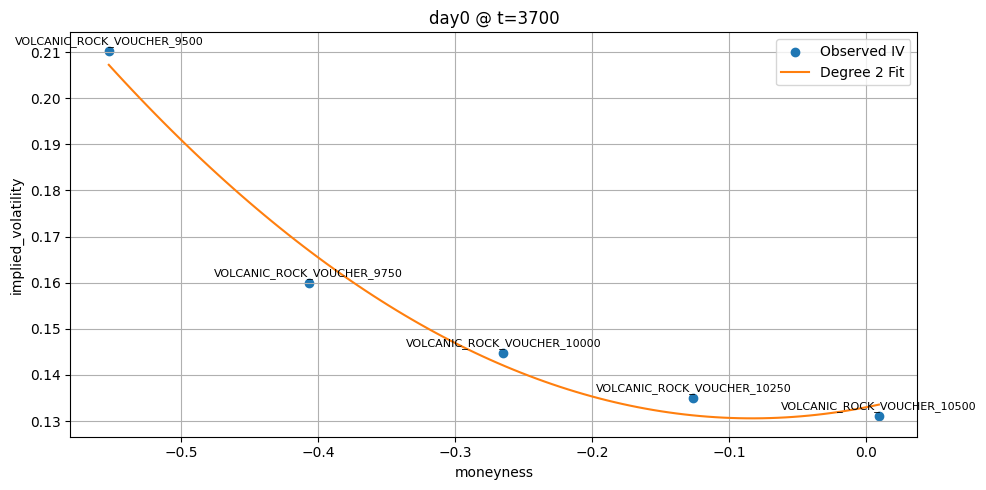

Plotting timestamp 3800...
📈 Spot price of underlying: 10483.5


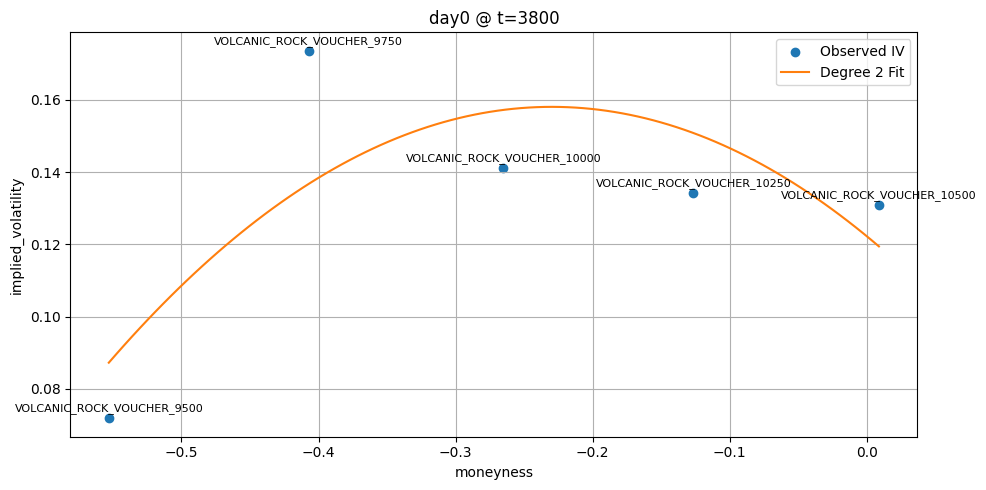

Plotting timestamp 3900...
📈 Spot price of underlying: 10482.0


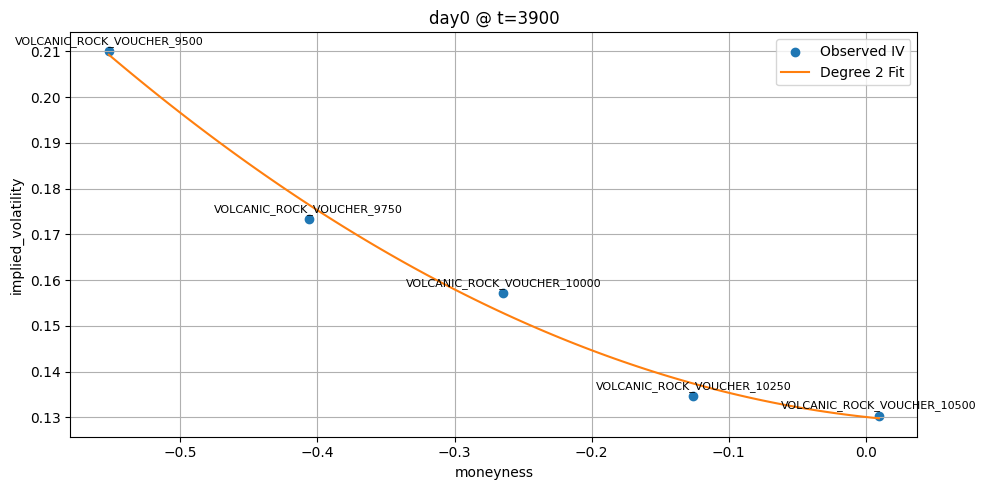

Plotting timestamp 4000...
📈 Spot price of underlying: 10475.5


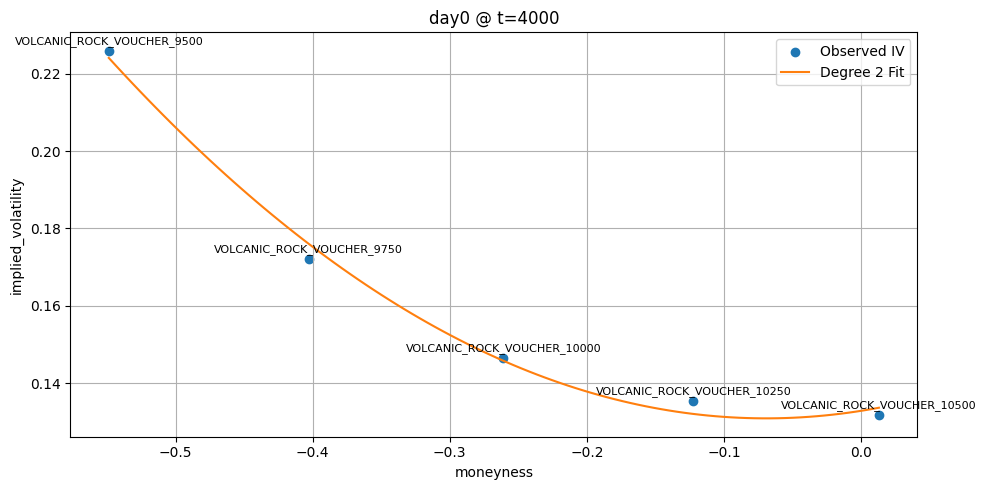

Plotting timestamp 4100...
📈 Spot price of underlying: 10472.5


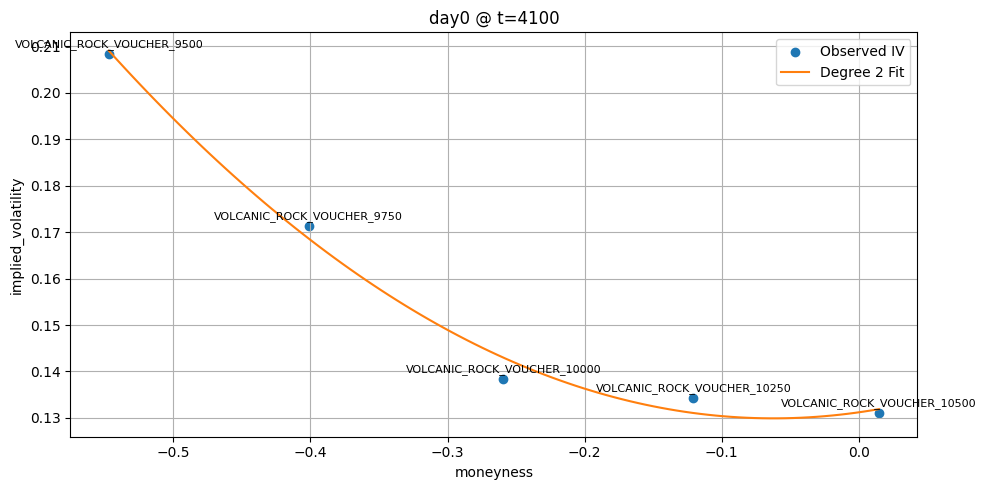

Plotting timestamp 4200...
📈 Spot price of underlying: 10466.5


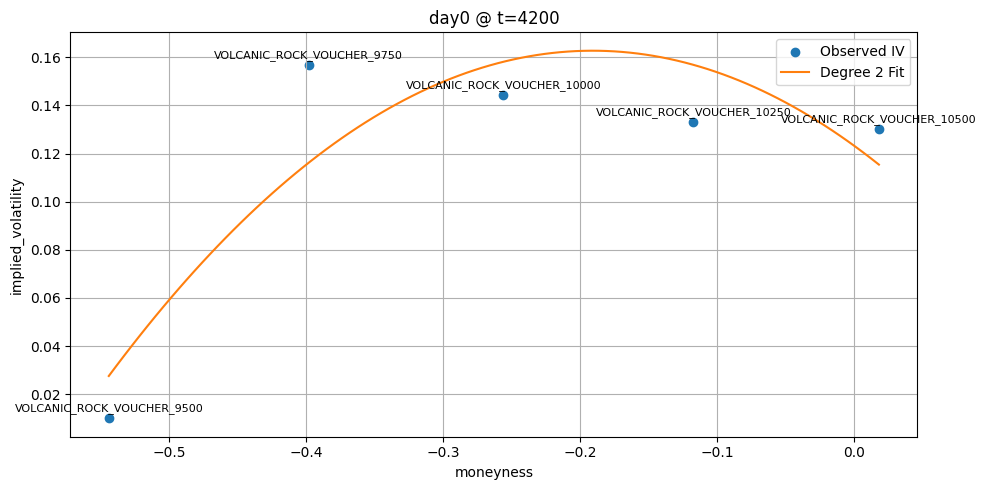

Plotting timestamp 4300...
📈 Spot price of underlying: 10464.5


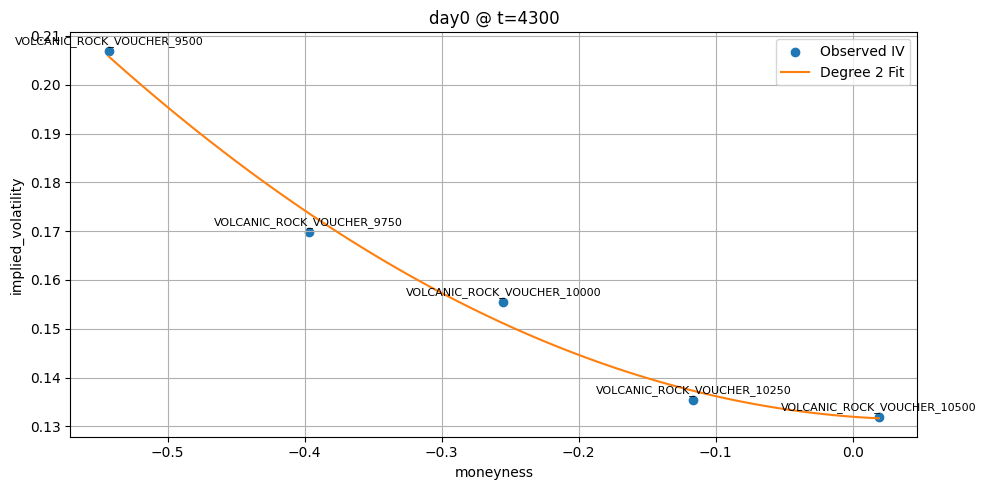

Plotting timestamp 4400...
📈 Spot price of underlying: 10458.5


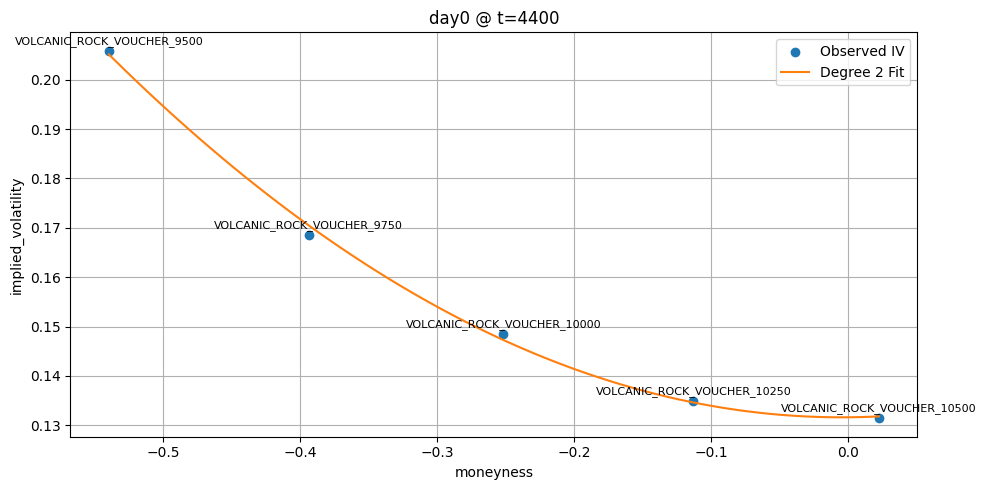

Plotting timestamp 4500...
📈 Spot price of underlying: 10458.0


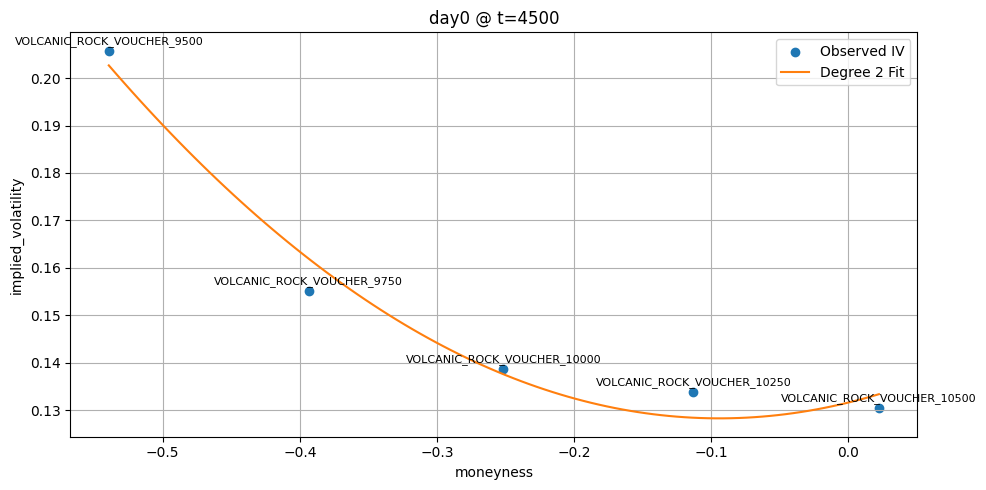

Plotting timestamp 4600...
📈 Spot price of underlying: 10451.5


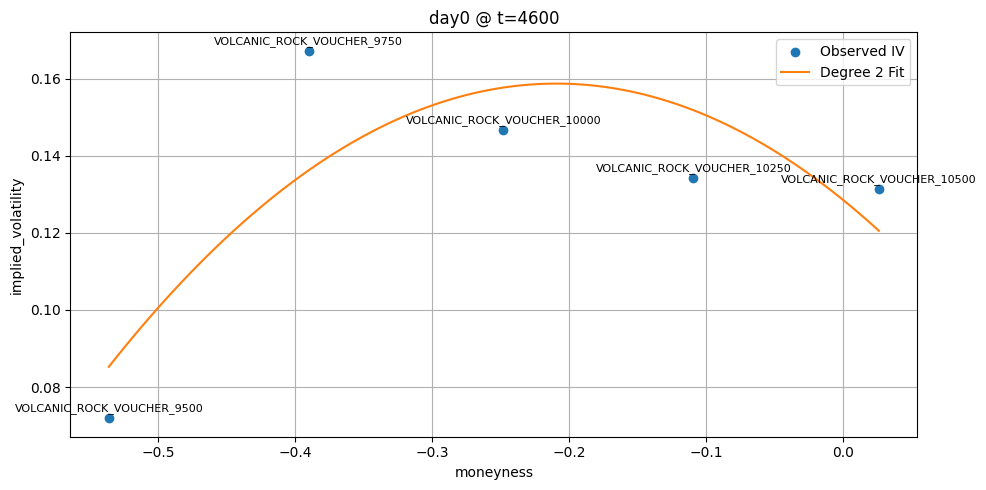

Plotting timestamp 4700...
📈 Spot price of underlying: 10457.5


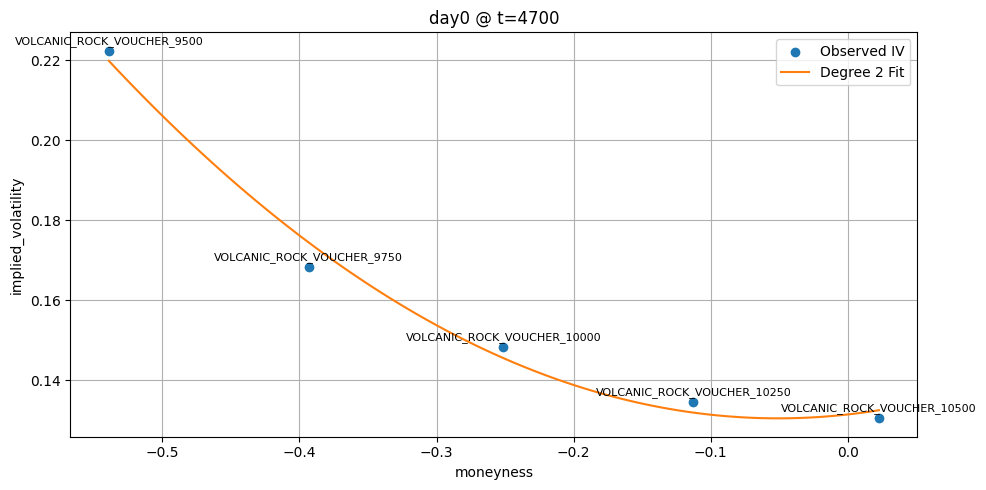

Plotting timestamp 4800...
📈 Spot price of underlying: 10464.0


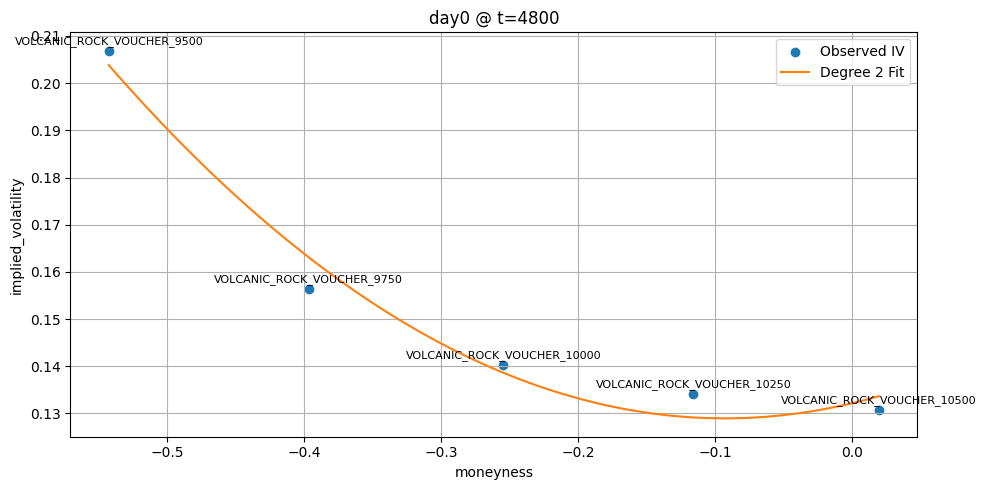

Plotting timestamp 4900...
📈 Spot price of underlying: 10464.5


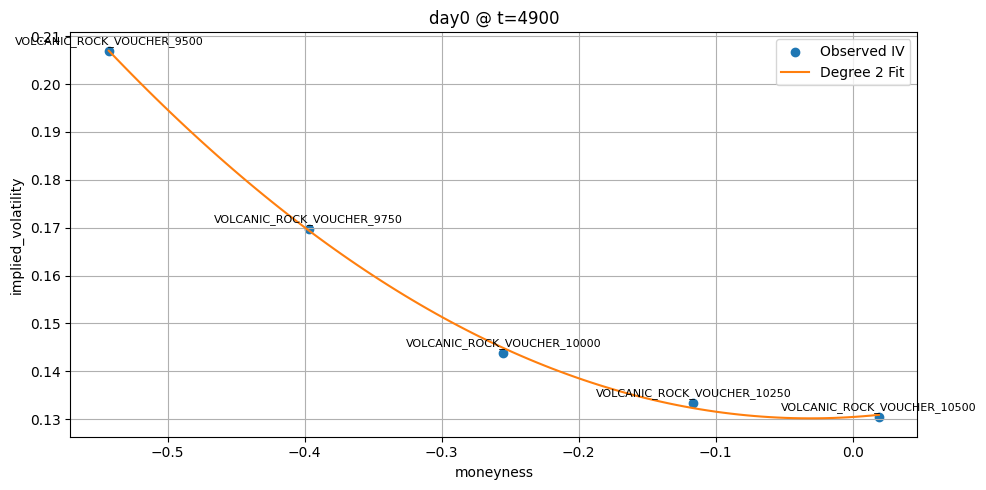

Plotting timestamp 5000...
📈 Spot price of underlying: 10462.5


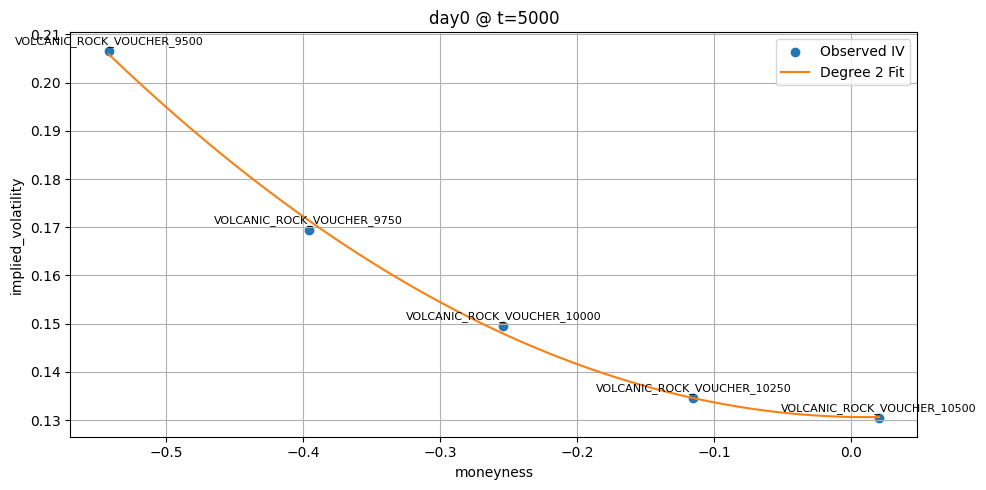

Plotting timestamp 5100...
📈 Spot price of underlying: 10453.0


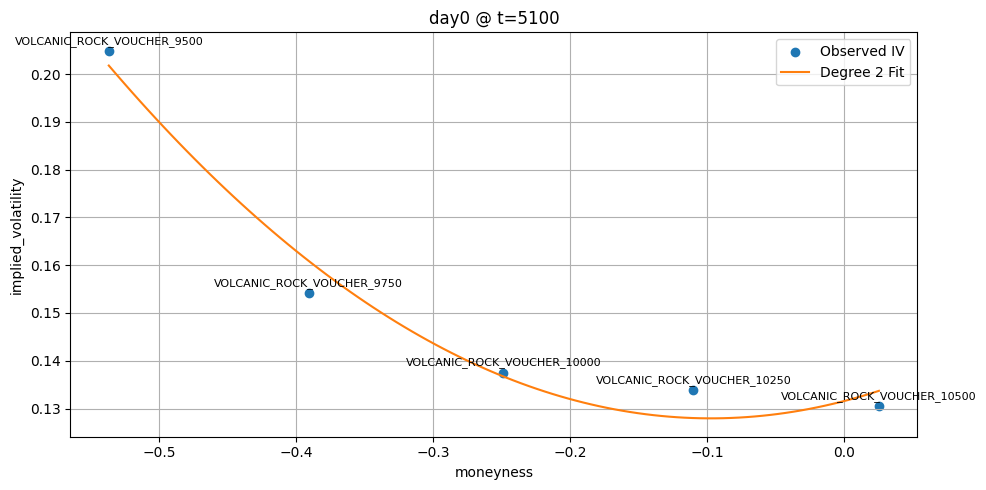

Plotting timestamp 5200...
📈 Spot price of underlying: 10455.0


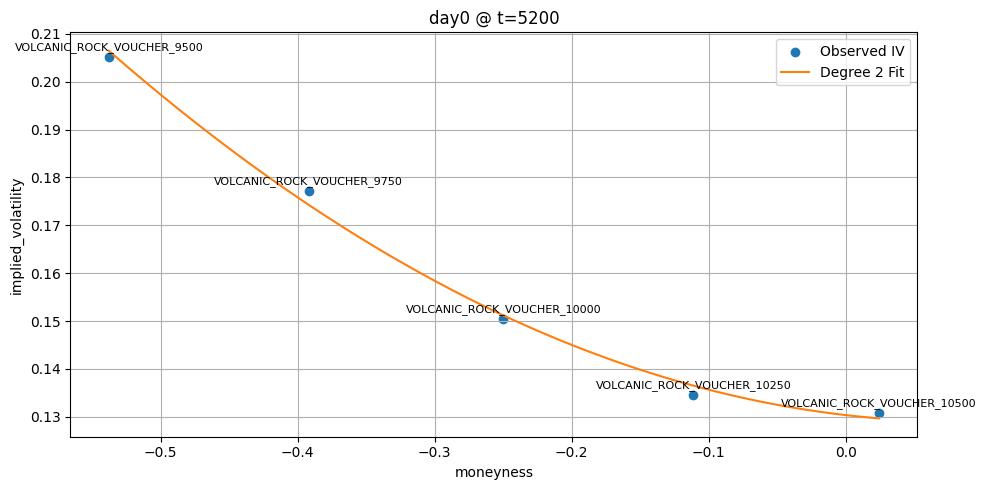

Plotting timestamp 5300...
📈 Spot price of underlying: 10451.0


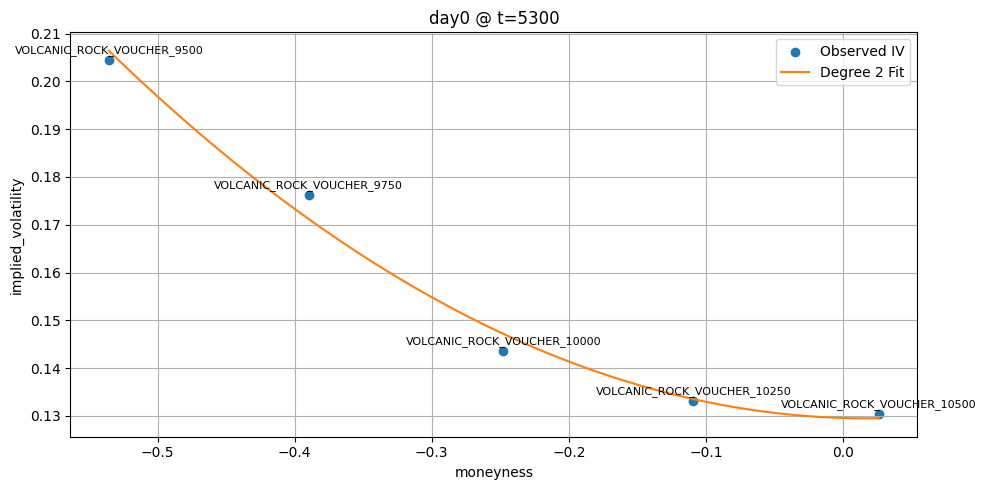

Plotting timestamp 5400...
📈 Spot price of underlying: 10450.0


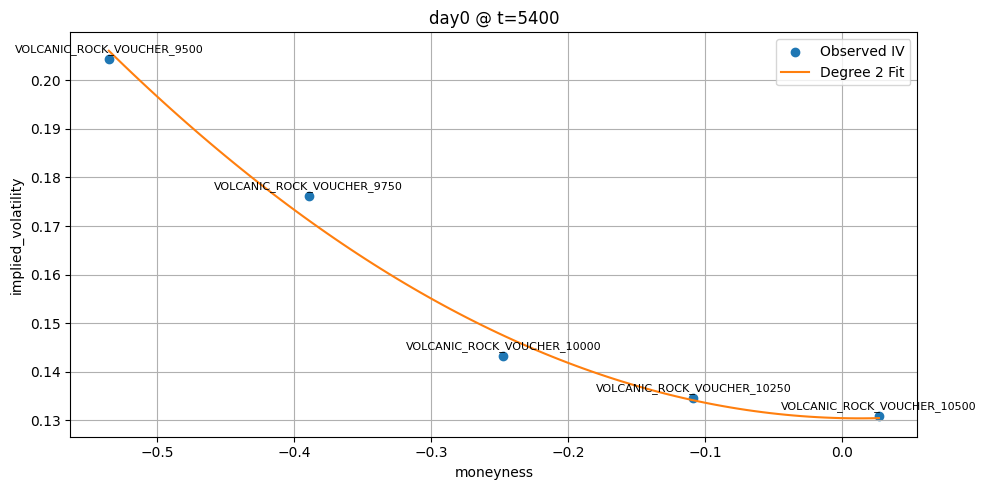

Plotting timestamp 5500...
📈 Spot price of underlying: 10441.0


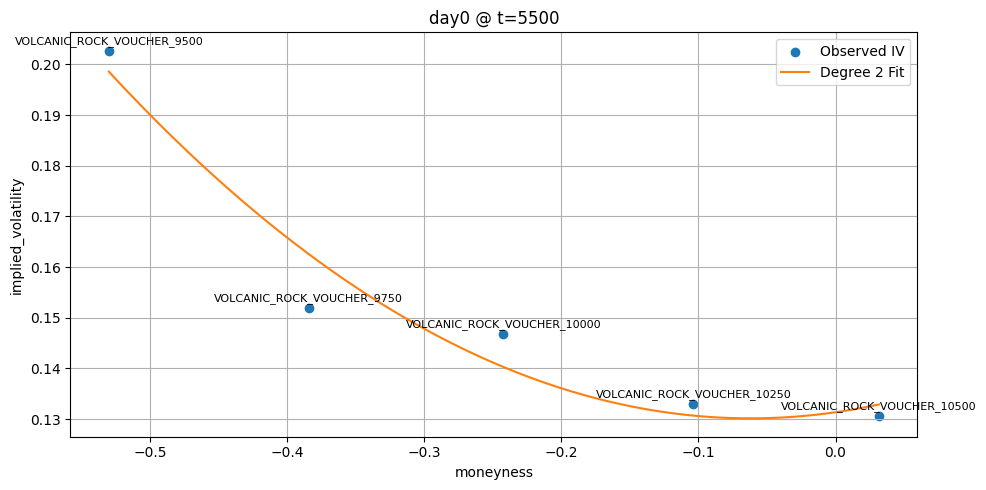

Plotting timestamp 5600...
📈 Spot price of underlying: 10445.5


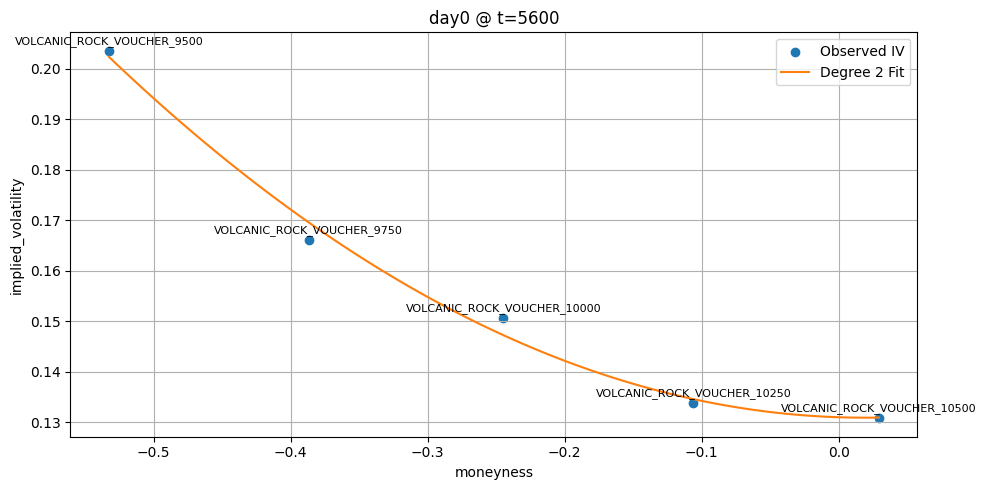

Plotting timestamp 5700...
📈 Spot price of underlying: 10444.0


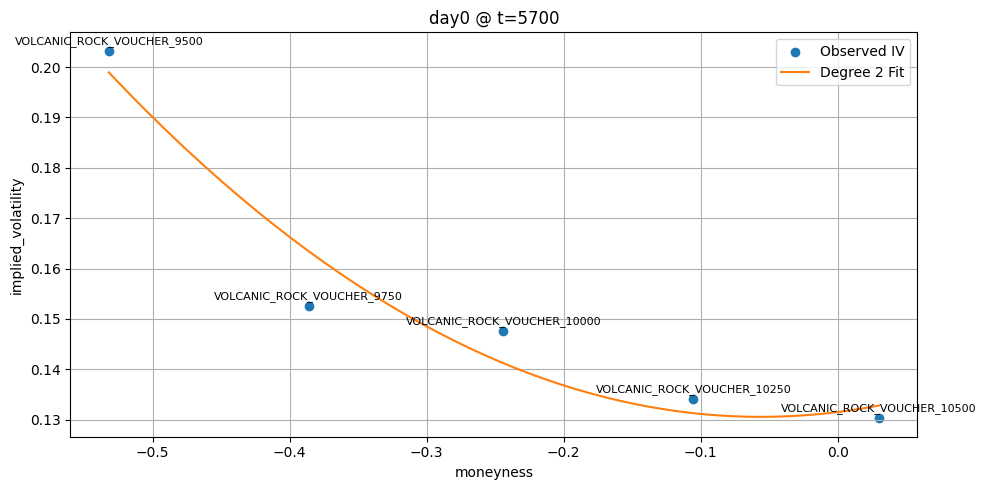

Plotting timestamp 5800...
📈 Spot price of underlying: 10439.5


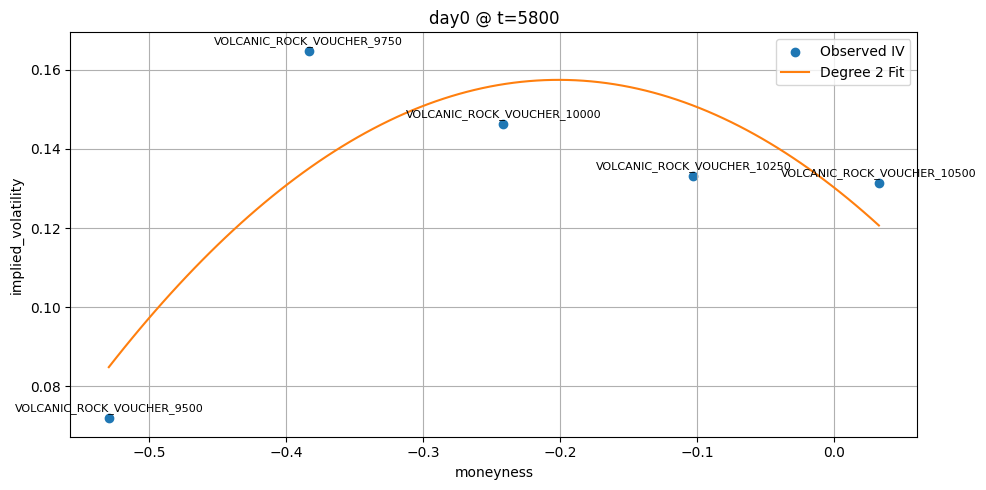

Plotting timestamp 5900...
📈 Spot price of underlying: 10431.5


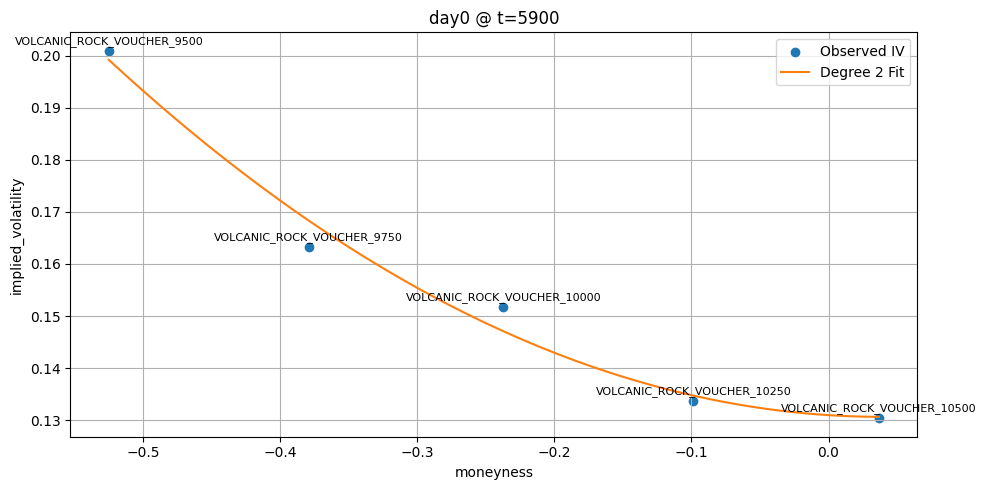

Plotting timestamp 6000...
📈 Spot price of underlying: 10445.0


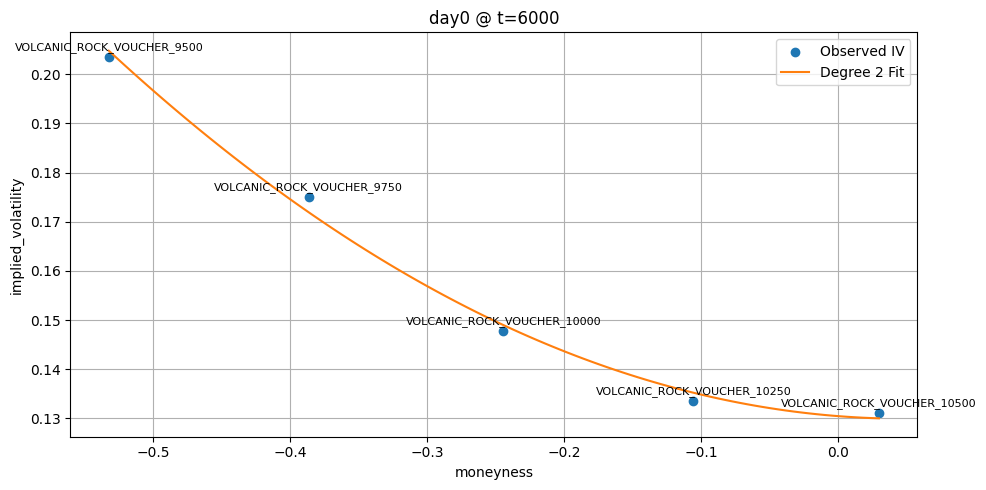

Plotting timestamp 6100...
📈 Spot price of underlying: 10440.5


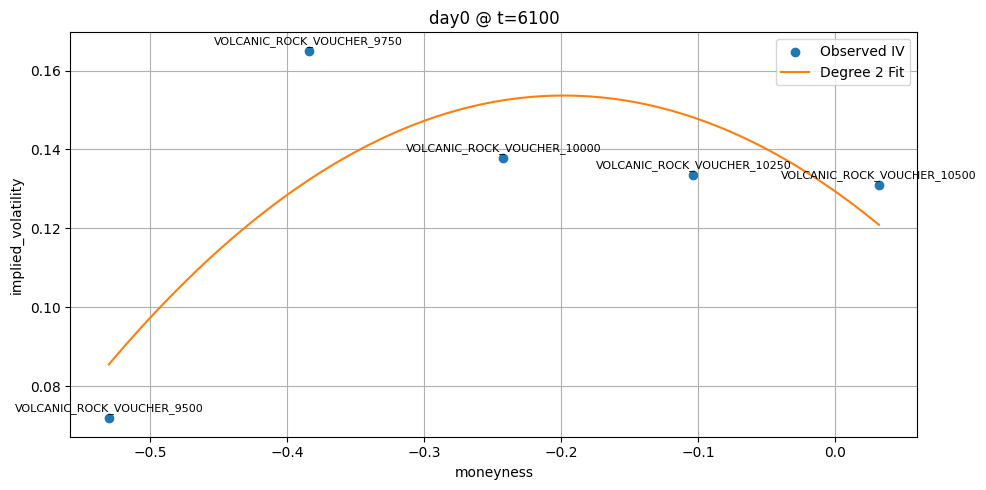

Plotting timestamp 6200...
📈 Spot price of underlying: 10447.0


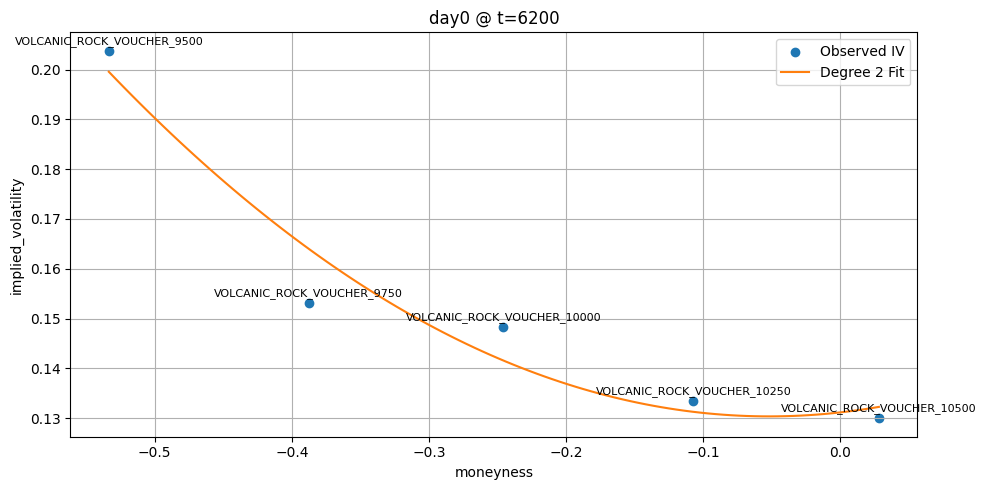

Plotting timestamp 6300...
📈 Spot price of underlying: 10440.5


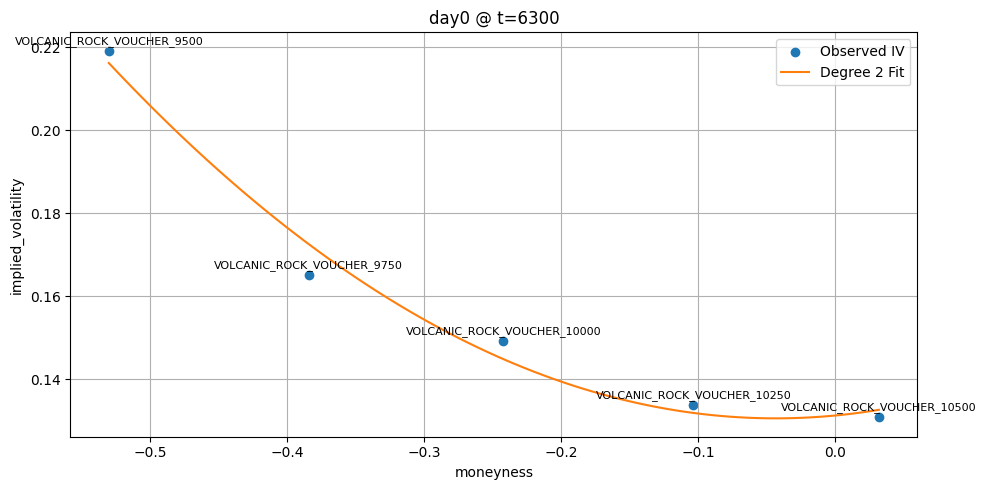

Plotting timestamp 6400...
📈 Spot price of underlying: 10442.5


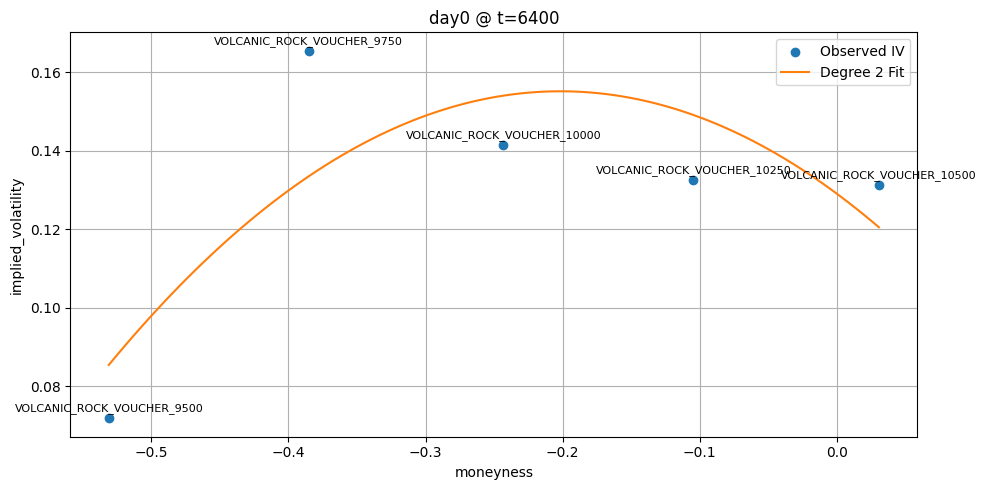

Plotting timestamp 6500...
📈 Spot price of underlying: 10443.5


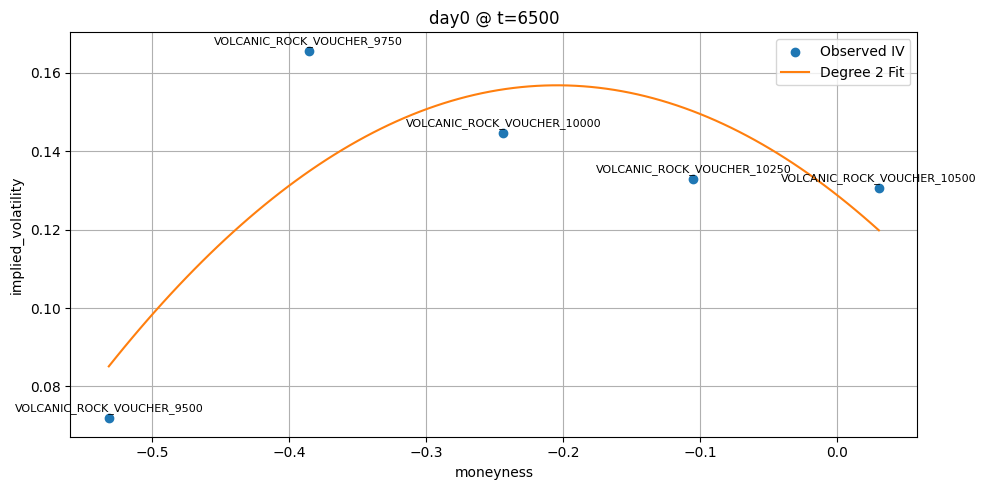

Plotting timestamp 6600...
📈 Spot price of underlying: 10440.0


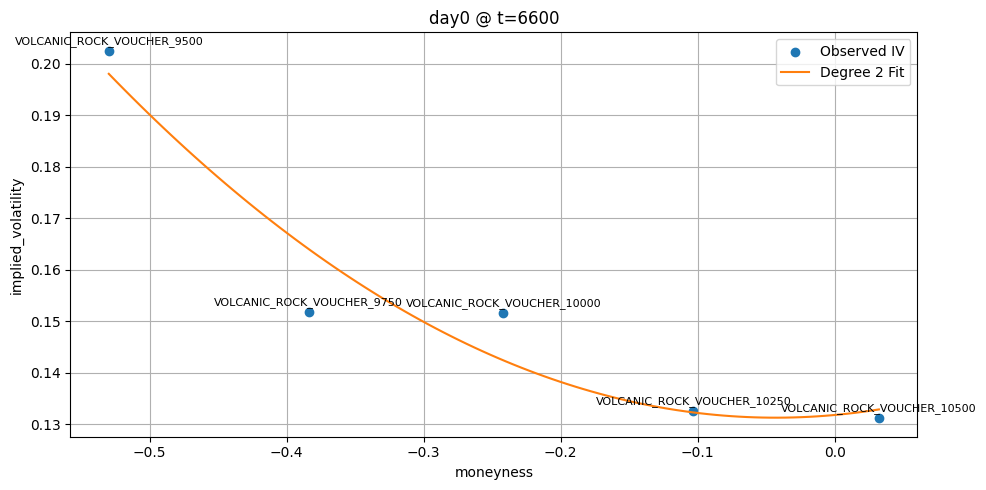

Plotting timestamp 6700...
📈 Spot price of underlying: 10426.0


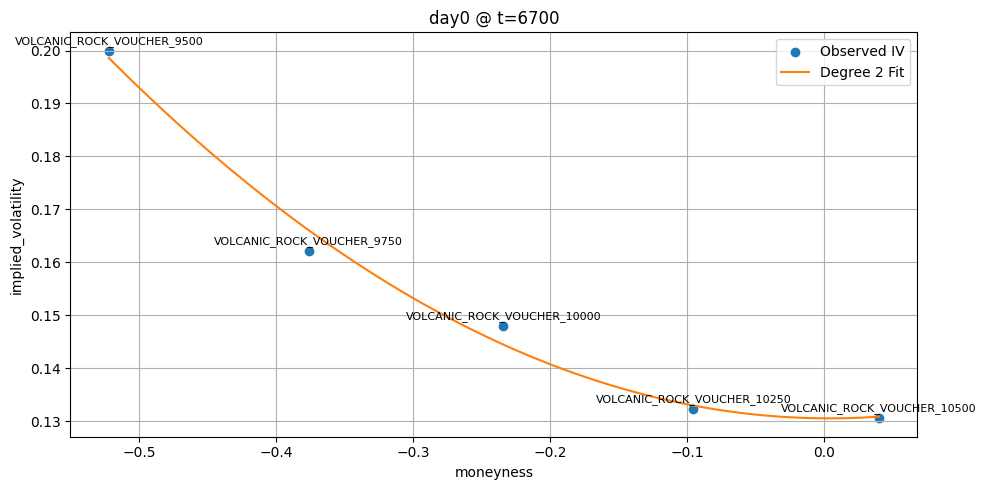

Plotting timestamp 6800...
📈 Spot price of underlying: 10432.5


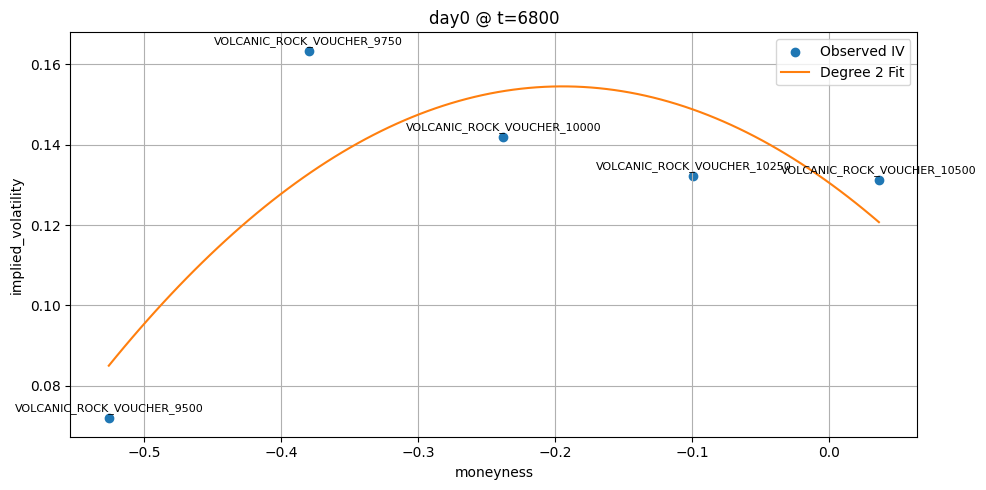

Plotting timestamp 6900...
📈 Spot price of underlying: 10433.0


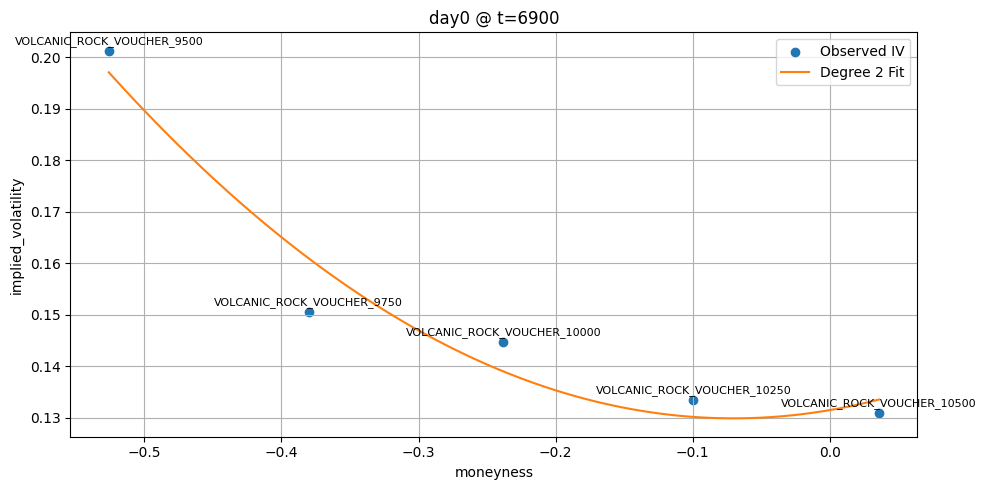

Plotting timestamp 7000...
📈 Spot price of underlying: 10431.5


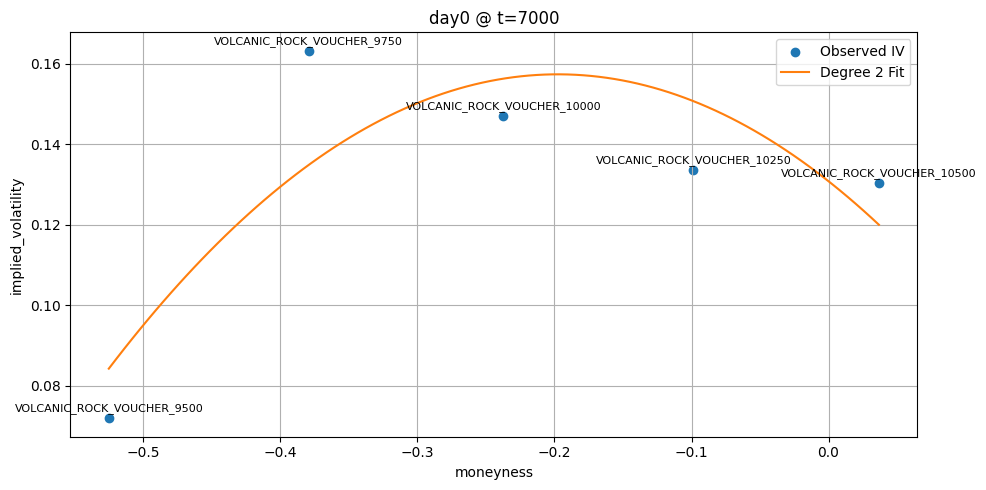

Plotting timestamp 7100...
📈 Spot price of underlying: 10435.0


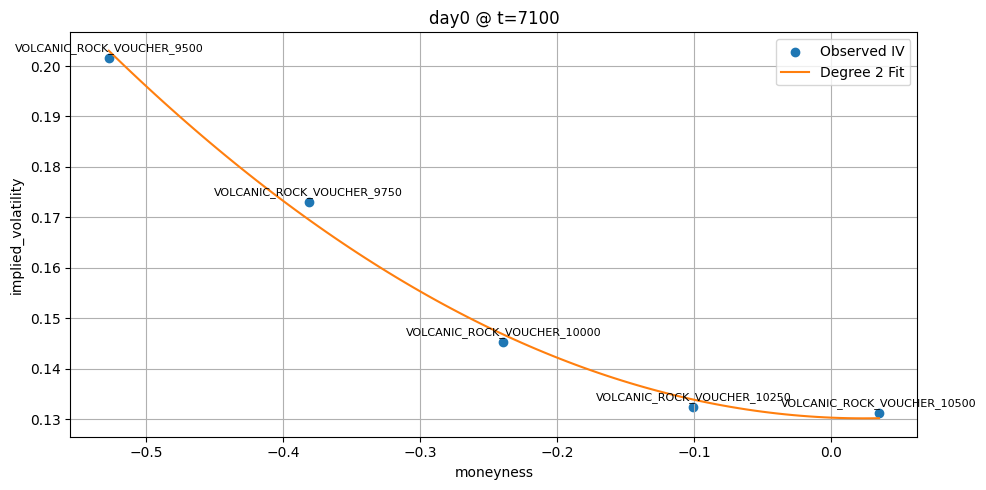

Plotting timestamp 7200...
📈 Spot price of underlying: 10438.5


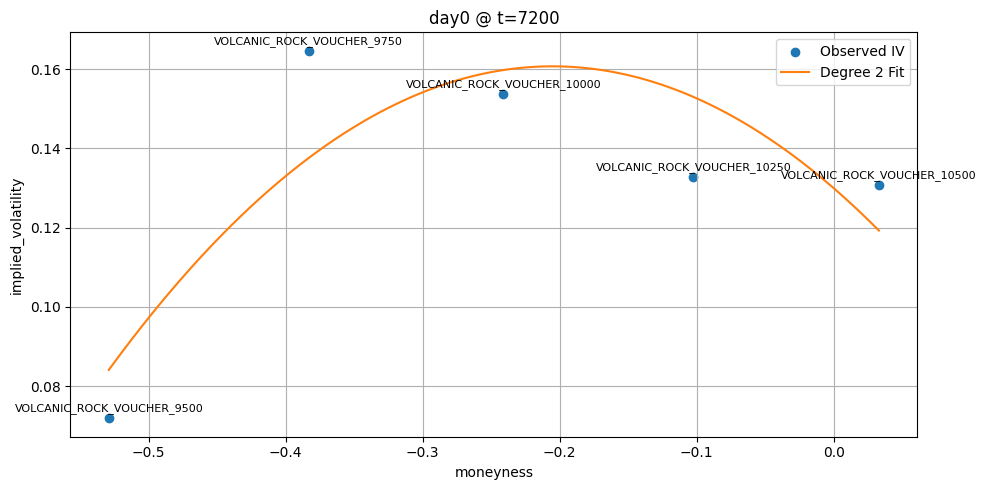

Plotting timestamp 7300...
📈 Spot price of underlying: 10437.0


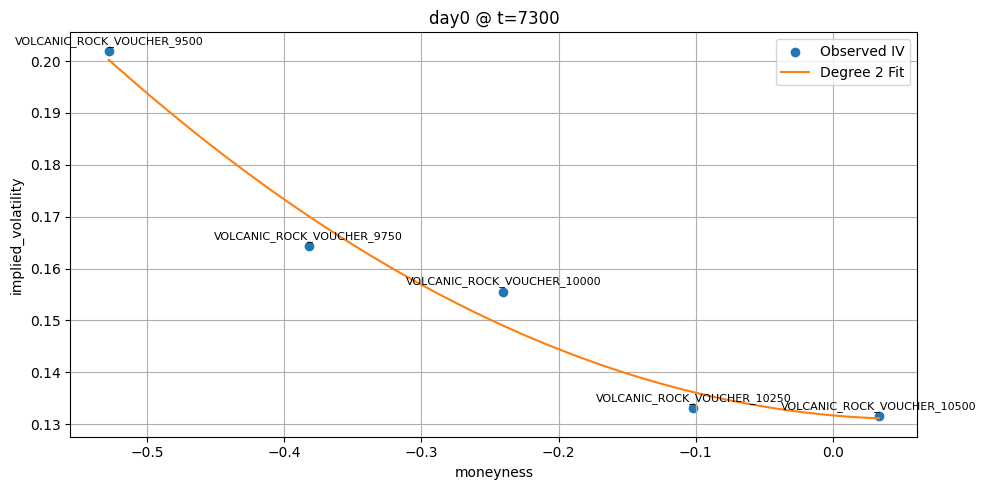

Plotting timestamp 7400...
📈 Spot price of underlying: 10438.5


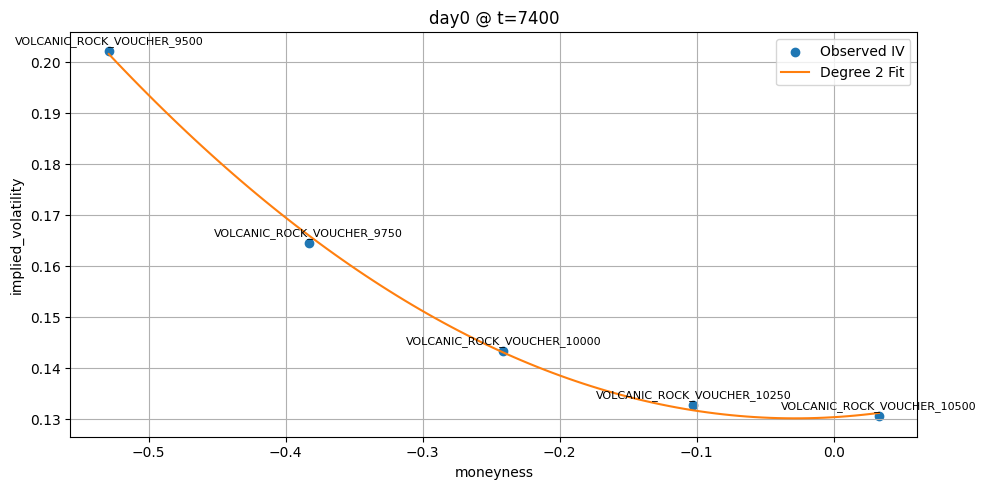

Plotting timestamp 7500...
📈 Spot price of underlying: 10441.5


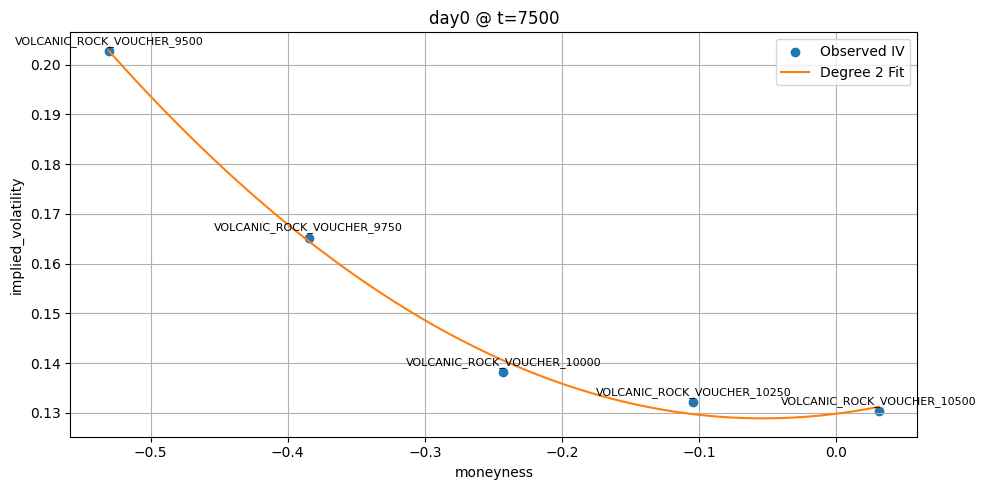

Plotting timestamp 7600...
📈 Spot price of underlying: 10441.5


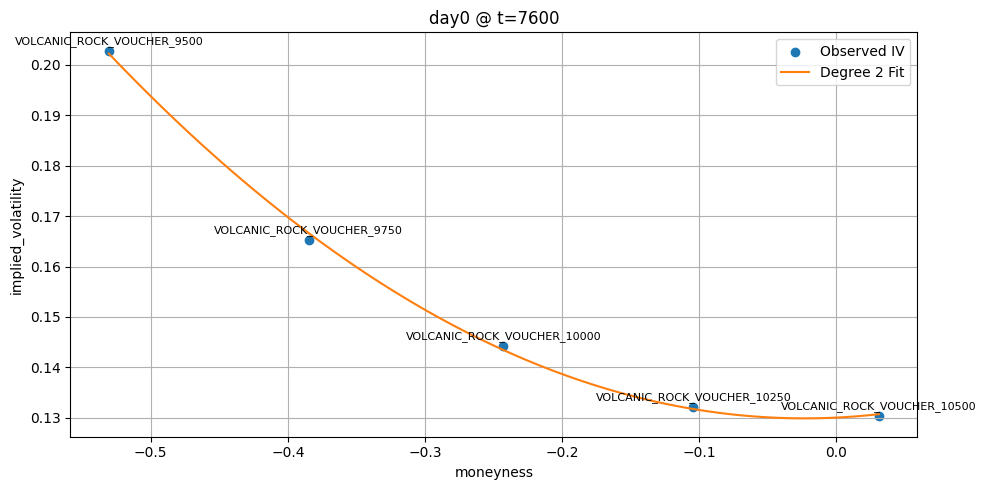

Plotting timestamp 7700...
📈 Spot price of underlying: 10436.0


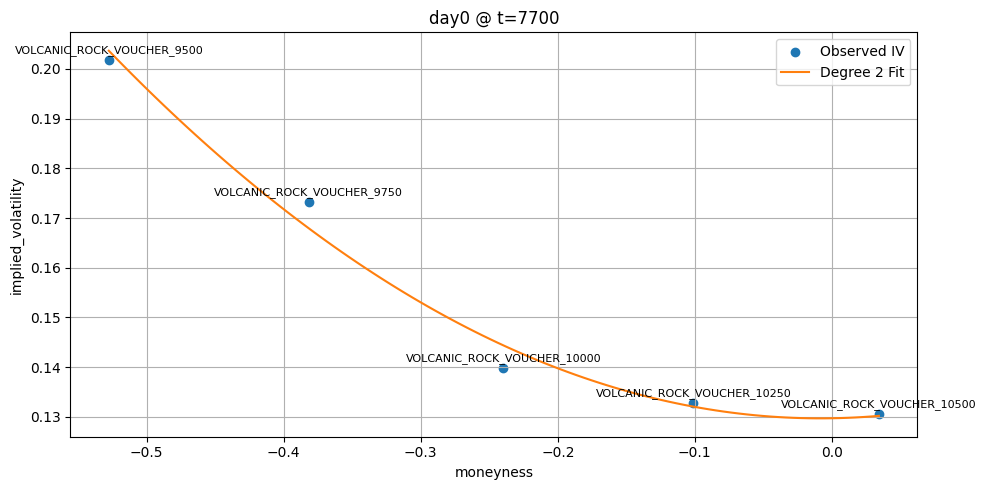

Plotting timestamp 7800...
📈 Spot price of underlying: 10440.5


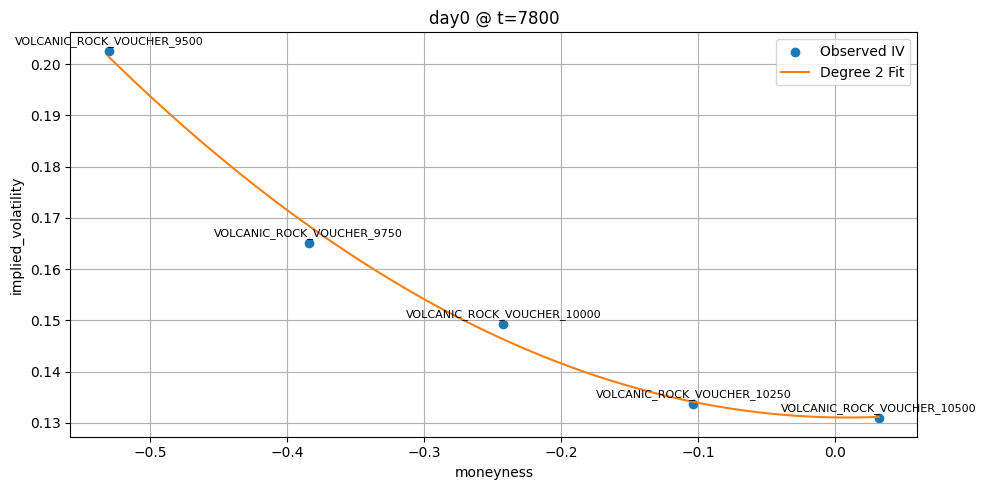

Plotting timestamp 7900...
📈 Spot price of underlying: 10447.5


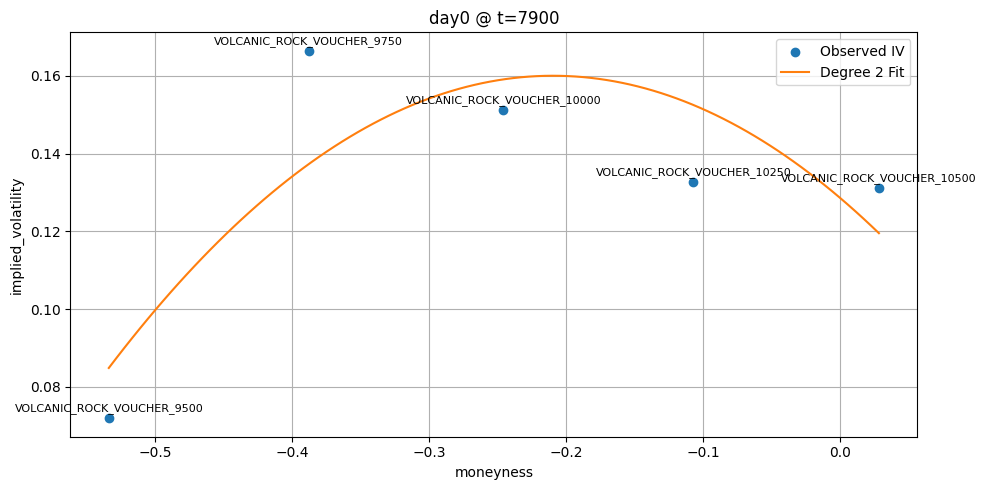

Plotting timestamp 8000...
📈 Spot price of underlying: 10442.5


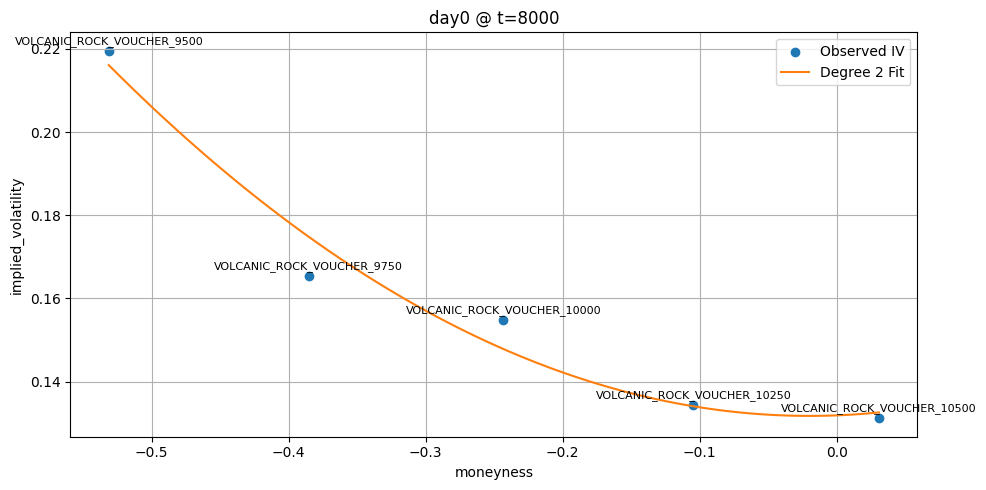

Plotting timestamp 8100...
📈 Spot price of underlying: 10447.5


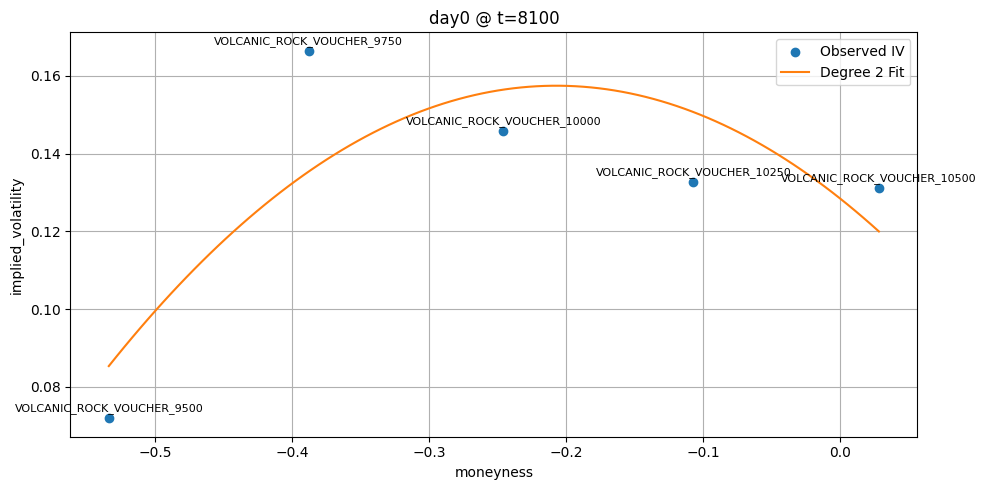

Plotting timestamp 8200...
📈 Spot price of underlying: 10451.0


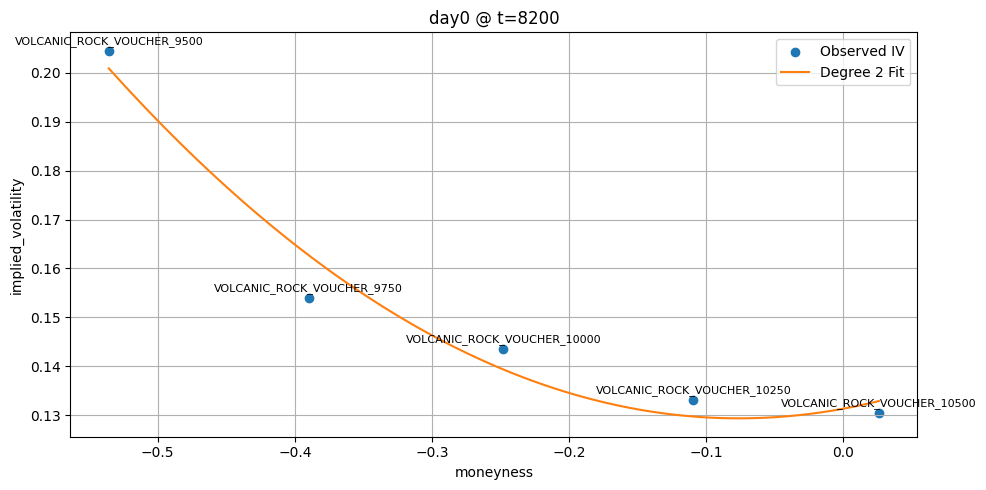

Plotting timestamp 8300...
📈 Spot price of underlying: 10440.5


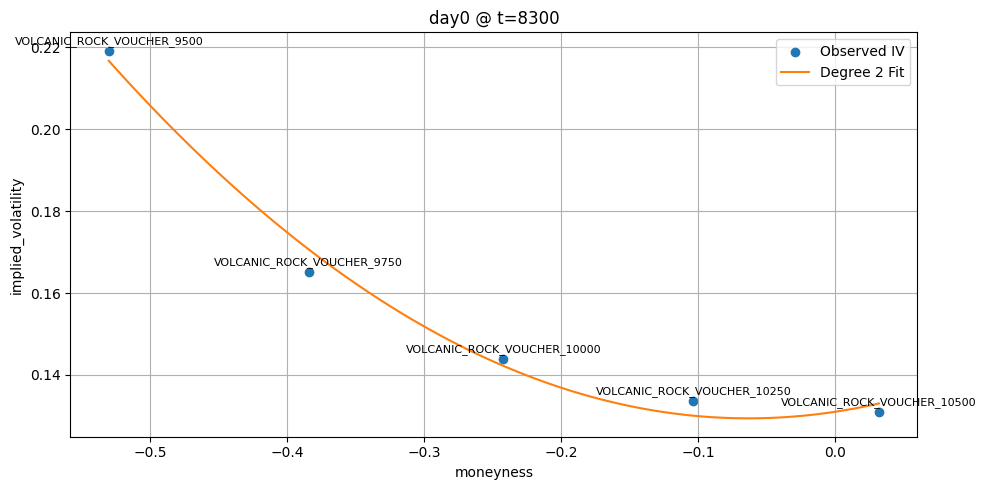

Plotting timestamp 8400...
📈 Spot price of underlying: 10444.5


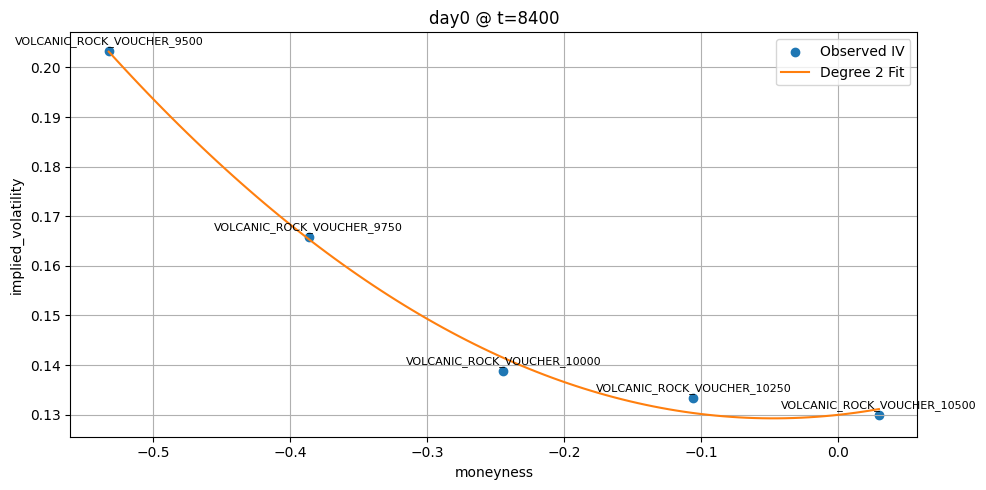

Plotting timestamp 8500...
📈 Spot price of underlying: 10447.0


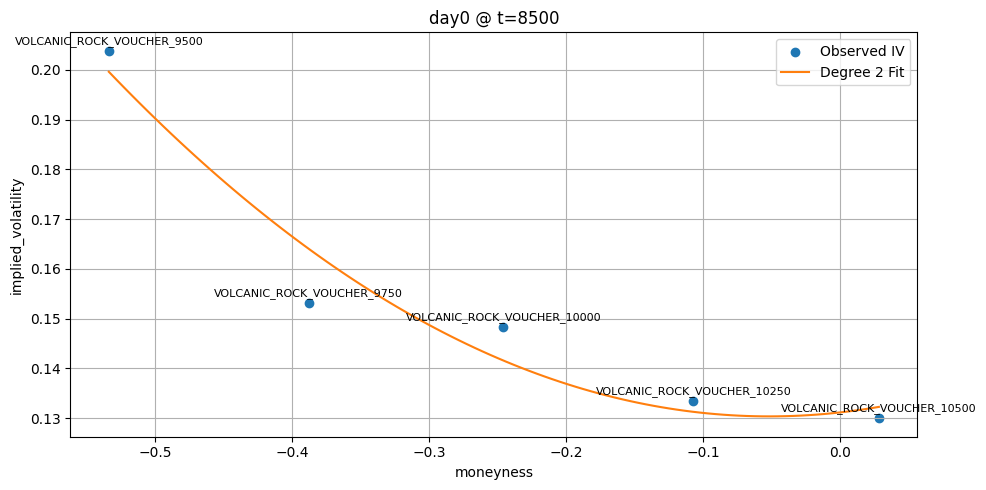

Plotting timestamp 8600...
📈 Spot price of underlying: 10441.0


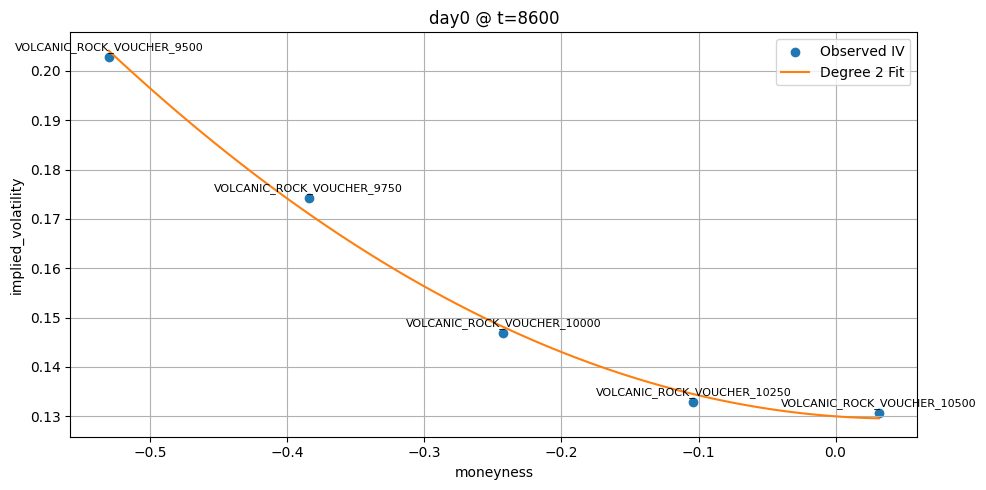

Plotting timestamp 8700...
📈 Spot price of underlying: 10436.5


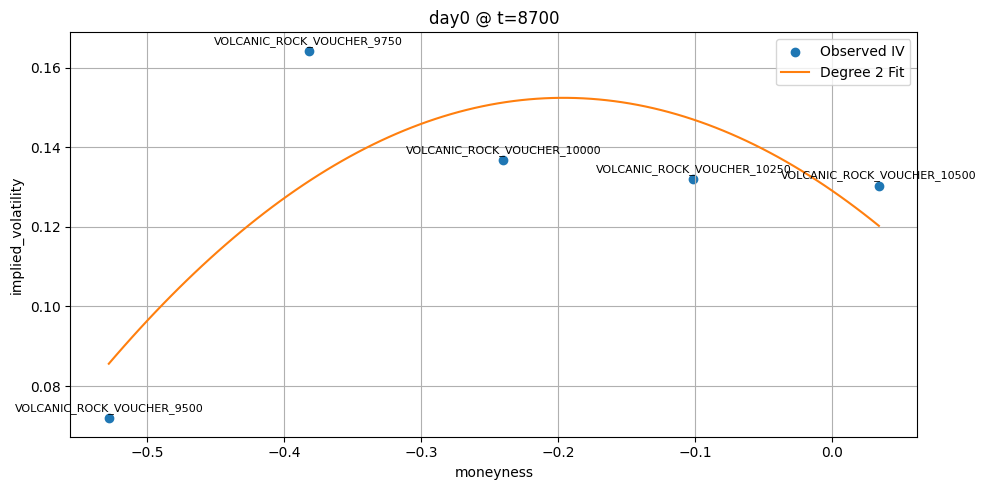

Plotting timestamp 8800...
📈 Spot price of underlying: 10432.5


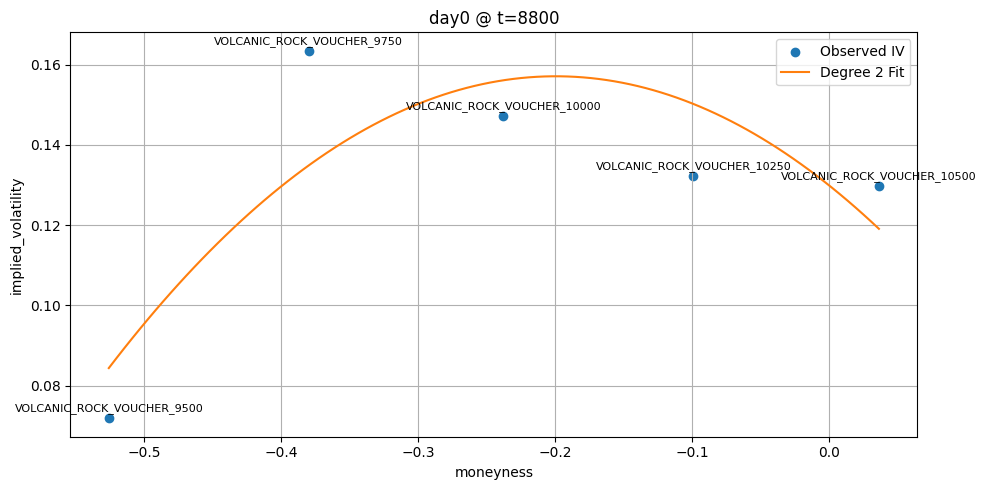

Plotting timestamp 8900...
📈 Spot price of underlying: 10431.0


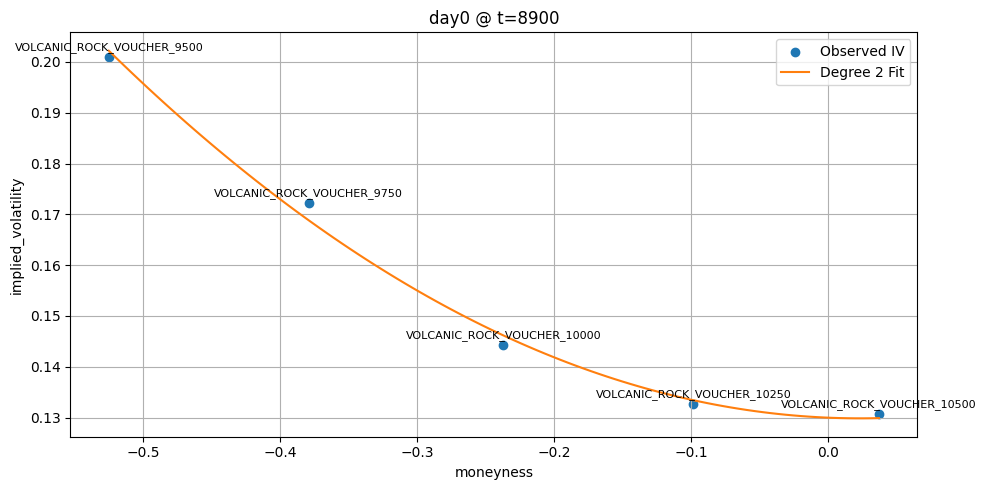

Plotting timestamp 9000...
📈 Spot price of underlying: 10432.0


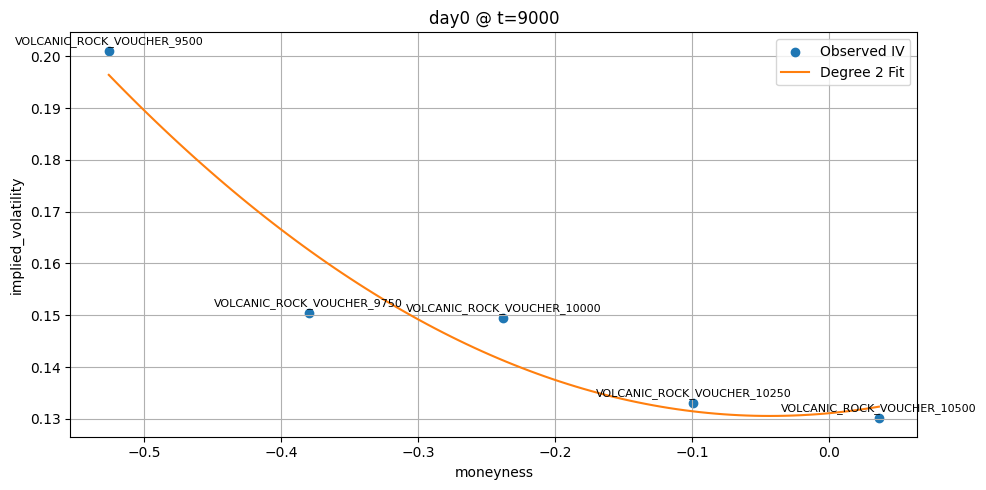

Plotting timestamp 9100...
📈 Spot price of underlying: 10423.5


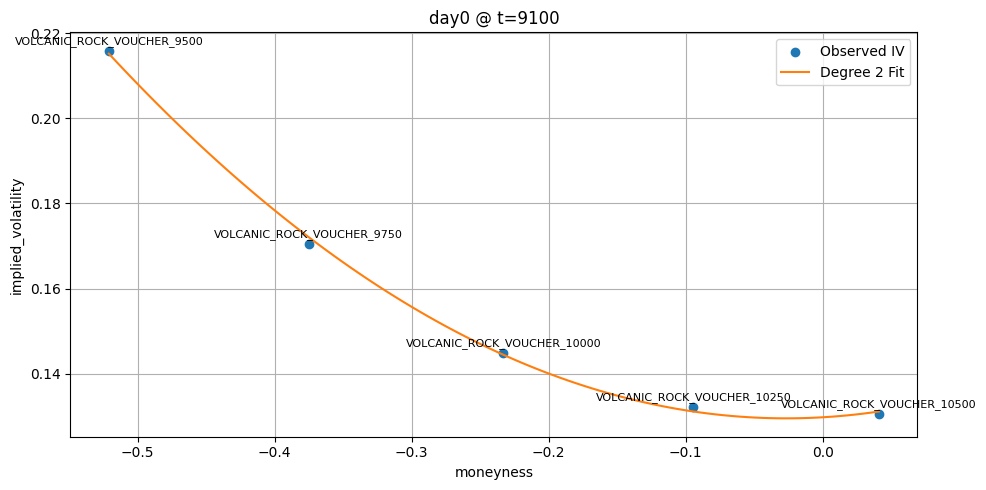

Plotting timestamp 9200...
📈 Spot price of underlying: 10424.5


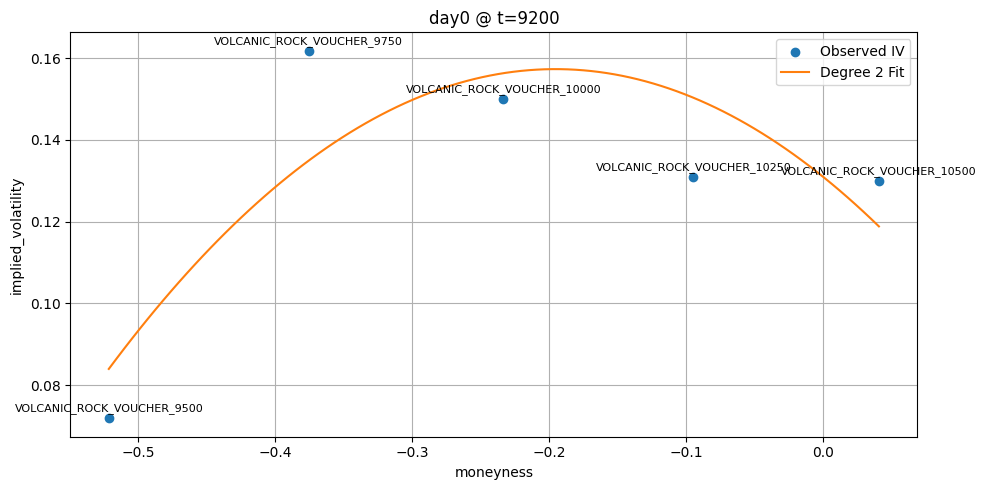

Plotting timestamp 9300...
📈 Spot price of underlying: 10422.5


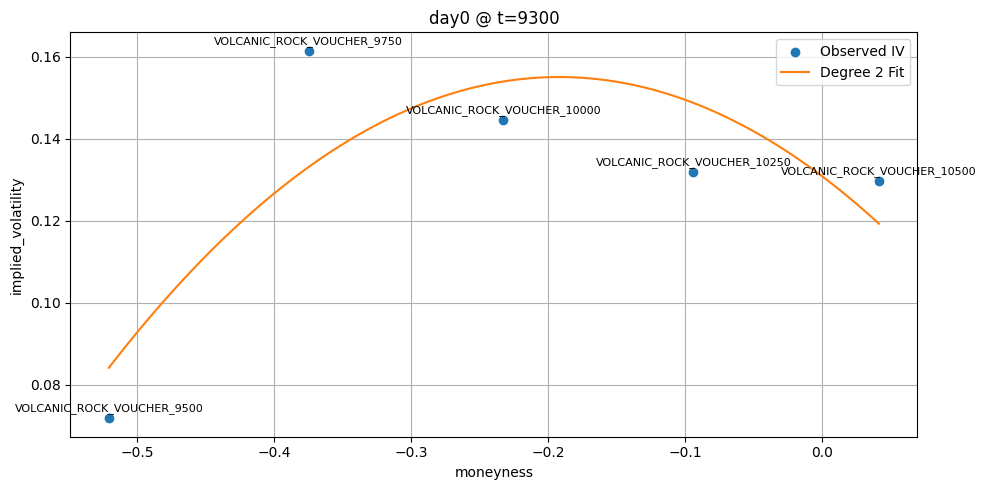

Plotting timestamp 9400...
📈 Spot price of underlying: 10425.5


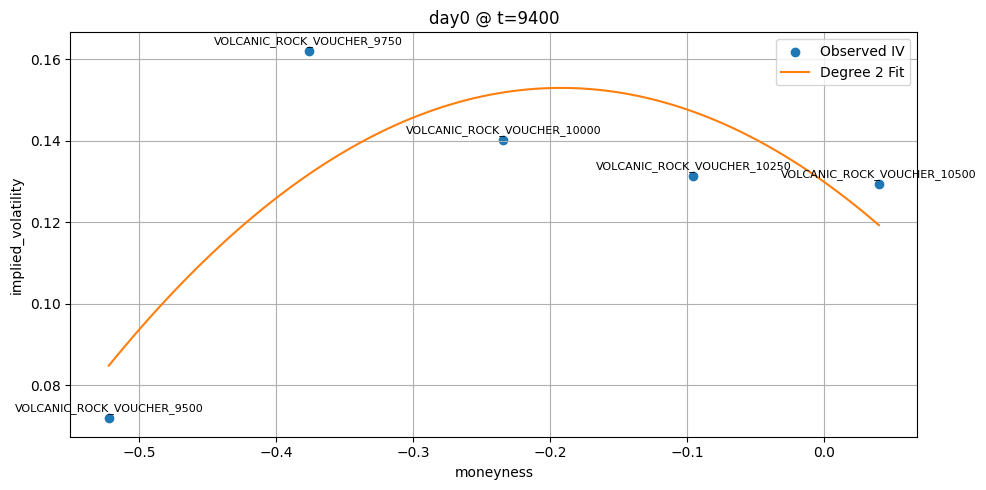

Plotting timestamp 9500...
📈 Spot price of underlying: 10425.5


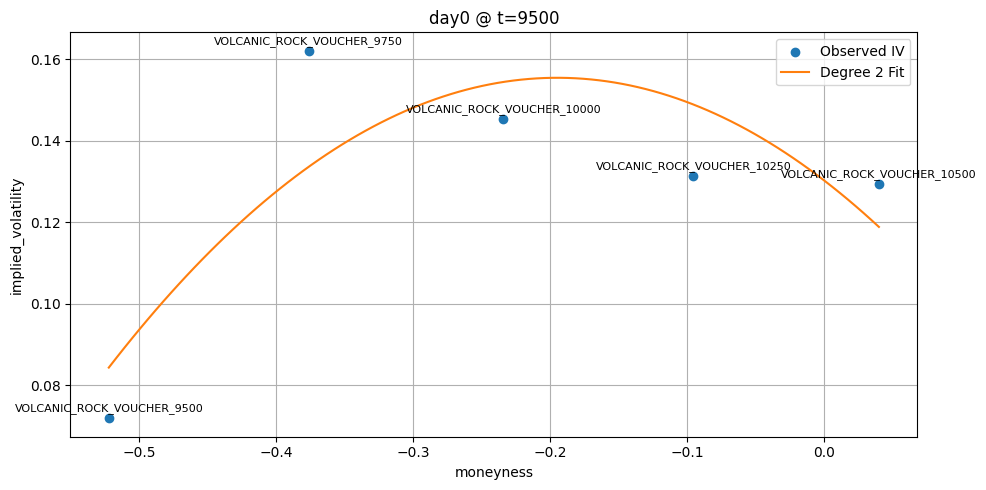

Plotting timestamp 9600...
📈 Spot price of underlying: 10431.5


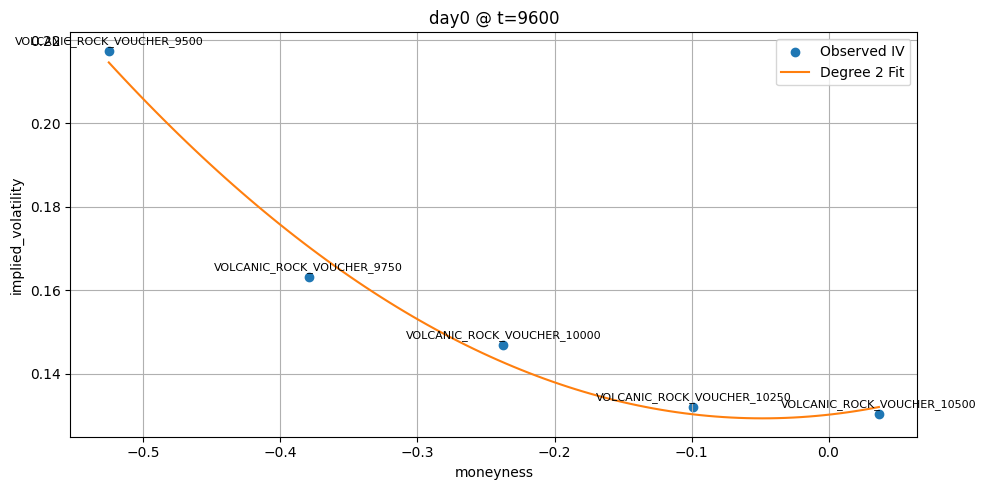

Plotting timestamp 9700...
📈 Spot price of underlying: 10426.0


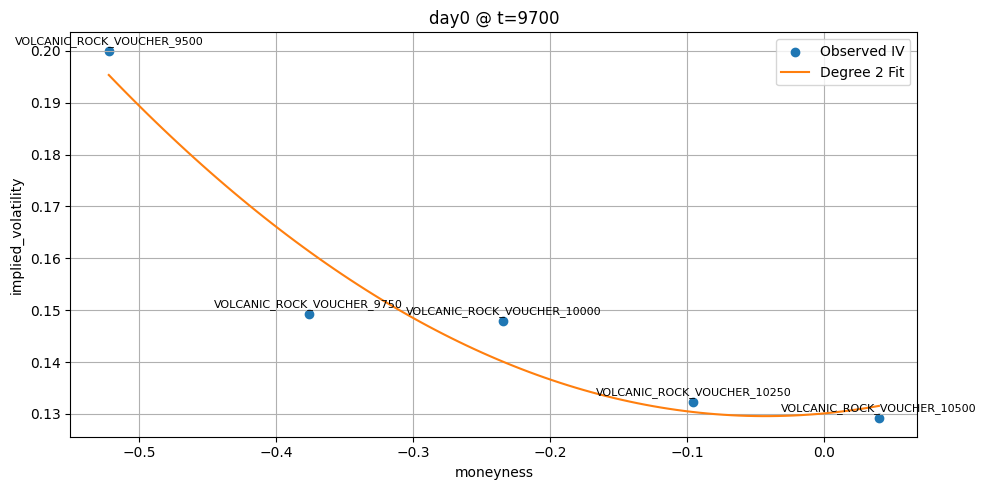

Plotting timestamp 9800...
📈 Spot price of underlying: 10428.0


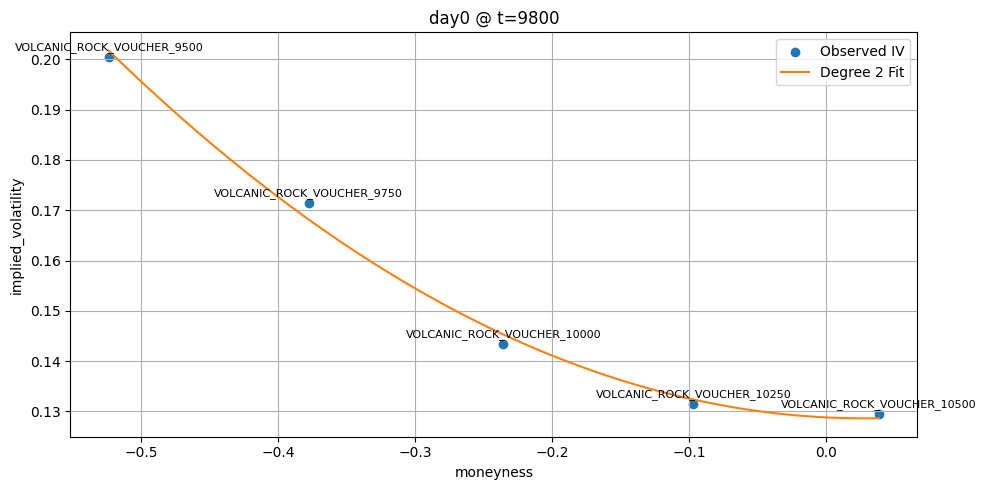

Plotting timestamp 9900...
📈 Spot price of underlying: 10427.0


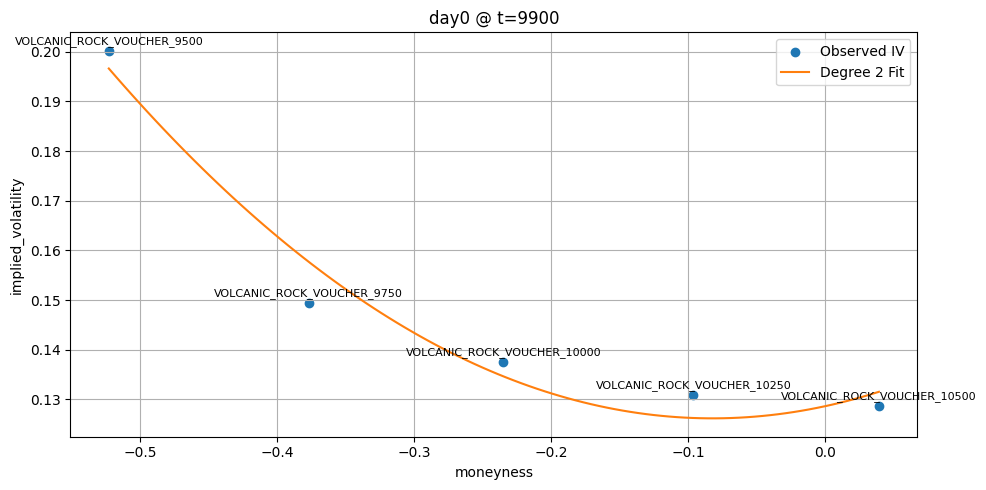

Plotting timestamp 10000...
📈 Spot price of underlying: 10419.5


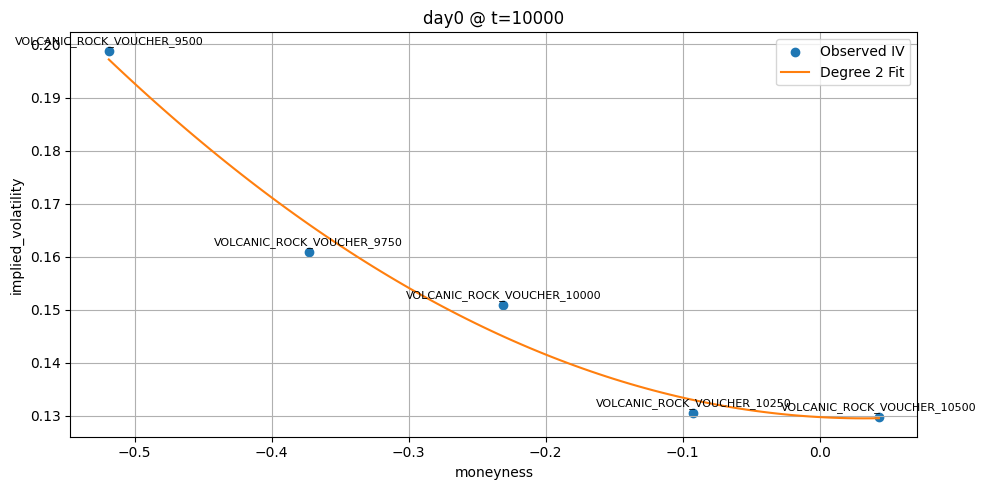

Plotting timestamp 10100...
📈 Spot price of underlying: 10425.0


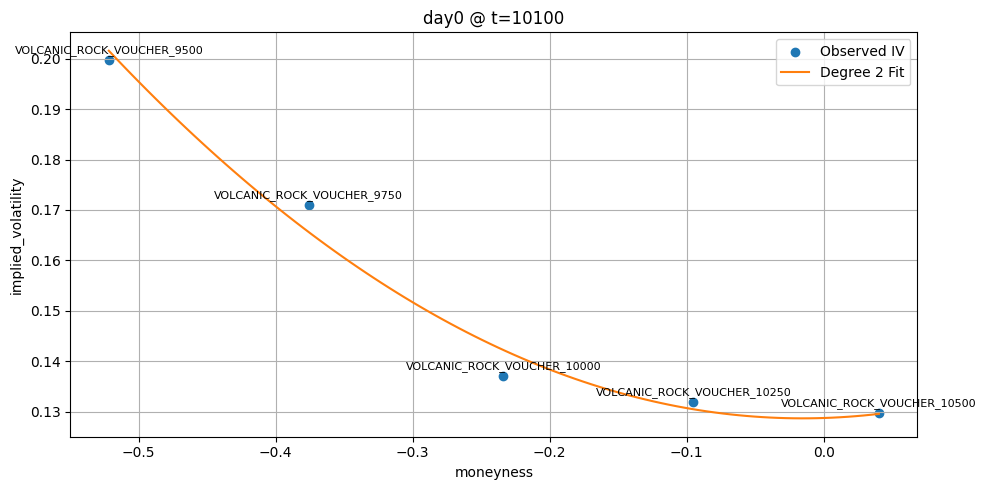

Plotting timestamp 10200...
📈 Spot price of underlying: 10421.0


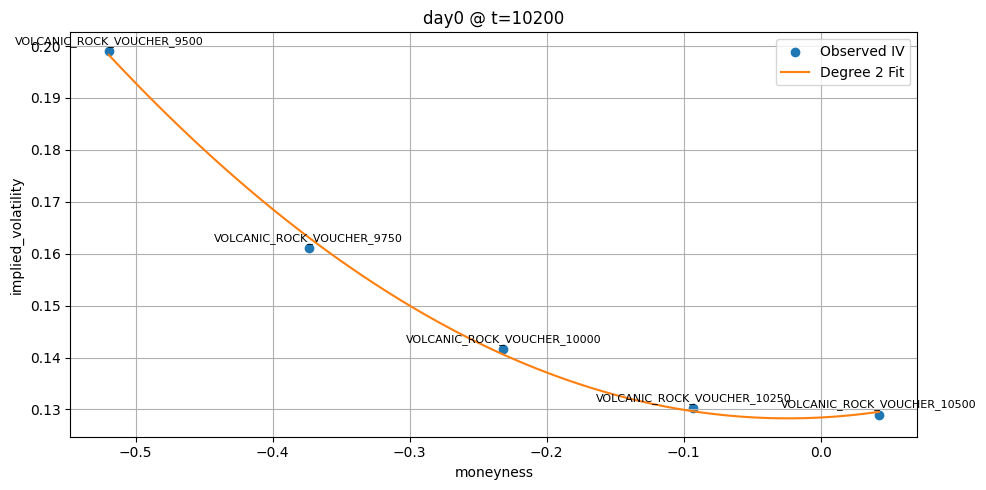

Plotting timestamp 10300...
📈 Spot price of underlying: 10422.5


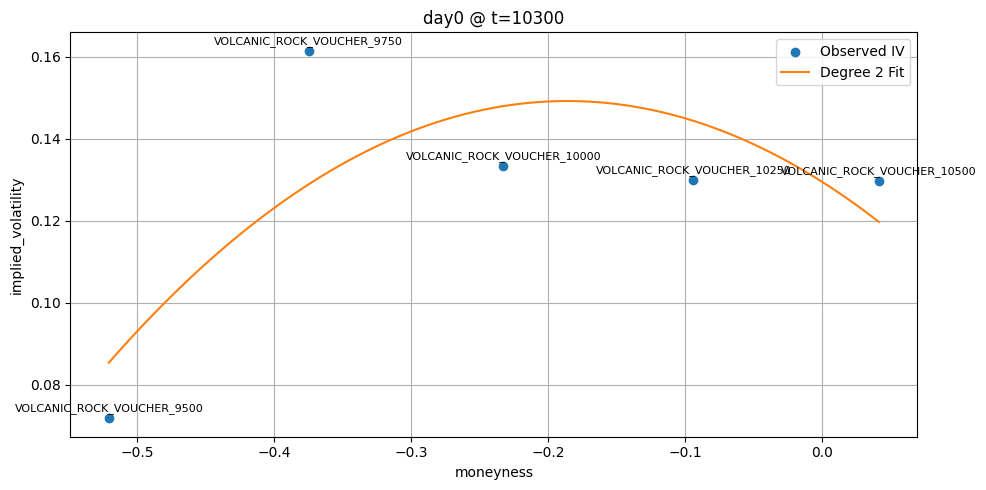

Plotting timestamp 10400...
📈 Spot price of underlying: 10425.0


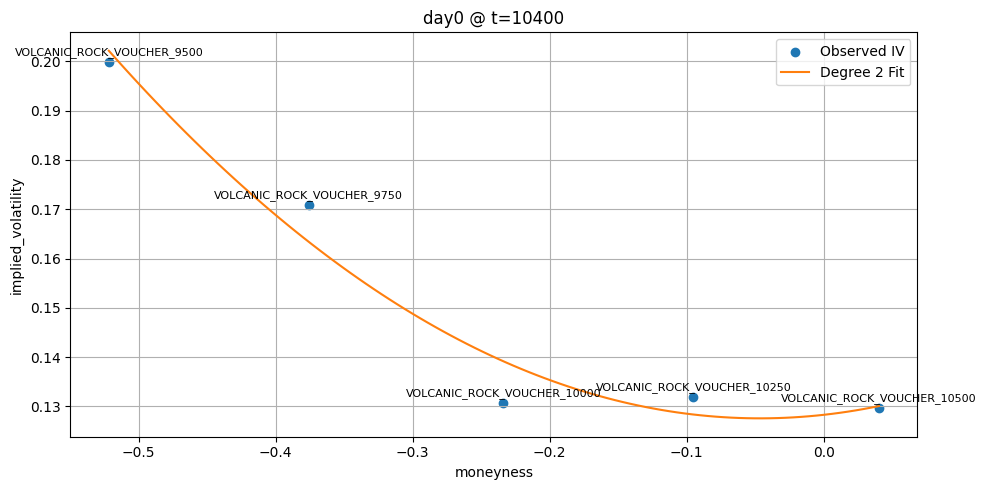

Plotting timestamp 10500...
📈 Spot price of underlying: 10427.0


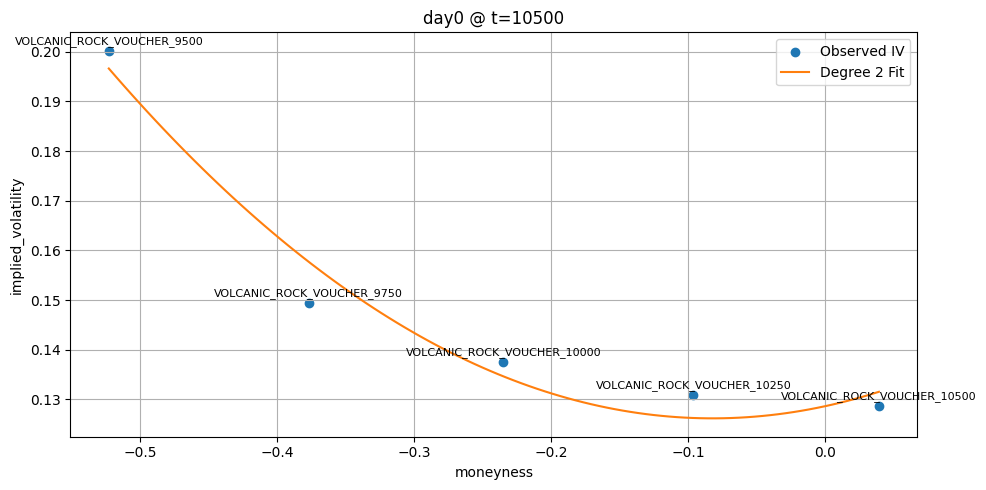

Plotting timestamp 10600...
📈 Spot price of underlying: 10431.5


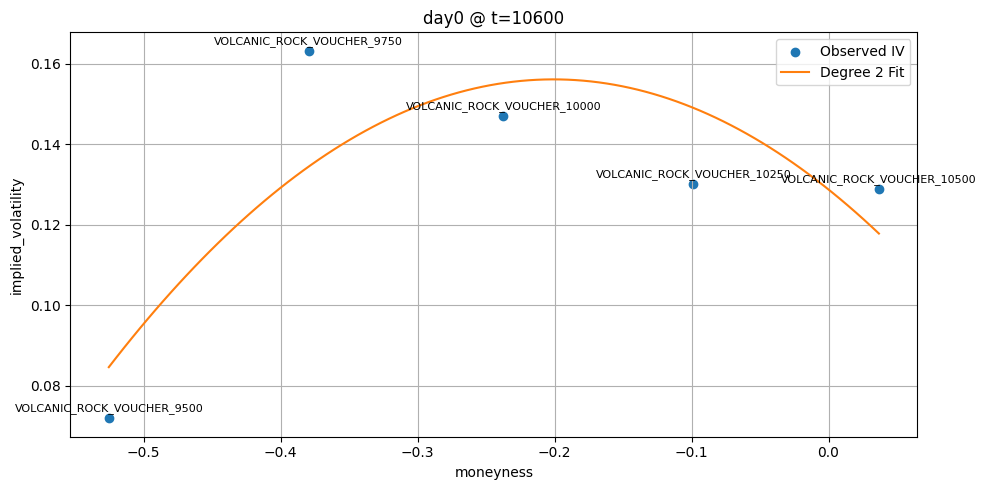

Plotting timestamp 10700...
📈 Spot price of underlying: 10428.0


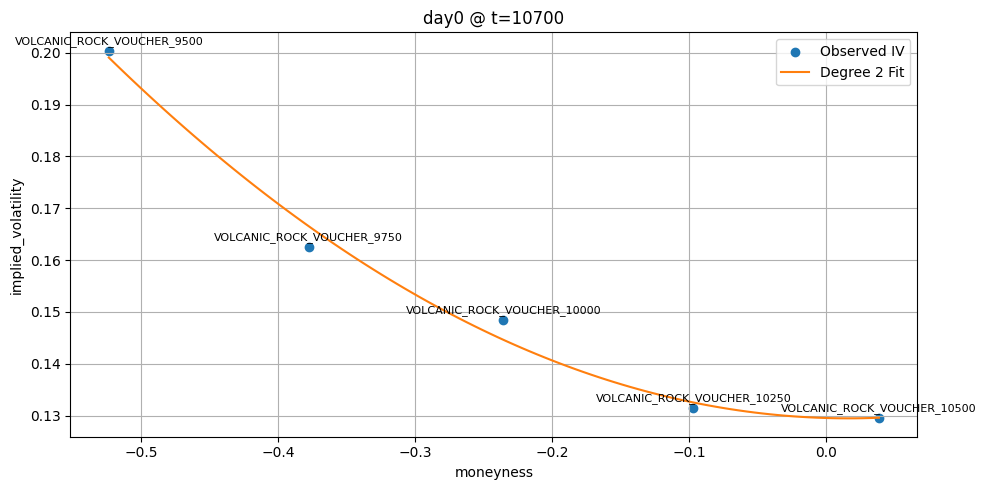

Plotting timestamp 10800...
📈 Spot price of underlying: 10434.0


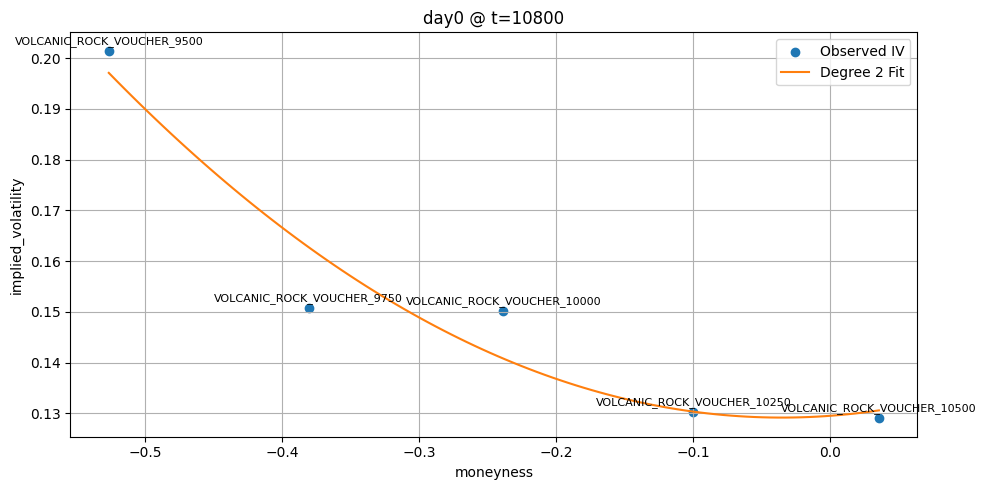

Plotting timestamp 10900...
📈 Spot price of underlying: 10439.0


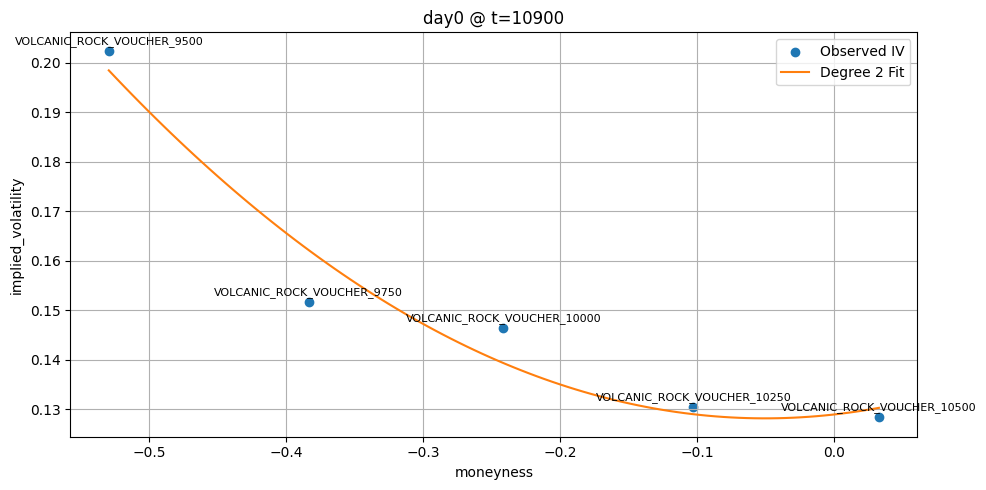

Plotting timestamp 11000...
📈 Spot price of underlying: 10447.5


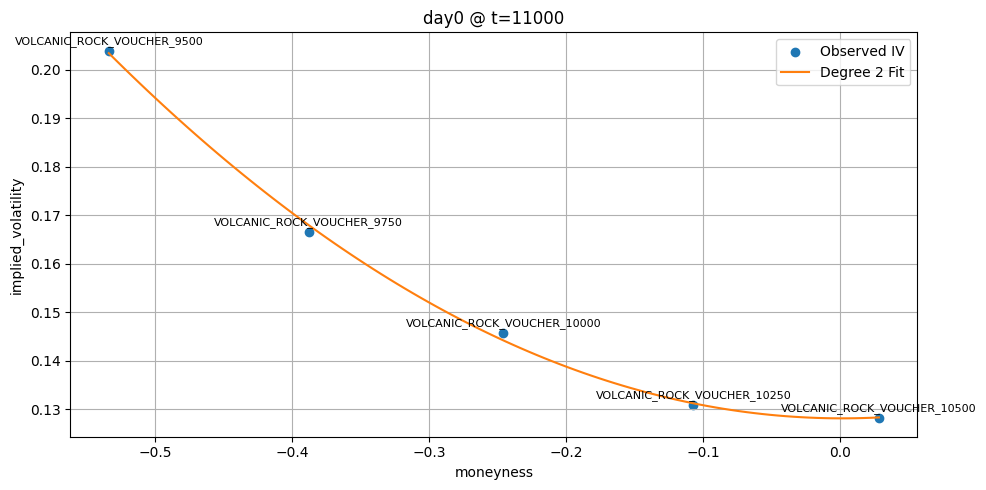

Plotting timestamp 11100...
📈 Spot price of underlying: 10439.0


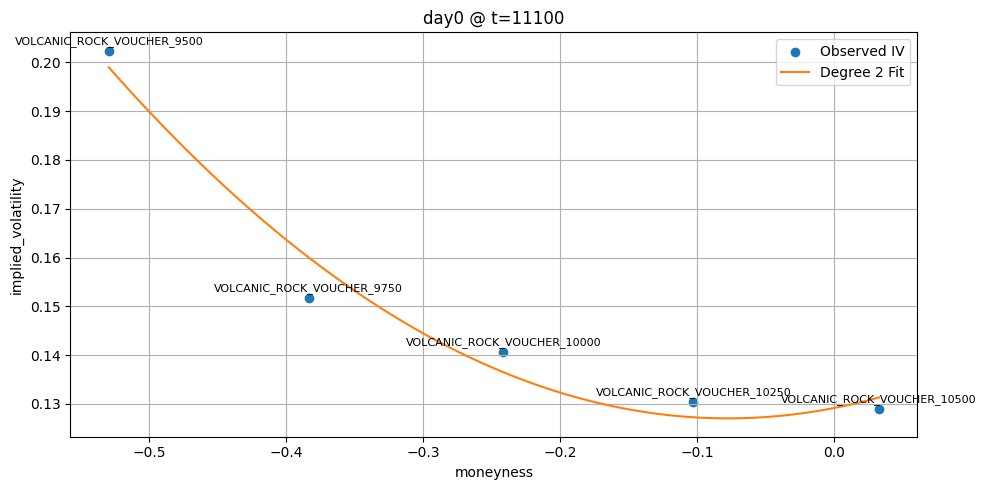

Plotting timestamp 11200...
📈 Spot price of underlying: 10447.5


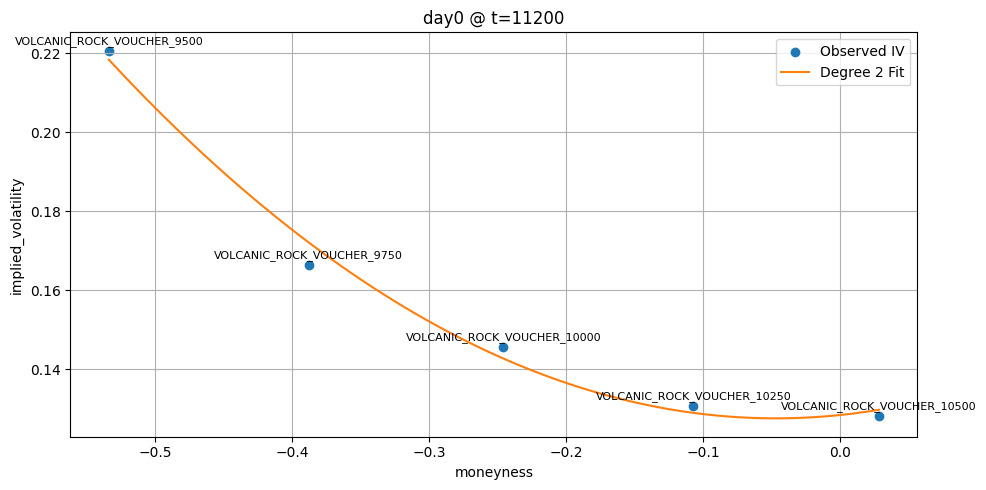

Plotting timestamp 11300...
📈 Spot price of underlying: 10443.0


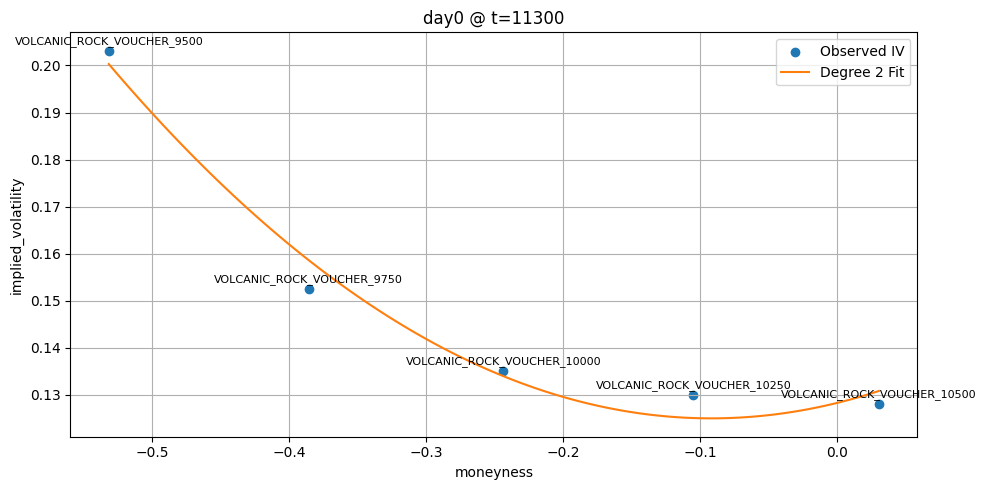

Plotting timestamp 11400...
📈 Spot price of underlying: 10449.0


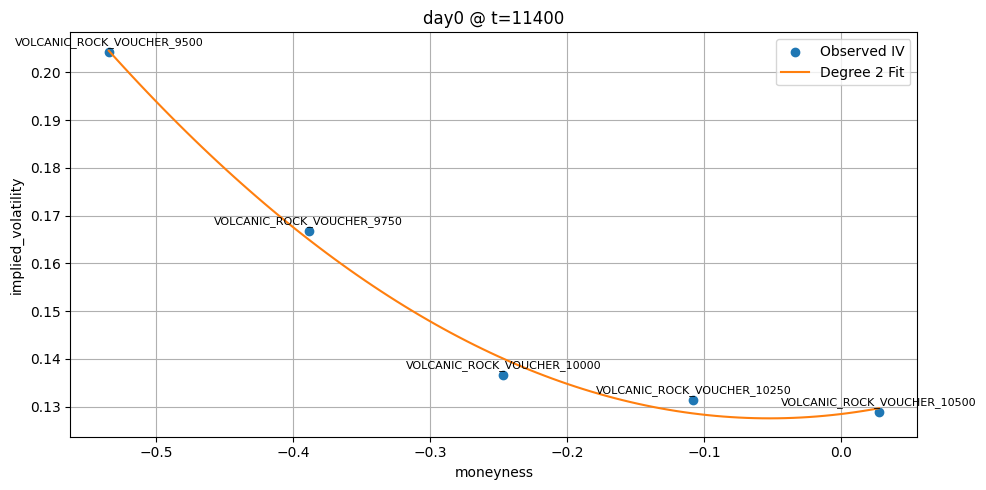

Plotting timestamp 11500...
📈 Spot price of underlying: 10447.0


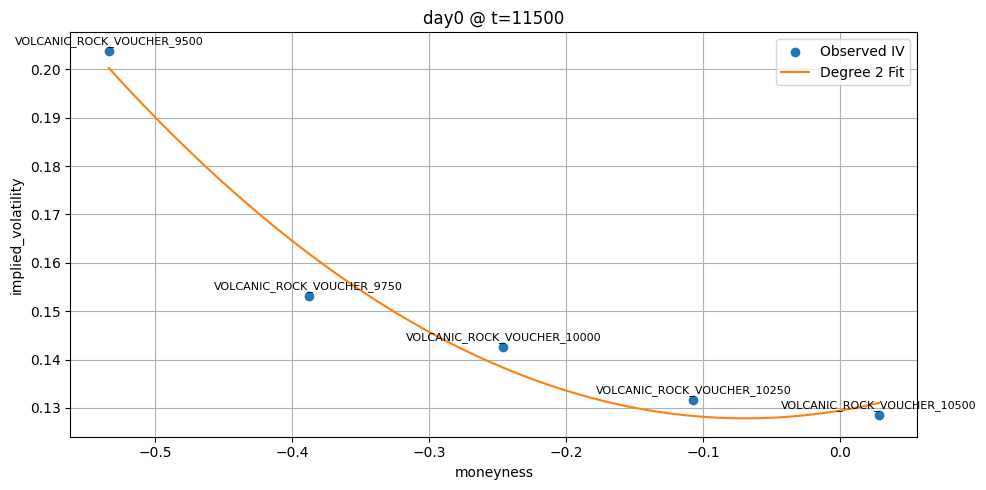

Plotting timestamp 11600...
📈 Spot price of underlying: 10444.0


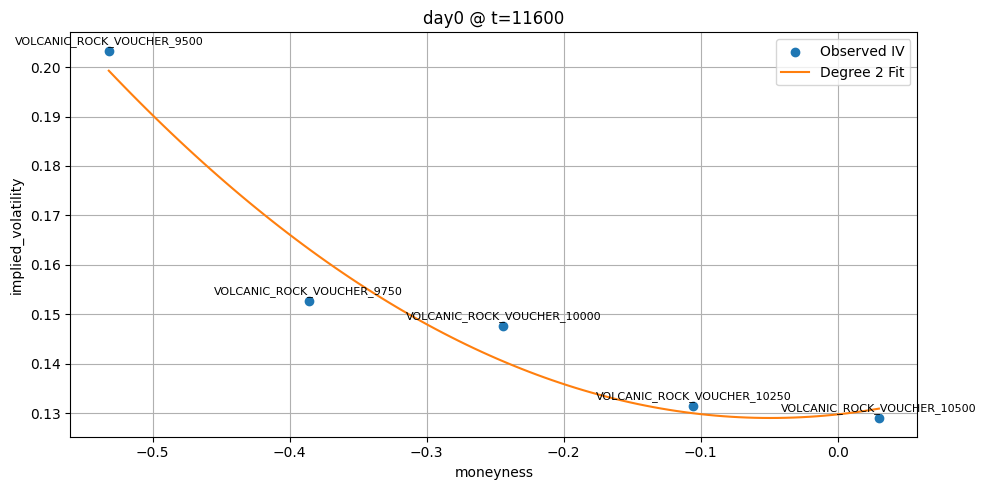

Plotting timestamp 11700...
📈 Spot price of underlying: 10439.5


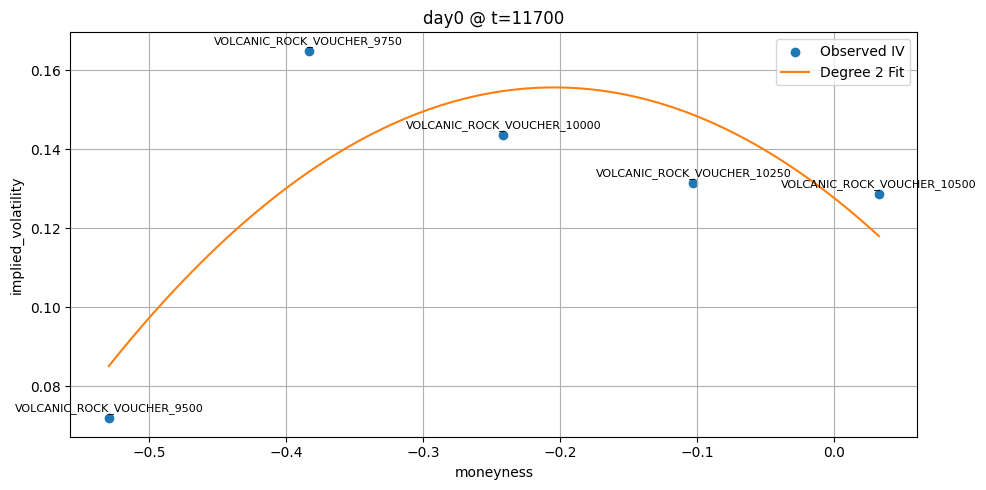

Plotting timestamp 11800...
📈 Spot price of underlying: 10435.5


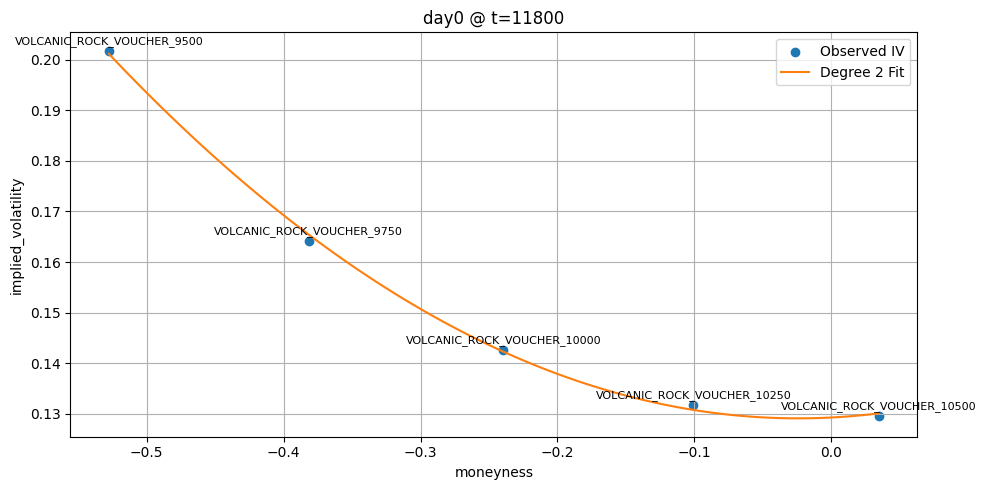

Plotting timestamp 11900...
📈 Spot price of underlying: 10428.5


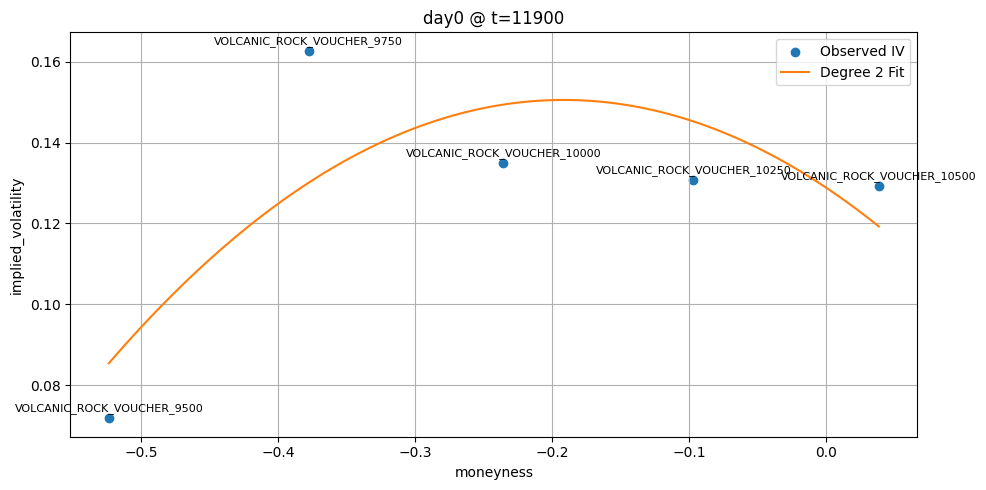

Plotting timestamp 12000...
📈 Spot price of underlying: 10430.5


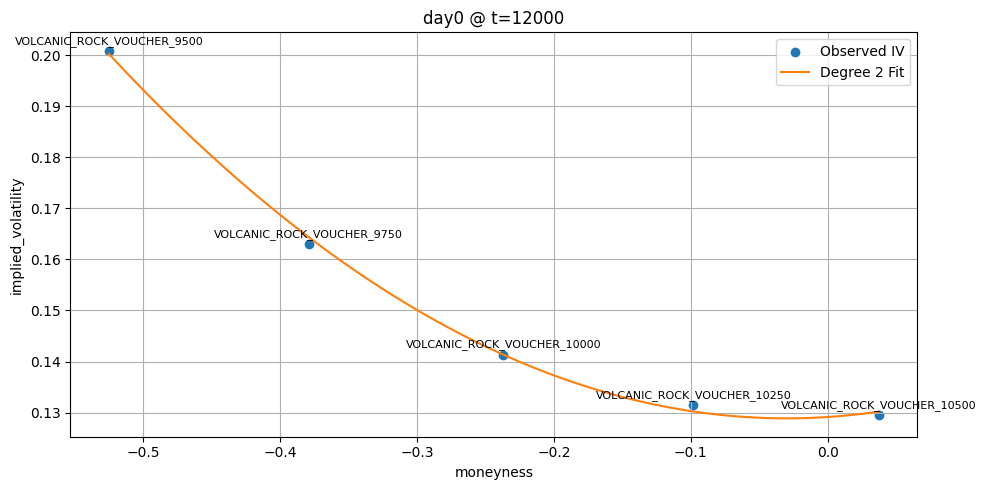

Plotting timestamp 12100...
📈 Spot price of underlying: 10430.5


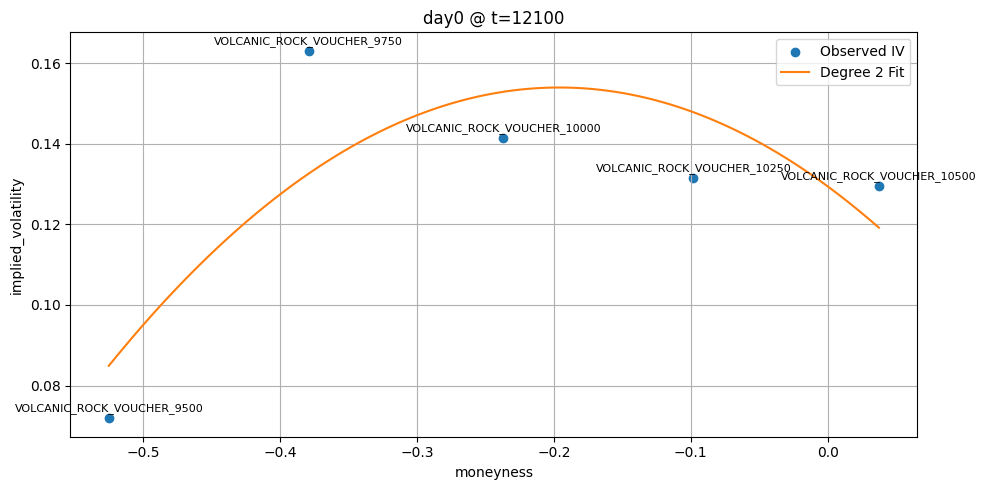

Plotting timestamp 12200...
📈 Spot price of underlying: 10428.5


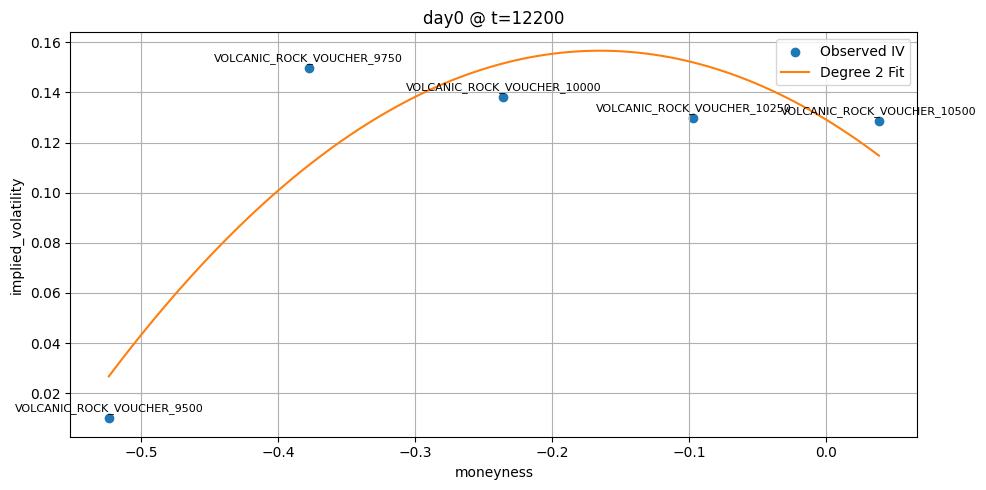

Plotting timestamp 12300...
📈 Spot price of underlying: 10434.0


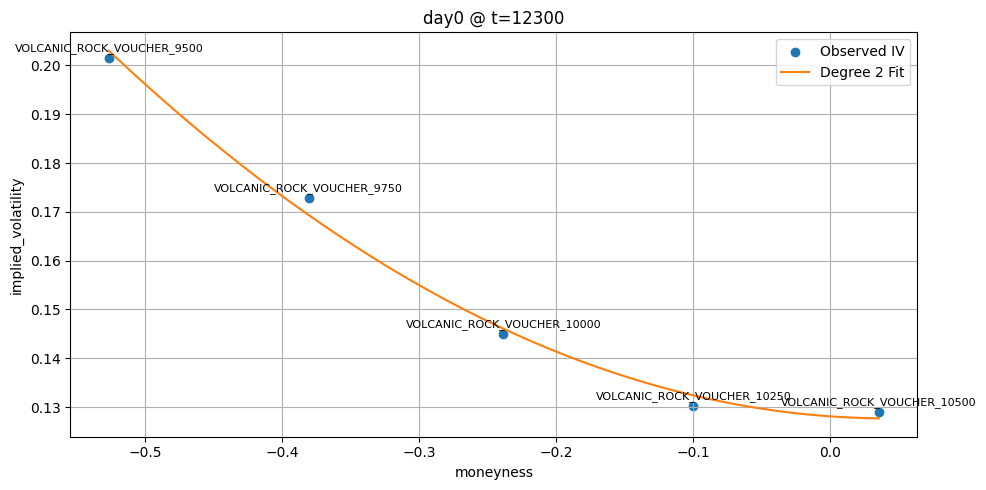

Plotting timestamp 12400...
📈 Spot price of underlying: 10436.0


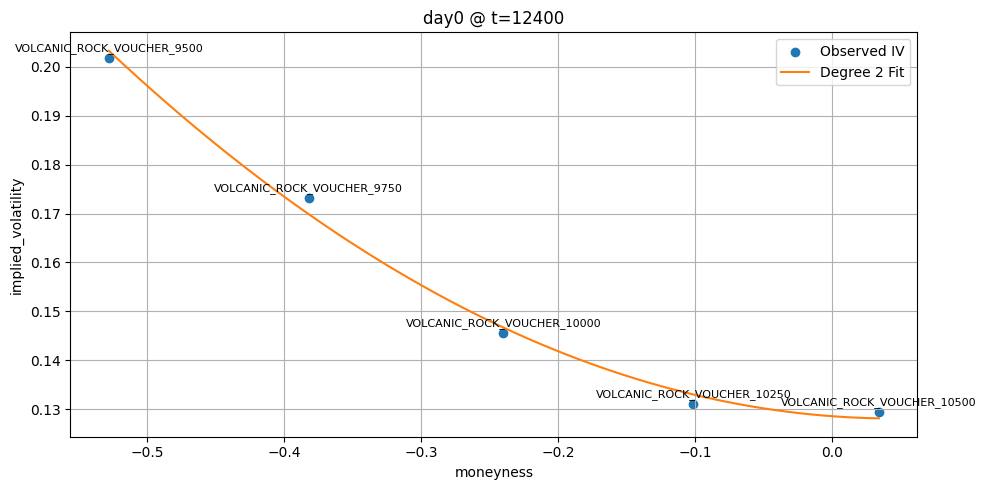

Plotting timestamp 12500...
📈 Spot price of underlying: 10432.5


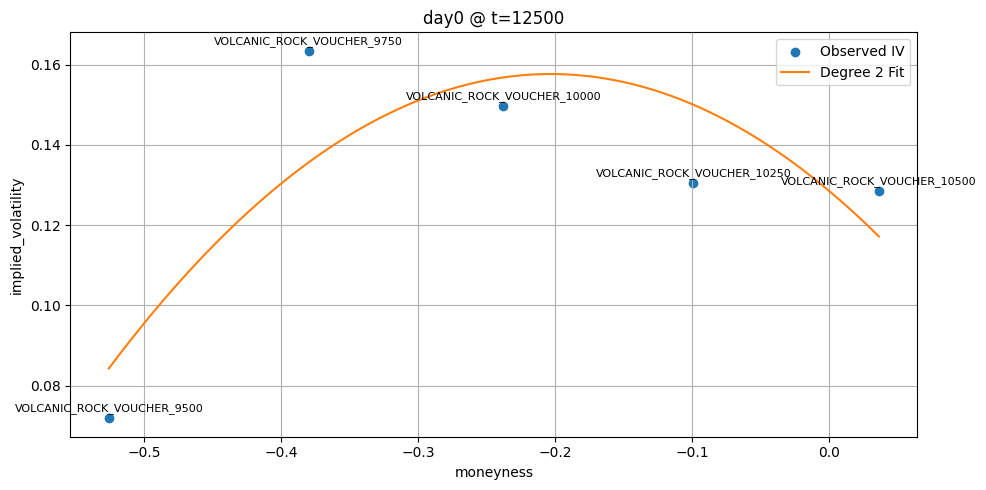

Plotting timestamp 12600...
📈 Spot price of underlying: 10423.5


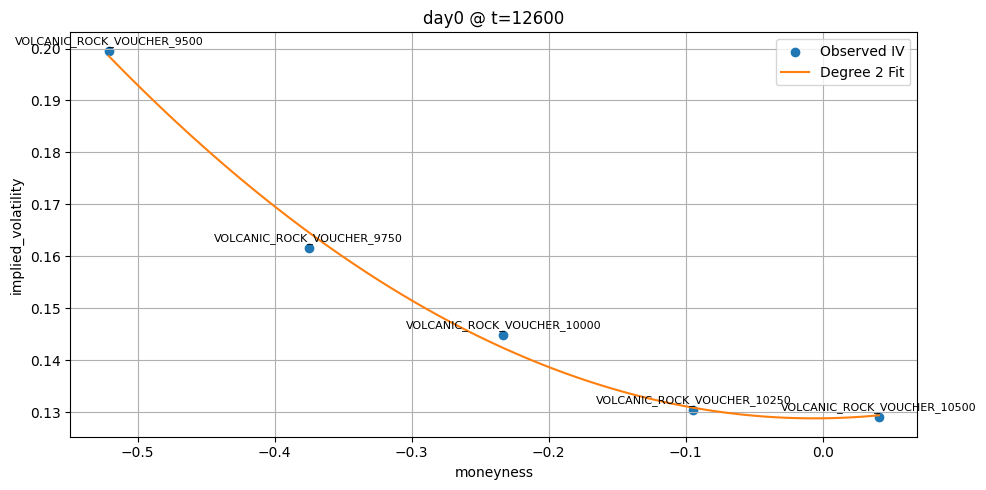

Plotting timestamp 12700...
📈 Spot price of underlying: 10426.5


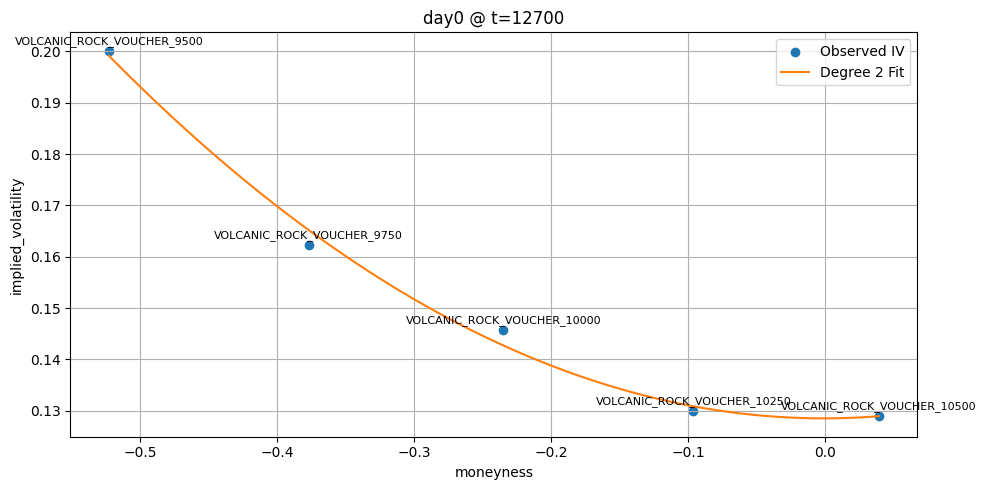

Plotting timestamp 12800...
📈 Spot price of underlying: 10431.0


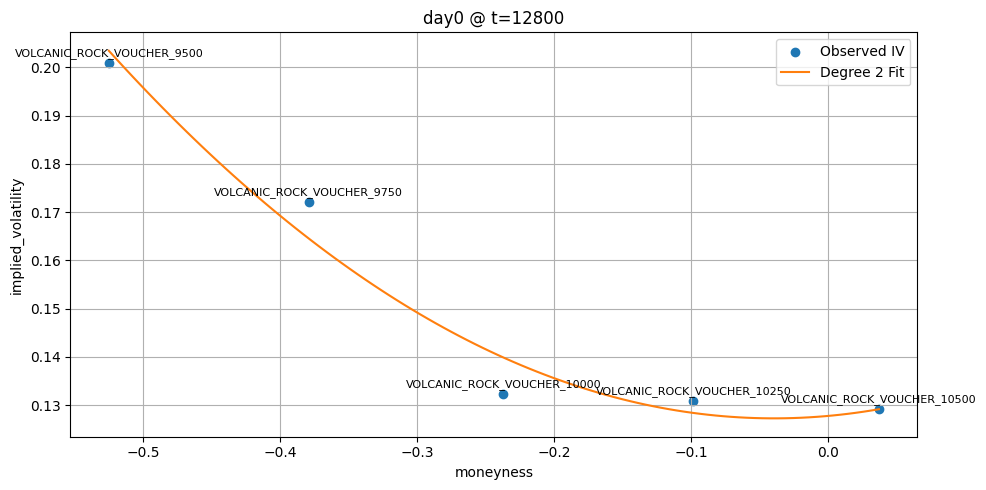

Plotting timestamp 12900...
📈 Spot price of underlying: 10426.5


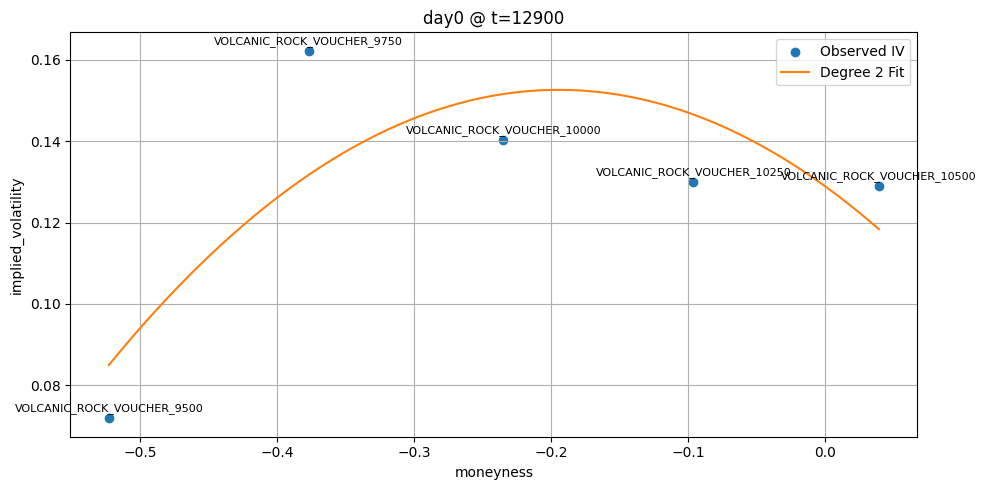

Plotting timestamp 13000...
📈 Spot price of underlying: 10426.5


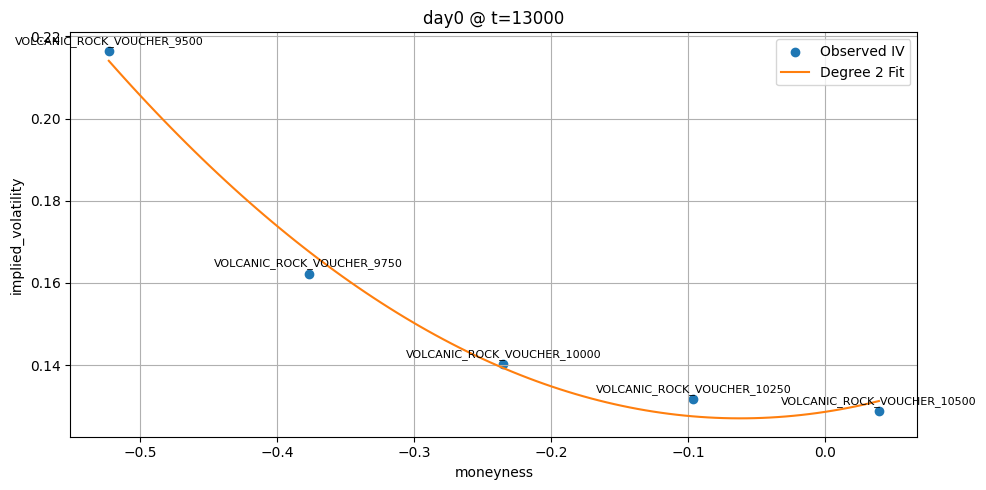

Plotting timestamp 13100...
📈 Spot price of underlying: 10423.0


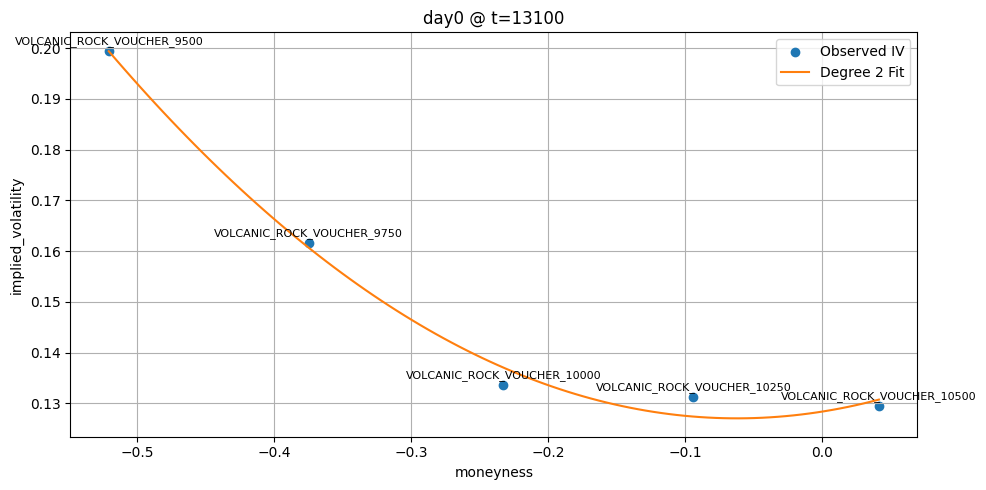

Plotting timestamp 13200...
📈 Spot price of underlying: 10415.5


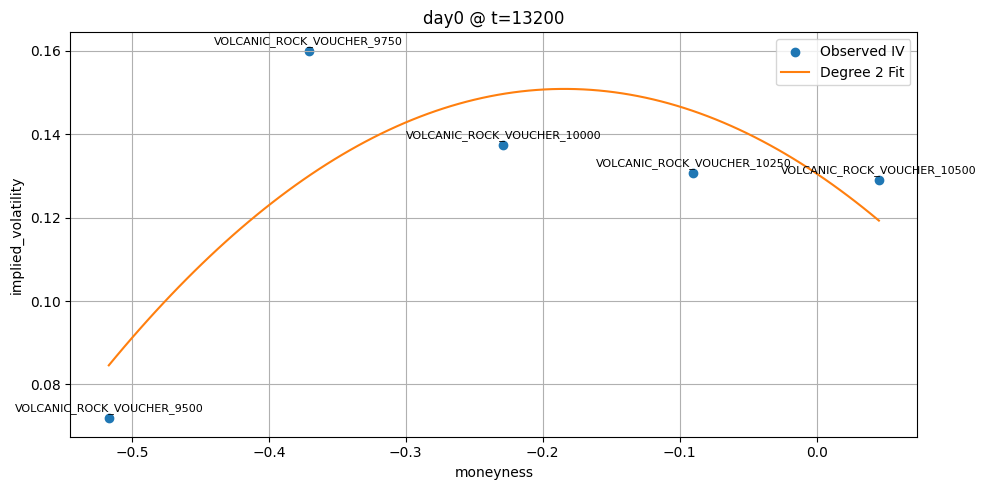

Plotting timestamp 13300...
📈 Spot price of underlying: 10414.0


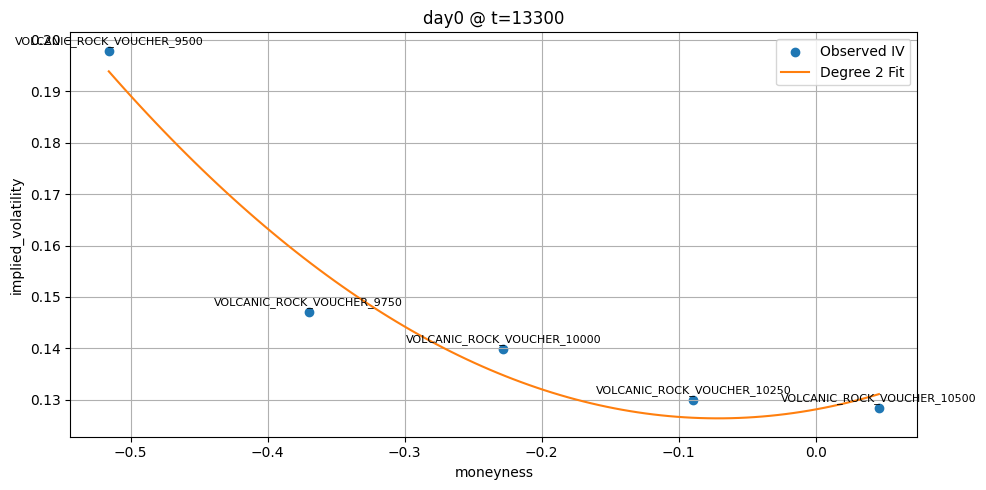

Plotting timestamp 13400...
📈 Spot price of underlying: 10414.5


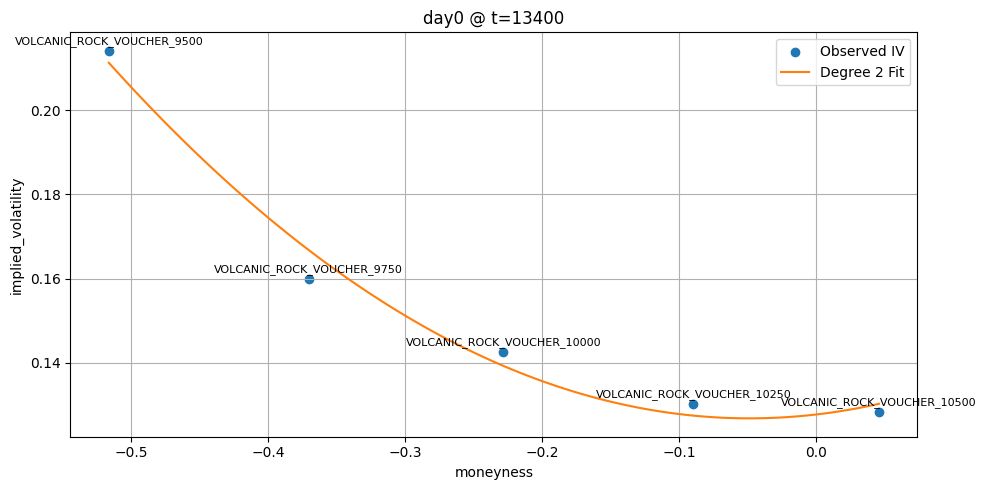

Plotting timestamp 13500...
📈 Spot price of underlying: 10411.0


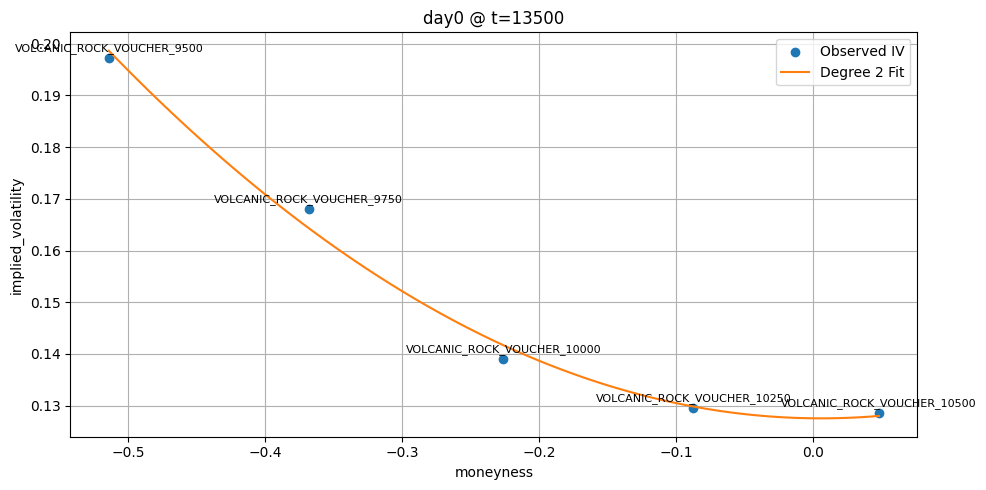

Plotting timestamp 13600...
📈 Spot price of underlying: 10405.5


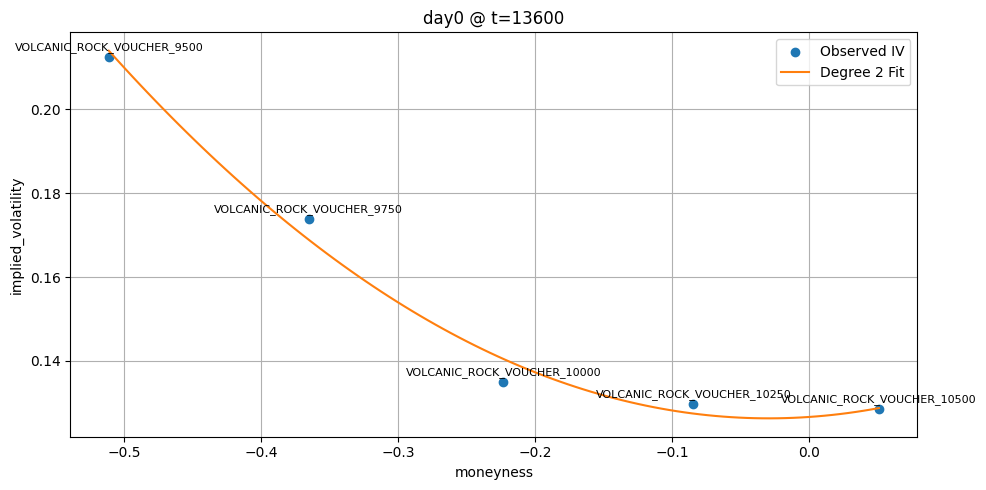

Plotting timestamp 13700...
📈 Spot price of underlying: 10406.0


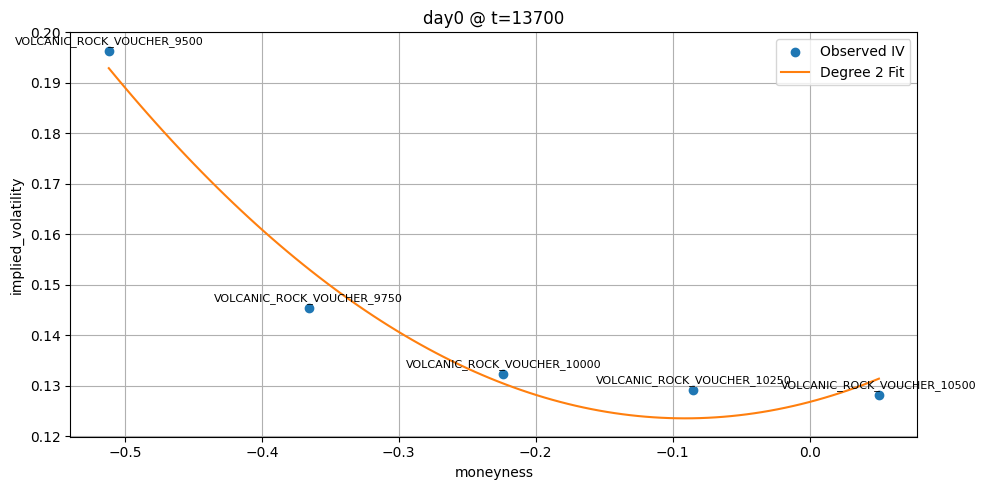

Plotting timestamp 13800...
📈 Spot price of underlying: 10381.5


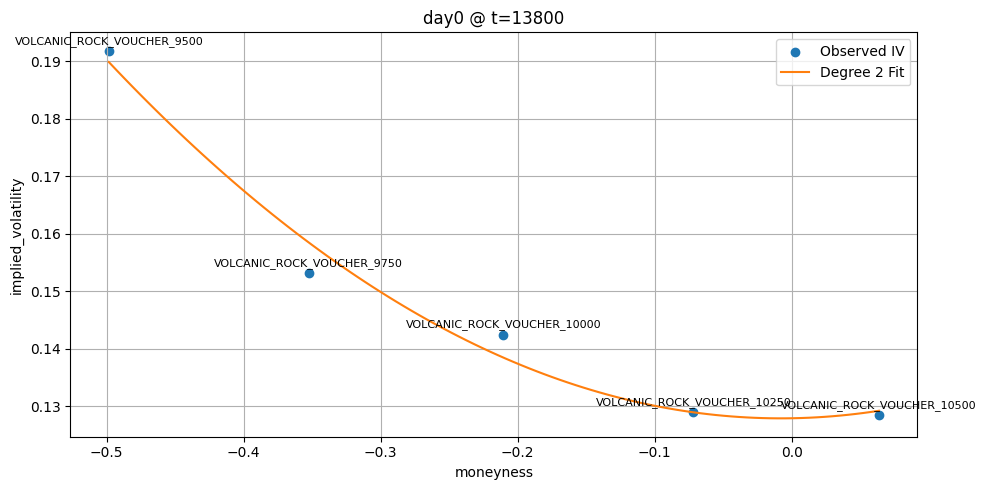

Plotting timestamp 13900...
📈 Spot price of underlying: 10392.5


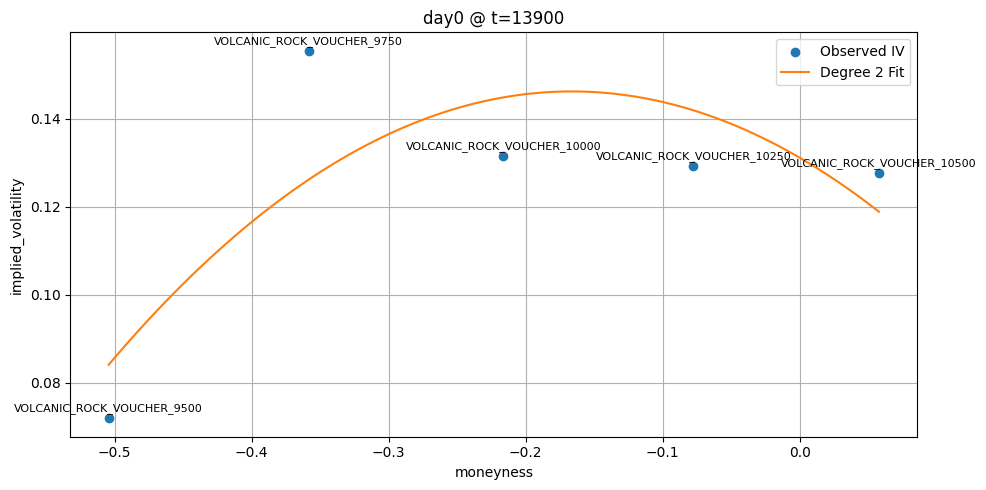

Plotting timestamp 14000...
📈 Spot price of underlying: 10379.5


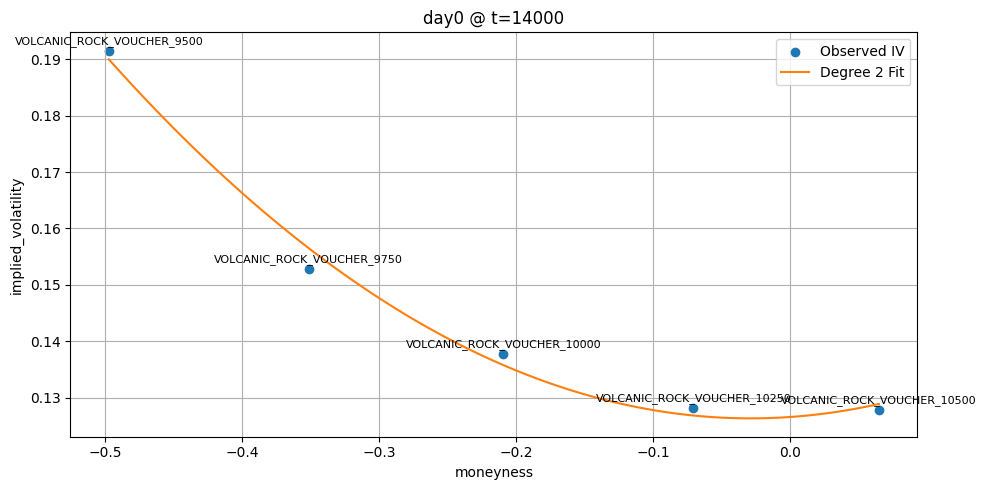

Plotting timestamp 14100...
📈 Spot price of underlying: 10393.5


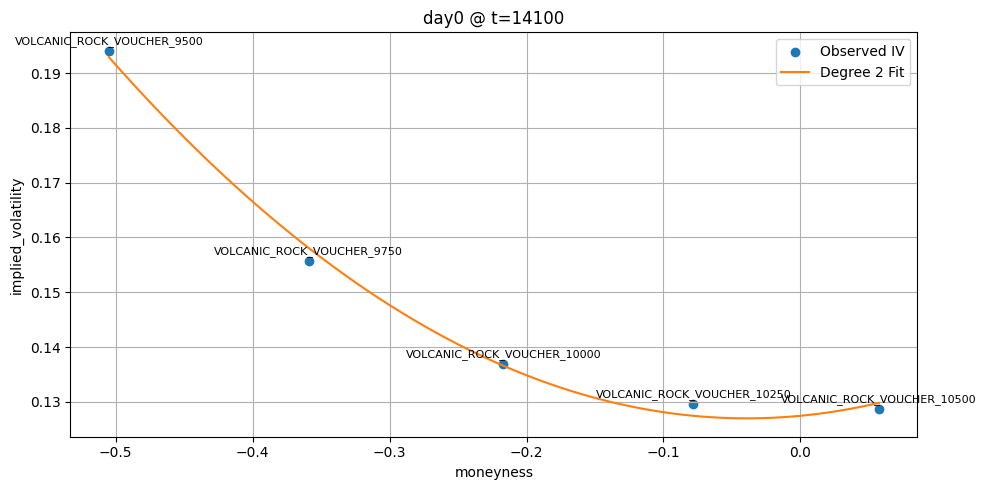

Plotting timestamp 14200...
📈 Spot price of underlying: 10406.5


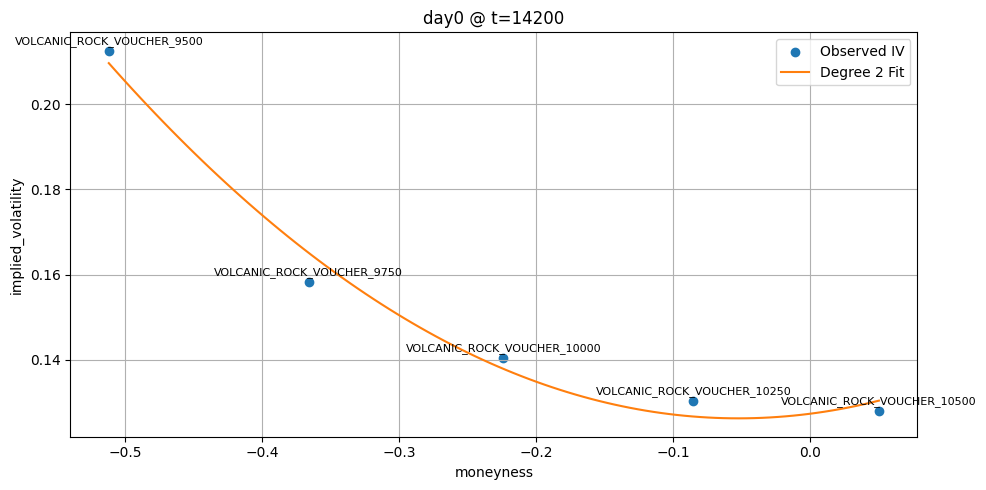

Plotting timestamp 14300...
📈 Spot price of underlying: 10396.5


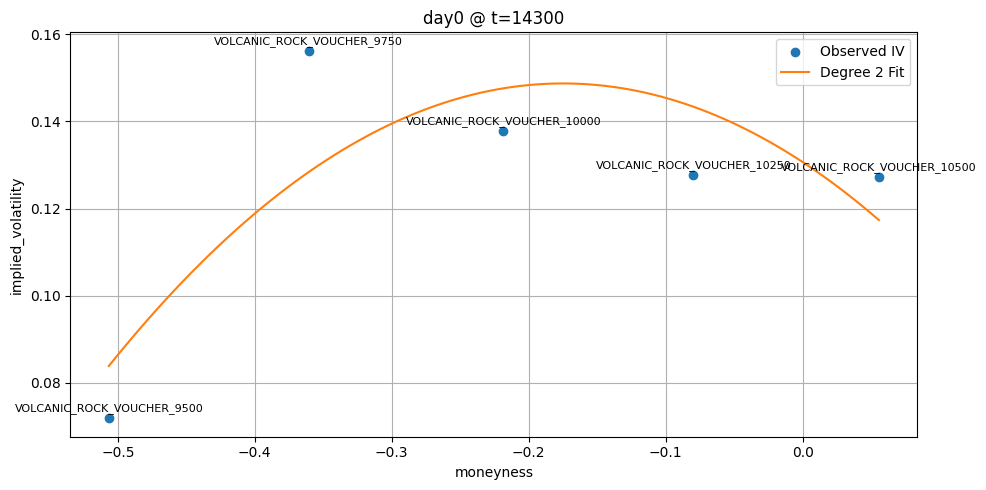

Plotting timestamp 14400...
📈 Spot price of underlying: 10404.0


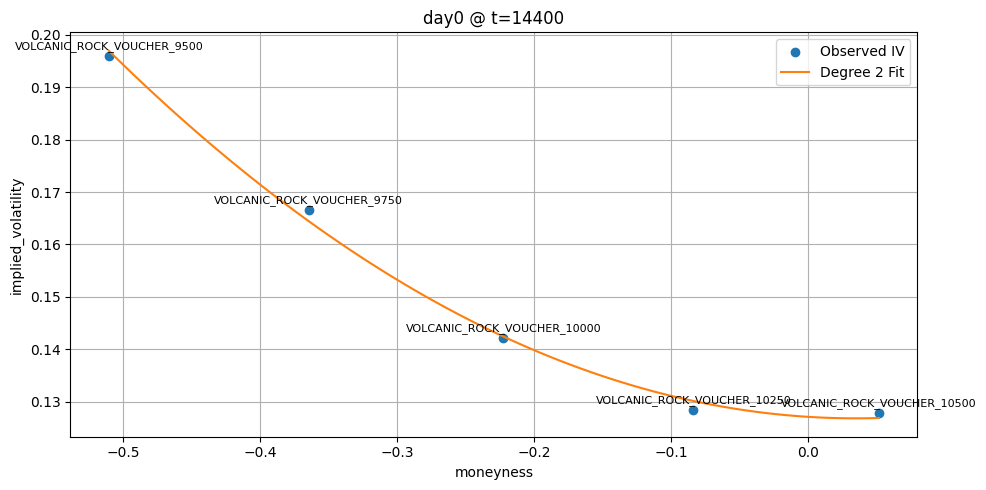

Plotting timestamp 14500...
📈 Spot price of underlying: 10405.5


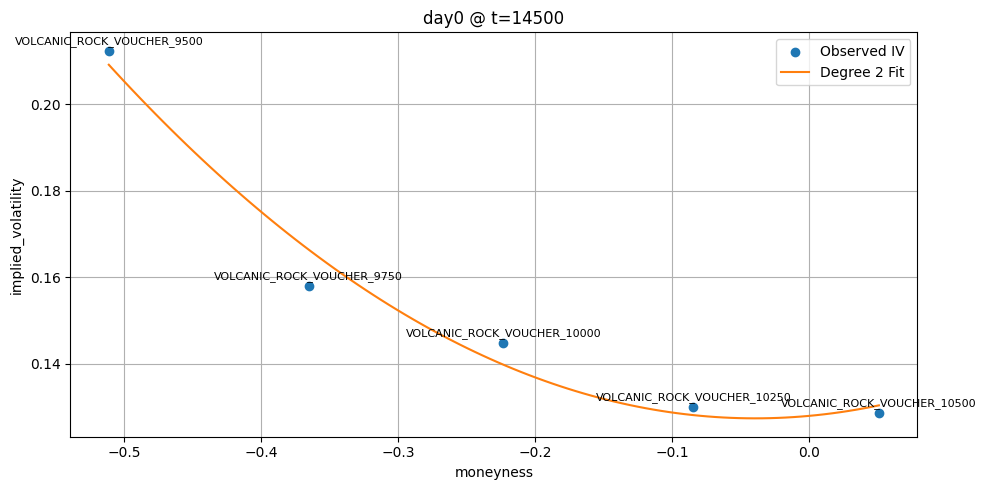

Plotting timestamp 14600...
📈 Spot price of underlying: 10405.0


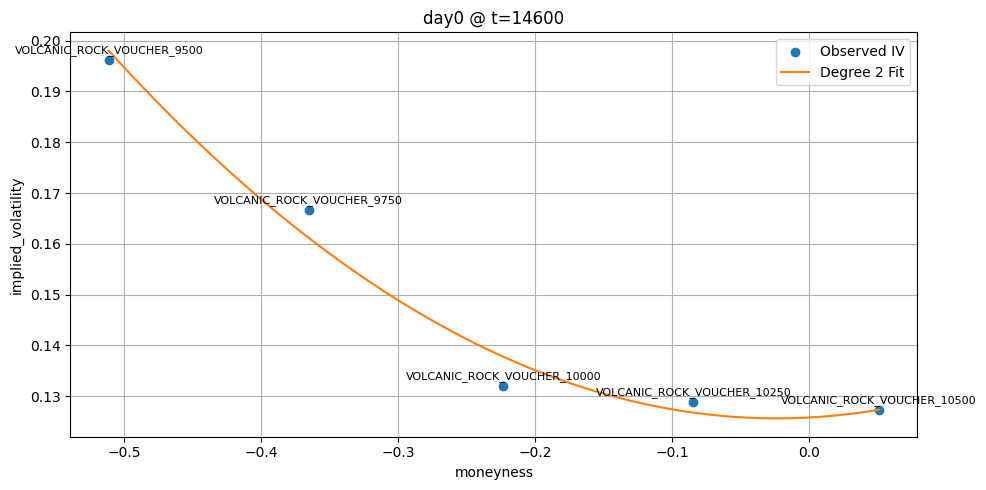

Plotting timestamp 14700...
📈 Spot price of underlying: 10417.0


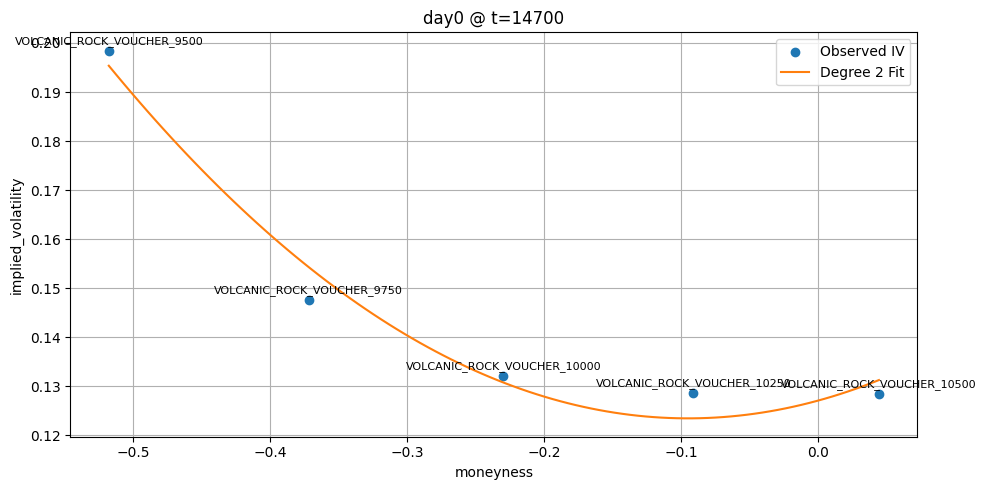

Plotting timestamp 14800...
📈 Spot price of underlying: 10409.5


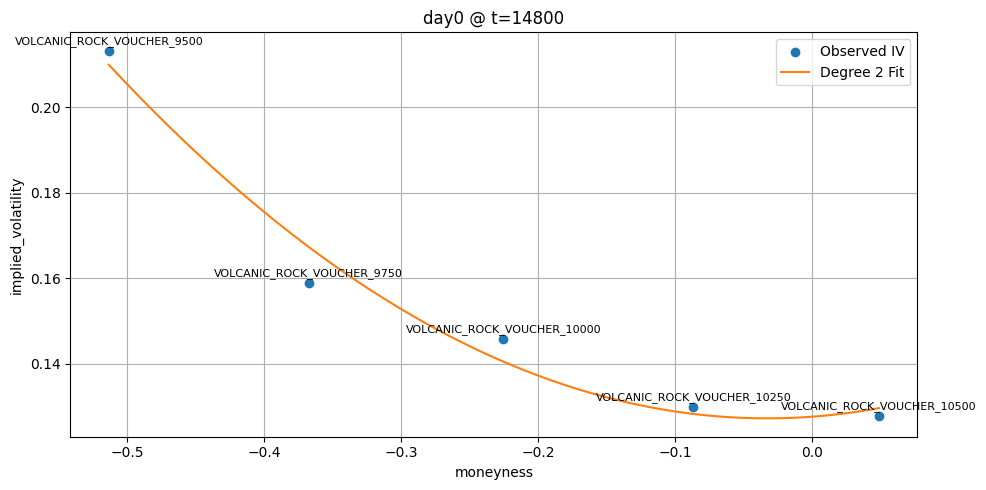

Plotting timestamp 14900...
📈 Spot price of underlying: 10414.0


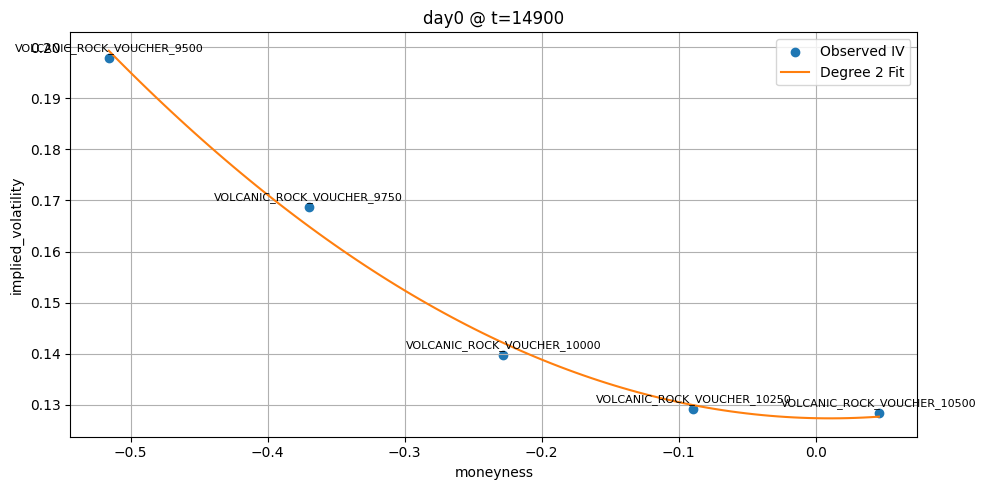

Plotting timestamp 15000...
📈 Spot price of underlying: 10425.0


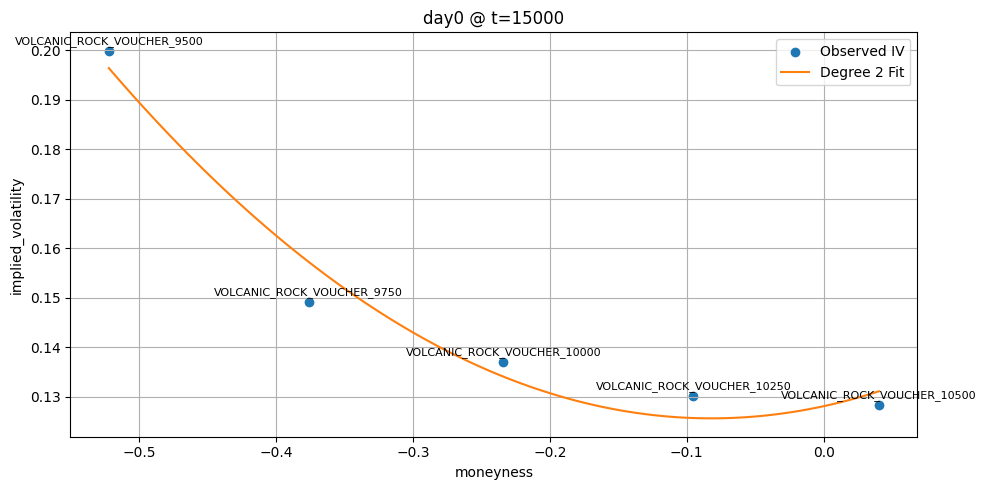

Plotting timestamp 15100...
📈 Spot price of underlying: 10428.5


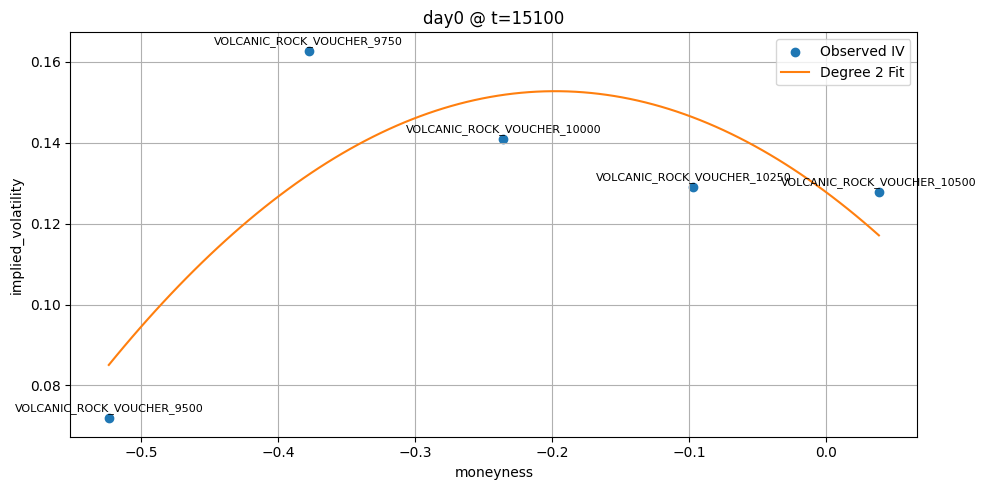

Plotting timestamp 15200...
📈 Spot price of underlying: 10433.0


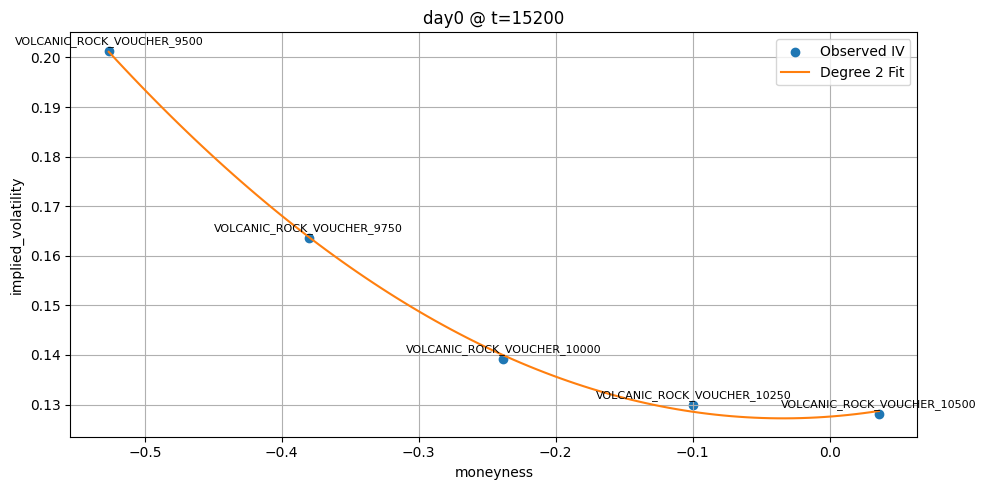

Plotting timestamp 15300...
📈 Spot price of underlying: 10438.0


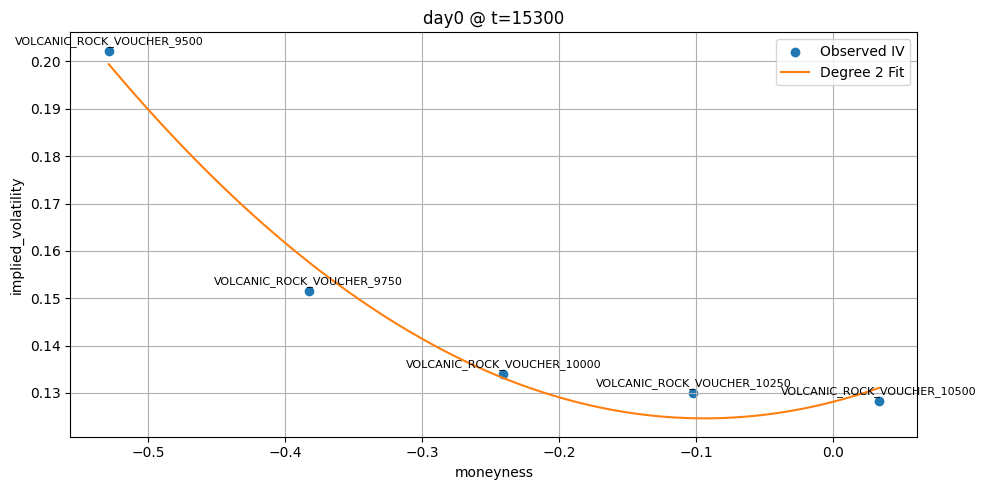

Plotting timestamp 15400...
📈 Spot price of underlying: 10438.5


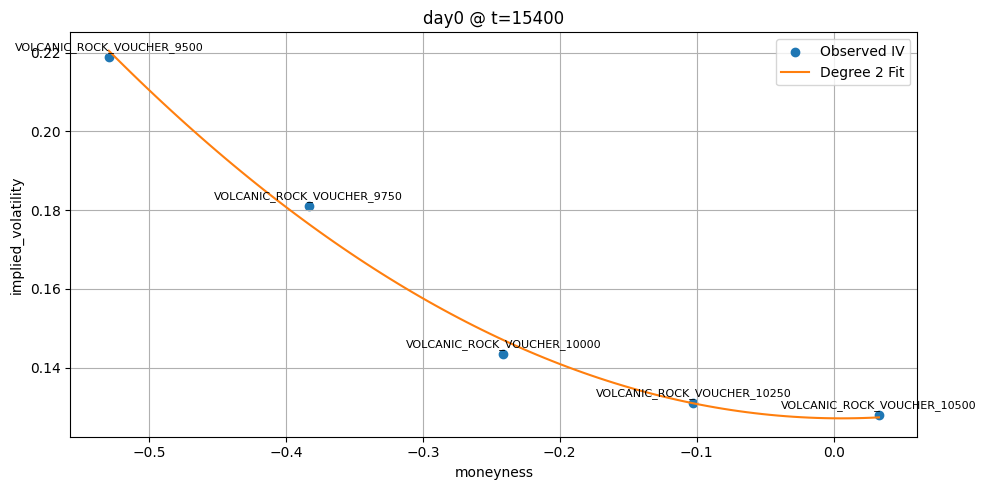

Plotting timestamp 15500...
📈 Spot price of underlying: 10440.5


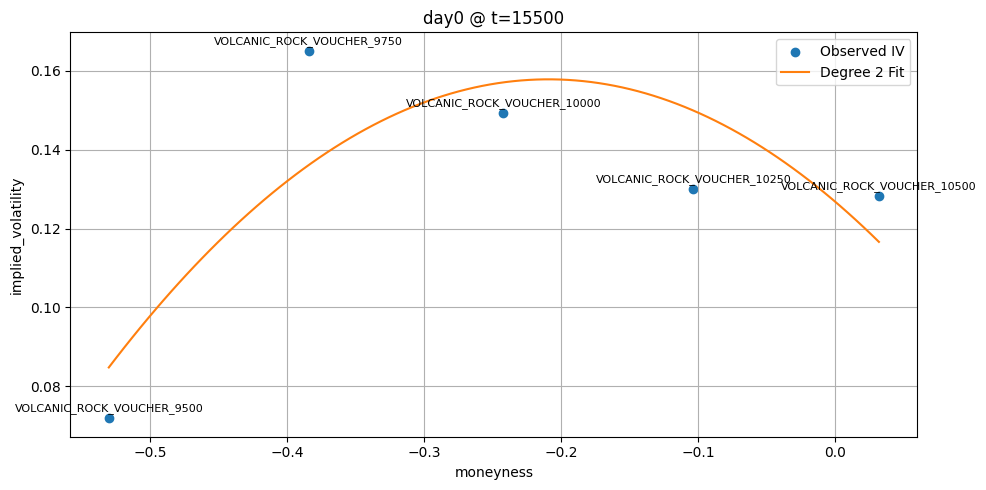

Plotting timestamp 15600...
📈 Spot price of underlying: 10445.0


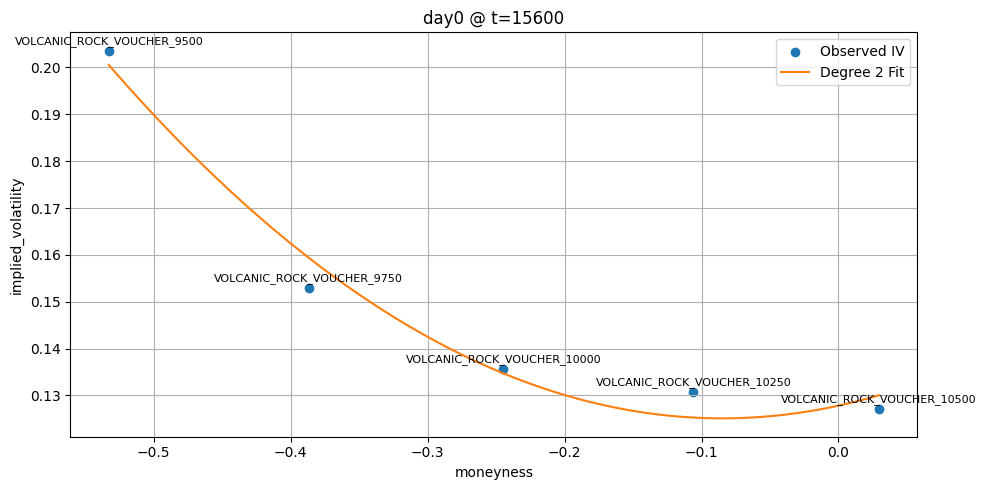

Plotting timestamp 15700...
📈 Spot price of underlying: 10446.0


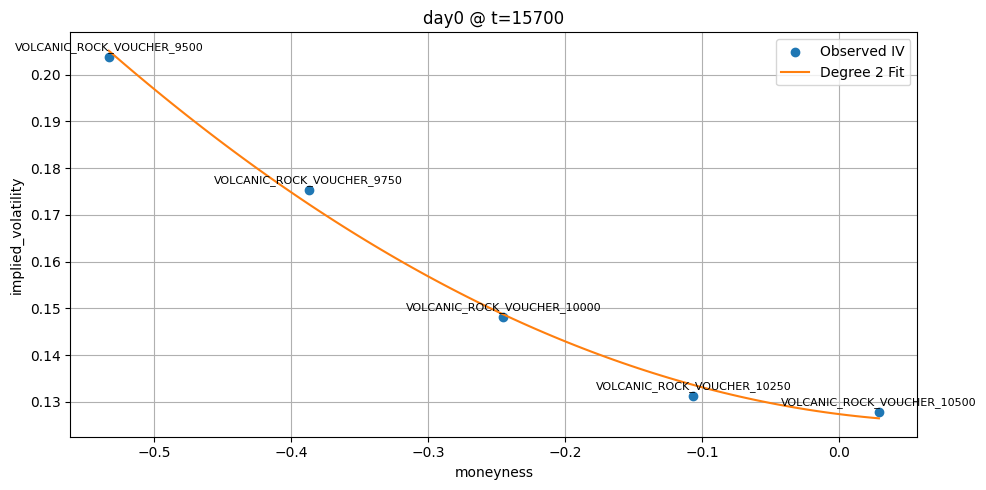

Plotting timestamp 15800...
📈 Spot price of underlying: 10457.5


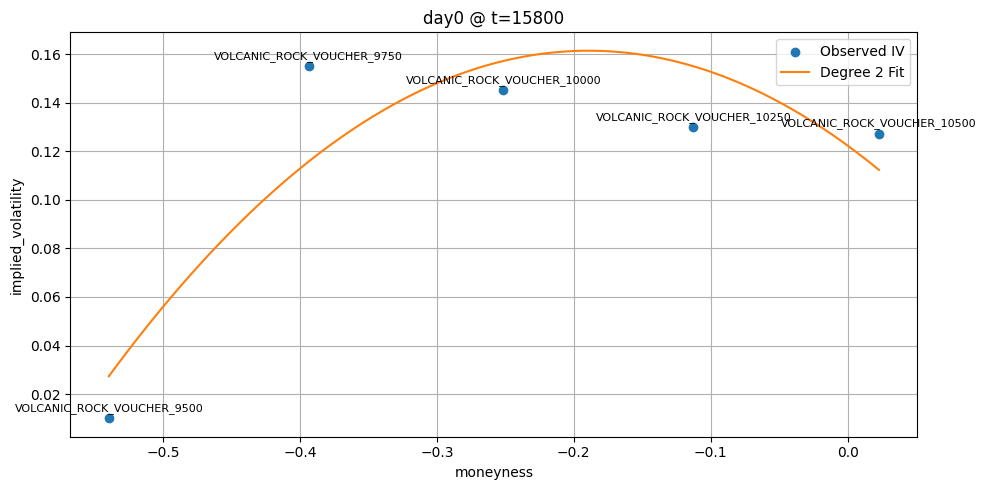

Plotting timestamp 15900...
📈 Spot price of underlying: 10469.0


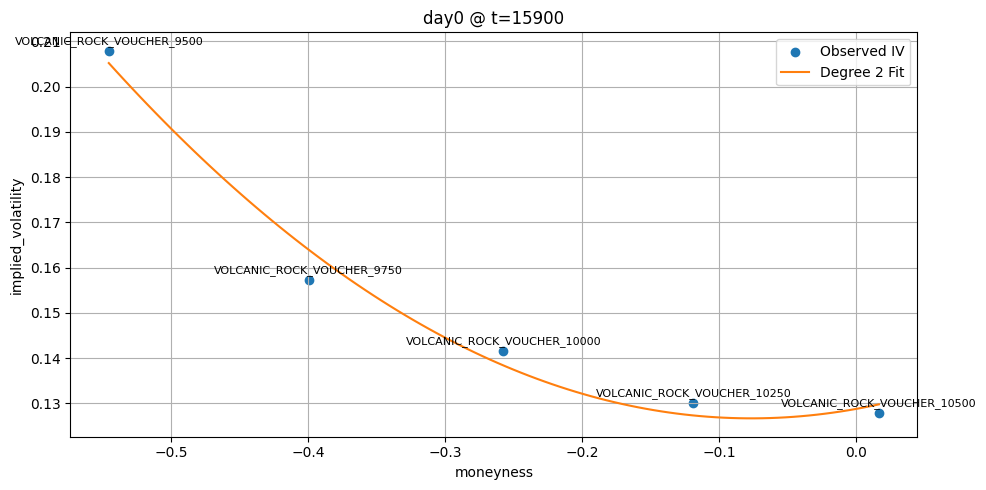

Plotting timestamp 16000...
📈 Spot price of underlying: 10461.5


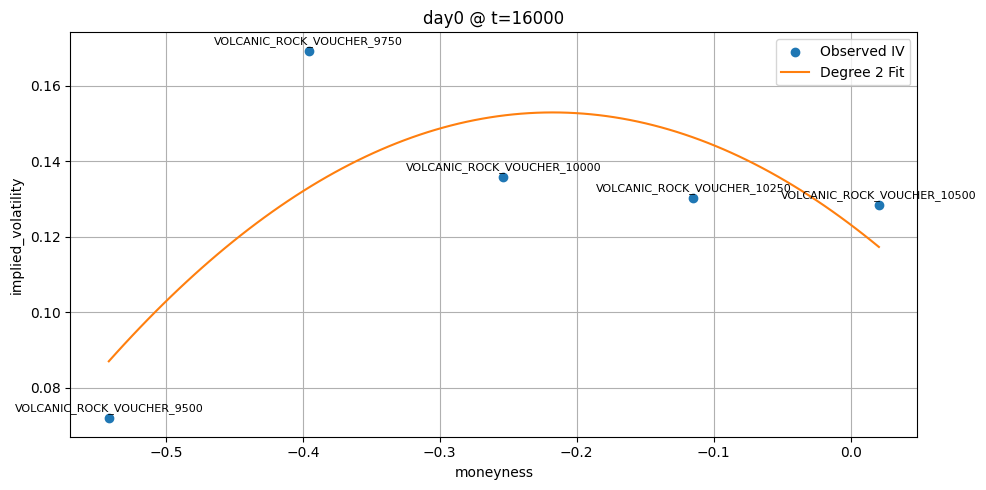

Plotting timestamp 16100...
📈 Spot price of underlying: 10457.5


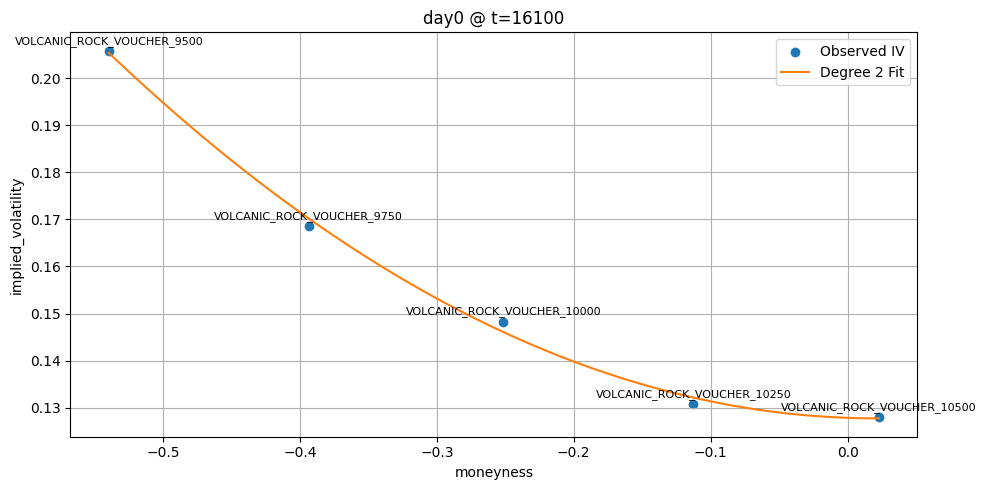

Plotting timestamp 16200...
📈 Spot price of underlying: 10471.0


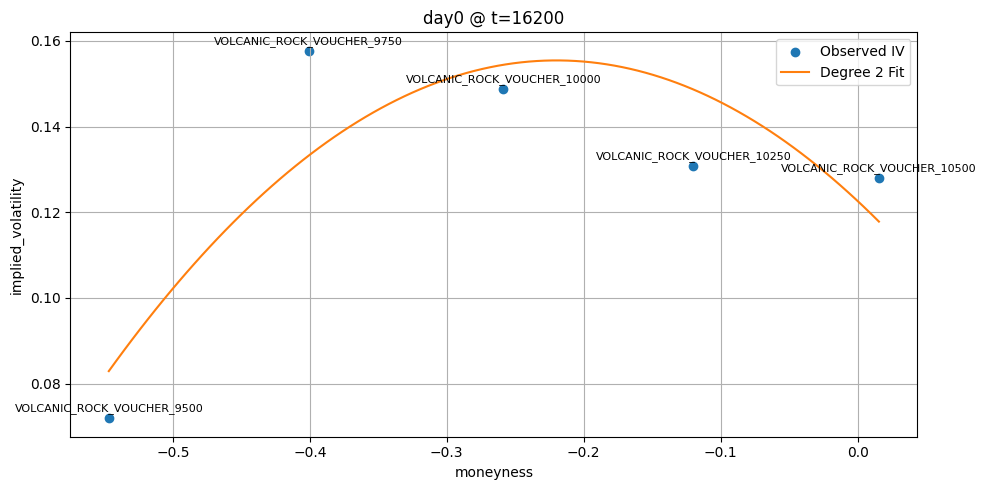

Plotting timestamp 16300...
📈 Spot price of underlying: 10466.5


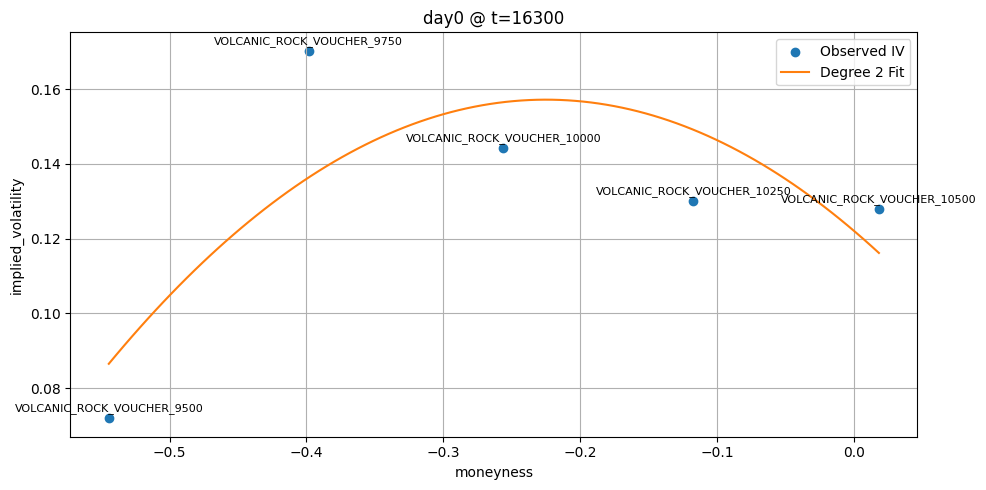

Plotting timestamp 16400...
📈 Spot price of underlying: 10464.0


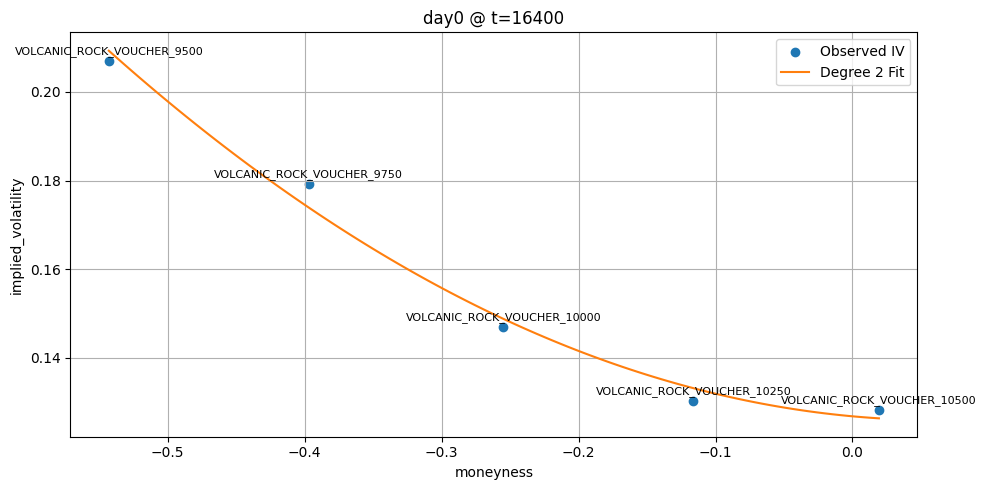

Plotting timestamp 16500...
📈 Spot price of underlying: 10470.0


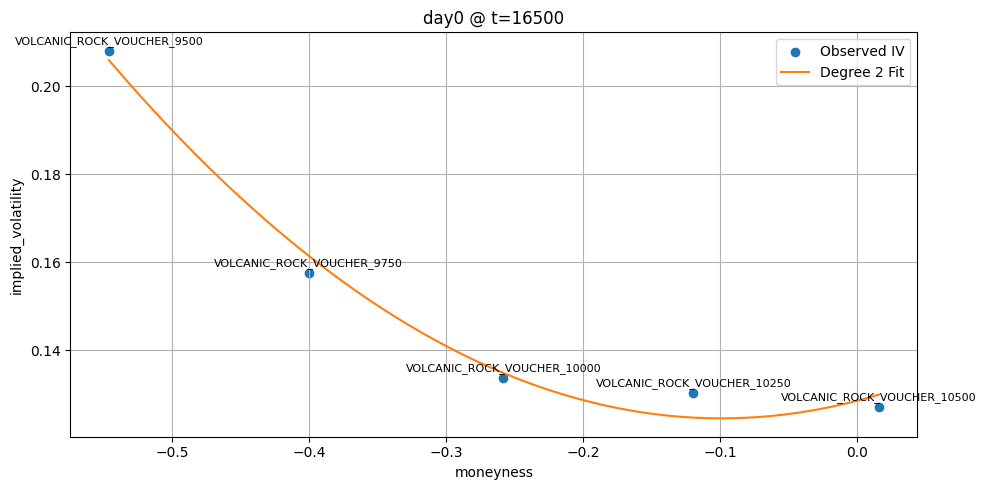

Plotting timestamp 16600...
📈 Spot price of underlying: 10469.5


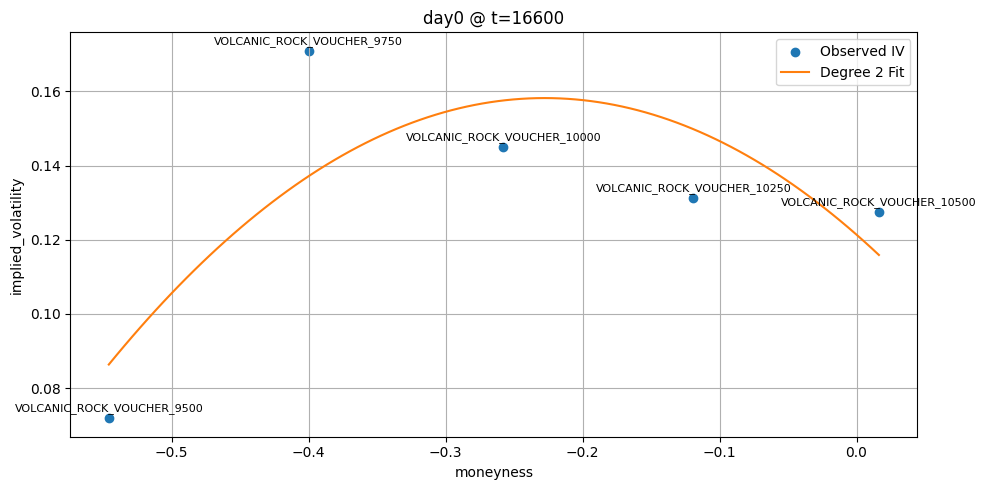

Plotting timestamp 16700...
📈 Spot price of underlying: 10474.0


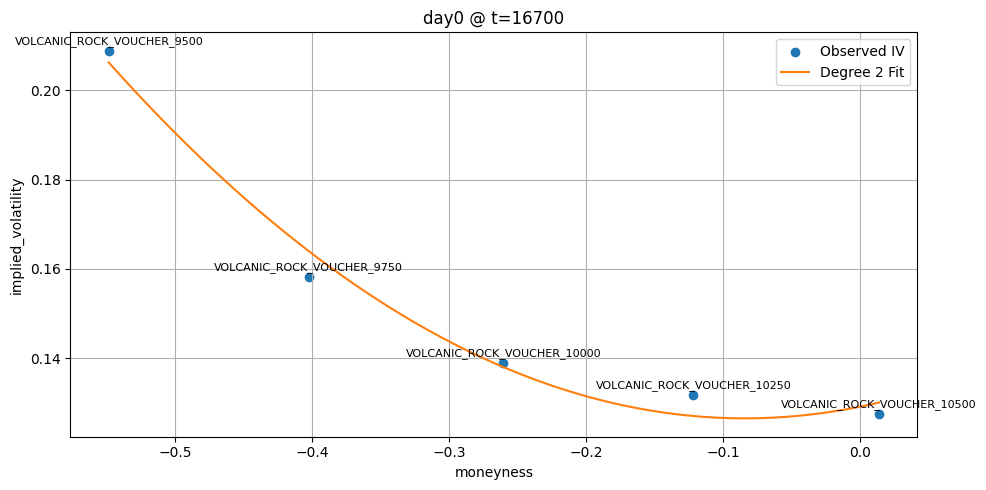

Plotting timestamp 16800...
📈 Spot price of underlying: 10478.0


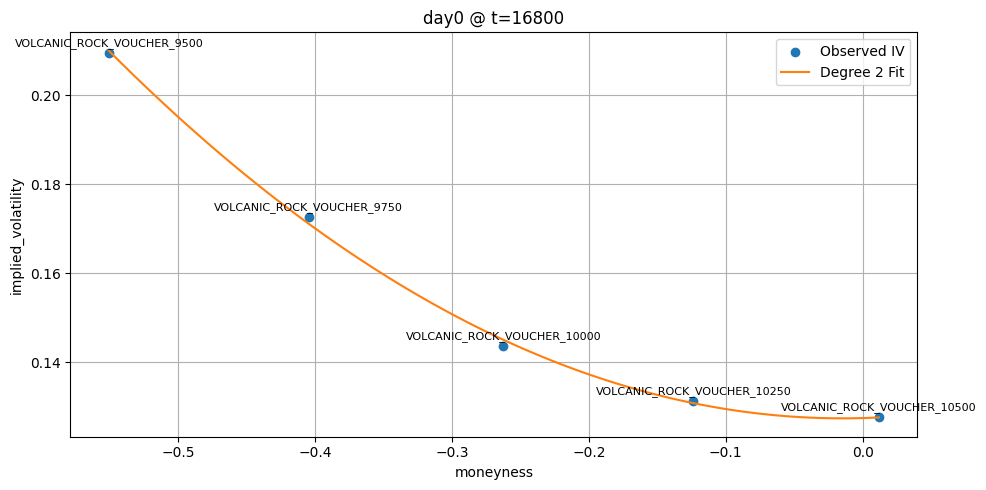

Plotting timestamp 16900...
📈 Spot price of underlying: 10482.5


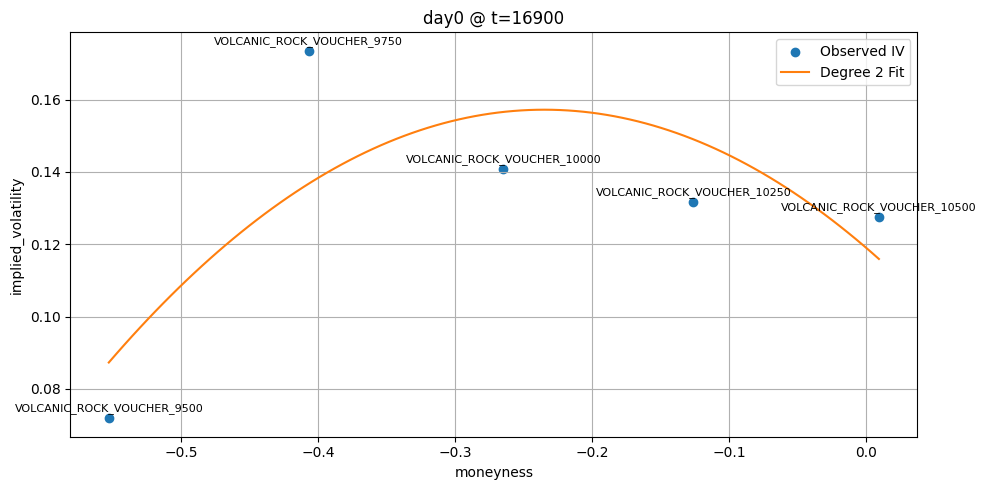

Plotting timestamp 17000...
📈 Spot price of underlying: 10476.5


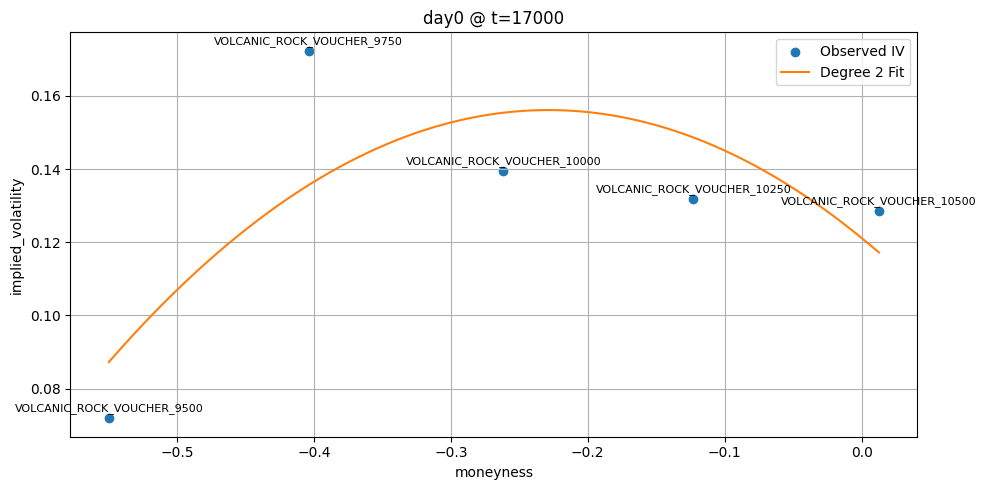

Plotting timestamp 17100...
📈 Spot price of underlying: 10483.0


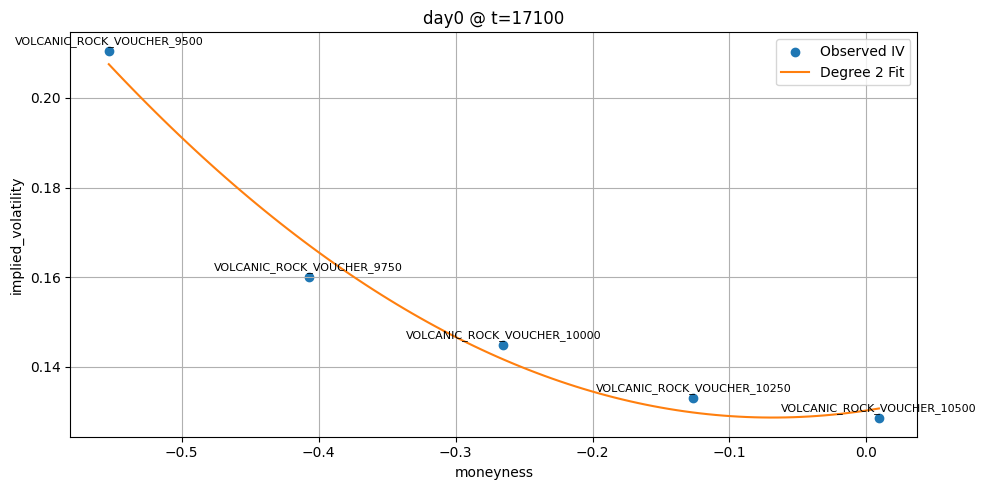

Plotting timestamp 17200...
📈 Spot price of underlying: 10480.0


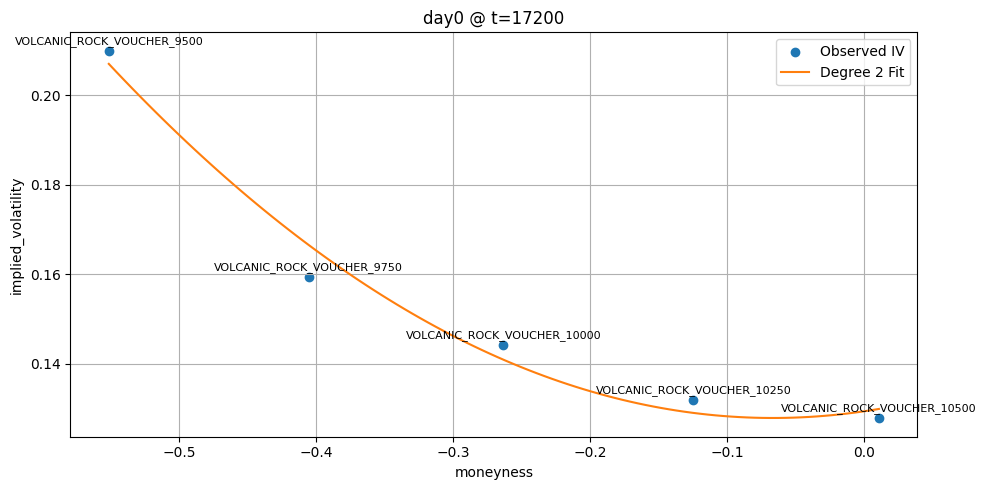

Plotting timestamp 17300...
📈 Spot price of underlying: 10483.0


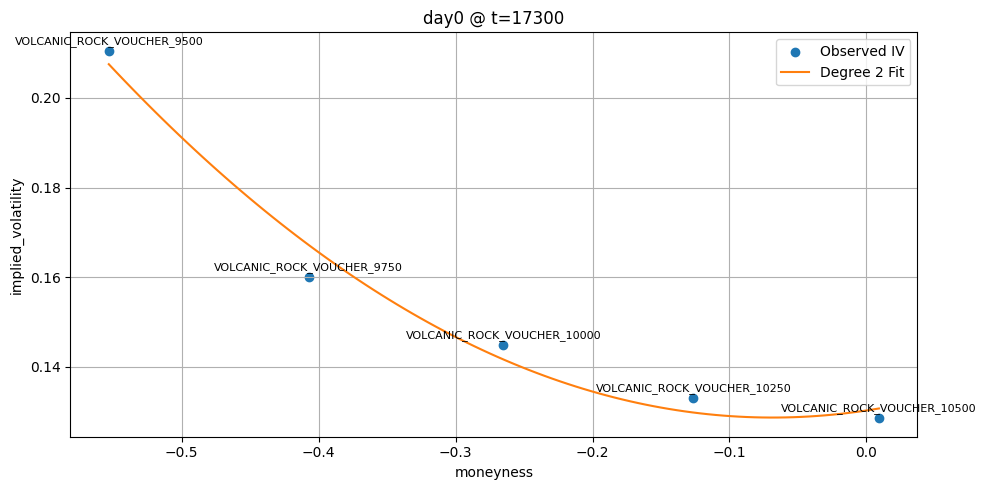

Plotting timestamp 17400...
📈 Spot price of underlying: 10481.5


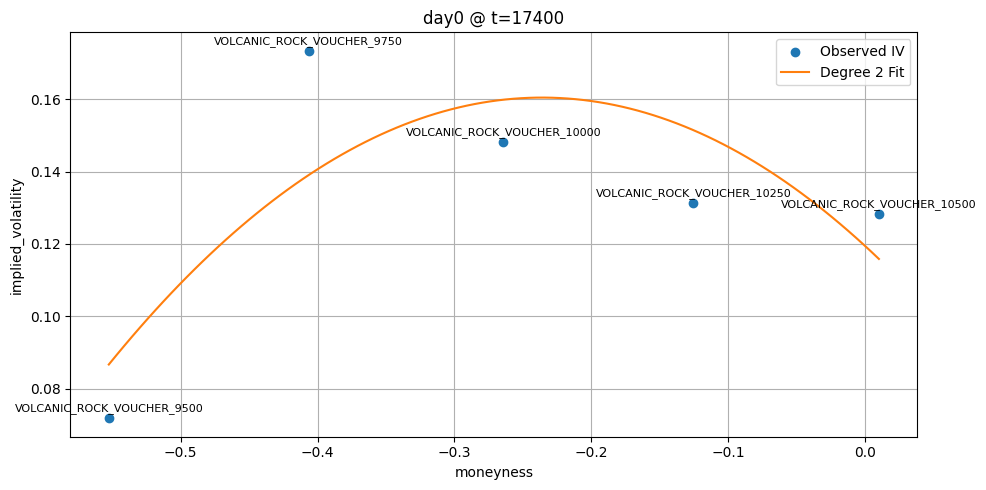

Plotting timestamp 17500...
📈 Spot price of underlying: 10481.0


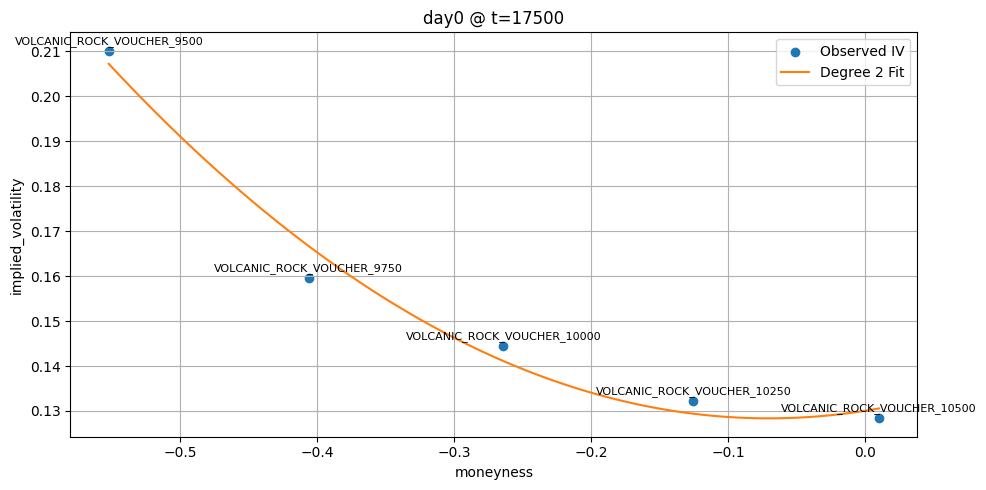

Plotting timestamp 17600...
📈 Spot price of underlying: 10475.0


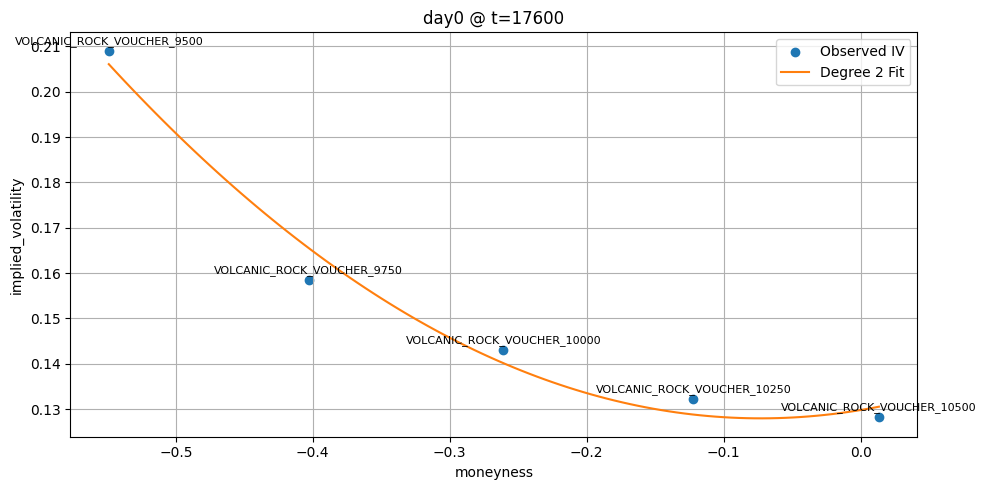

Plotting timestamp 17700...
📈 Spot price of underlying: 10476.0


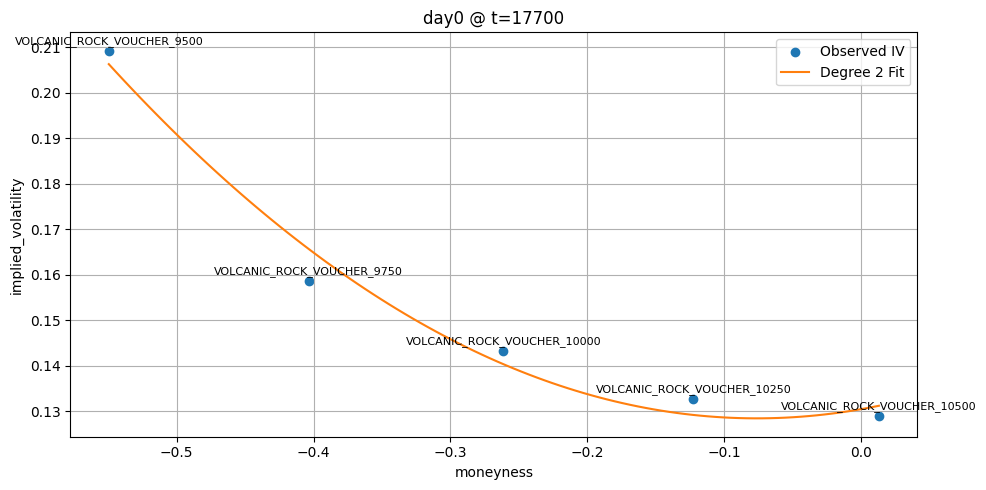

Plotting timestamp 17800...
📈 Spot price of underlying: 10475.0


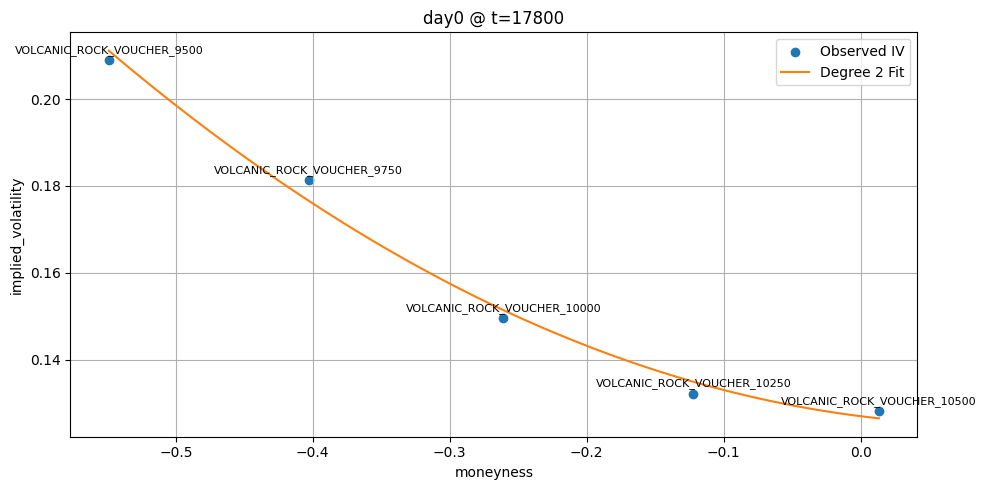

Plotting timestamp 17900...
📈 Spot price of underlying: 10470.0


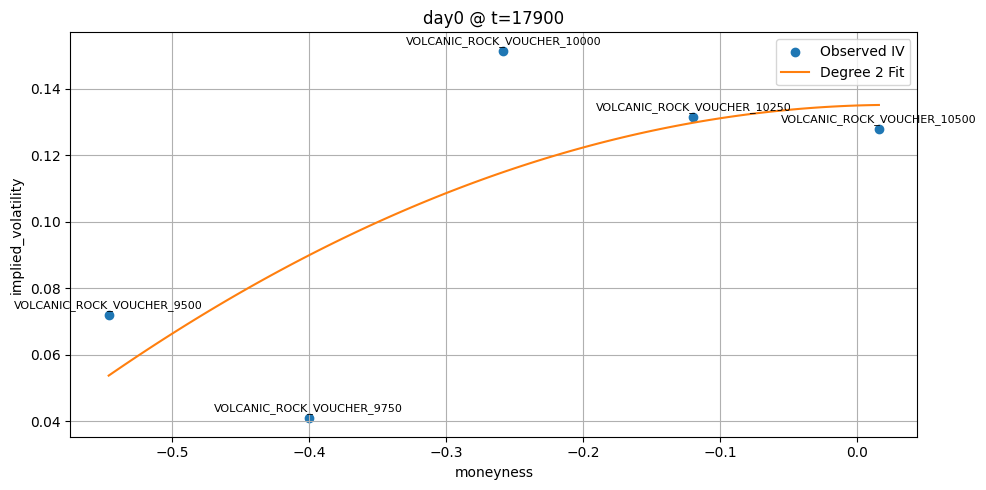

Plotting timestamp 18000...
📈 Spot price of underlying: 10466.0


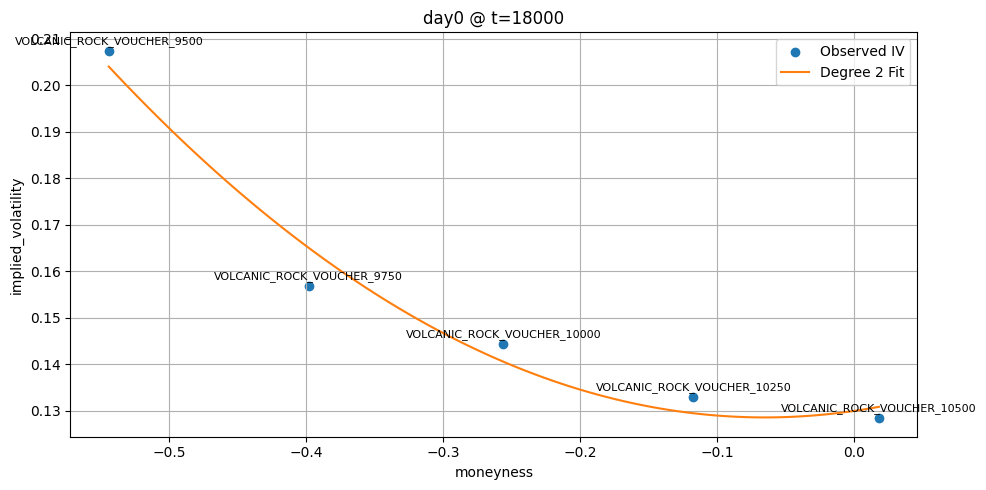

Plotting timestamp 18100...
📈 Spot price of underlying: 10455.5


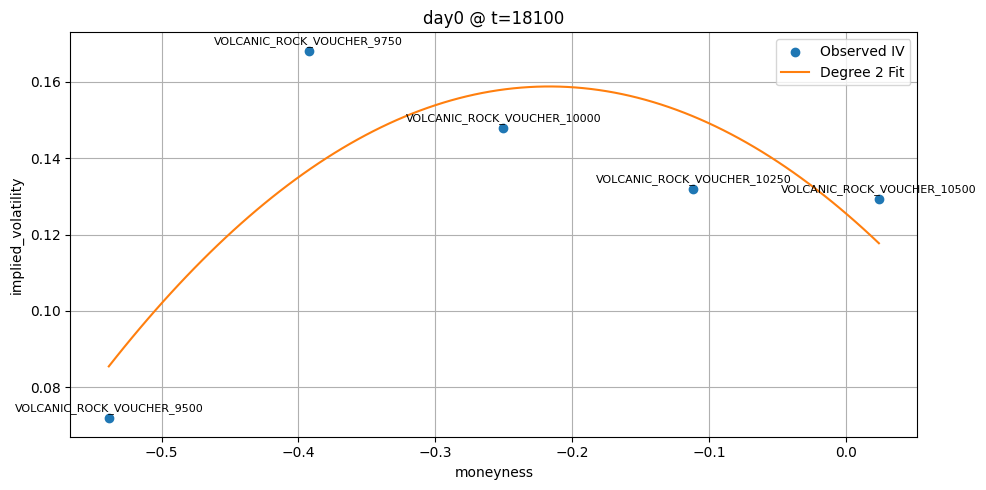

Plotting timestamp 18200...
📈 Spot price of underlying: 10463.0


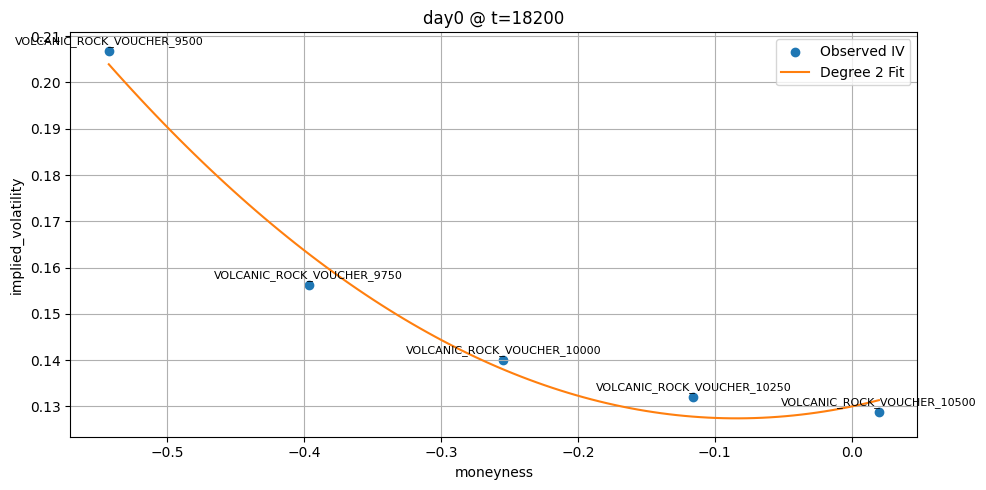

Plotting timestamp 18300...
📈 Spot price of underlying: 10464.5


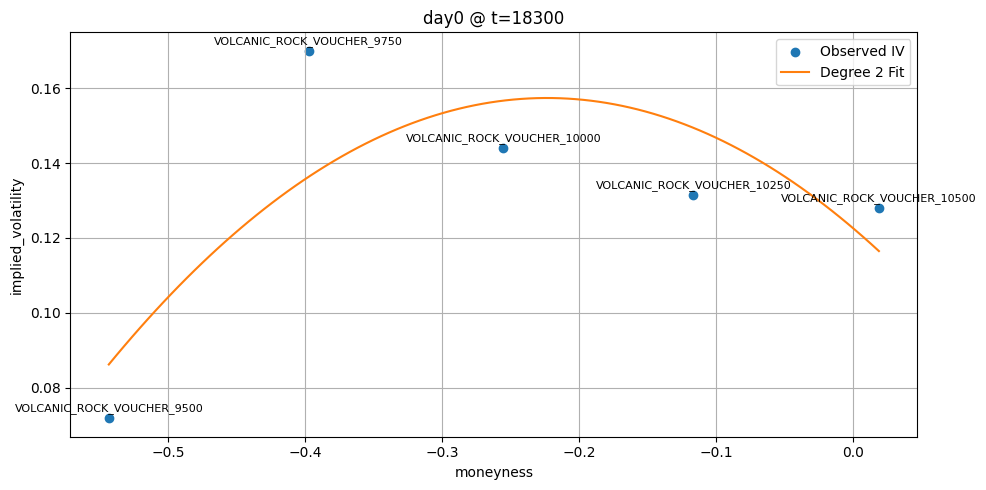

Plotting timestamp 18400...
📈 Spot price of underlying: 10470.0


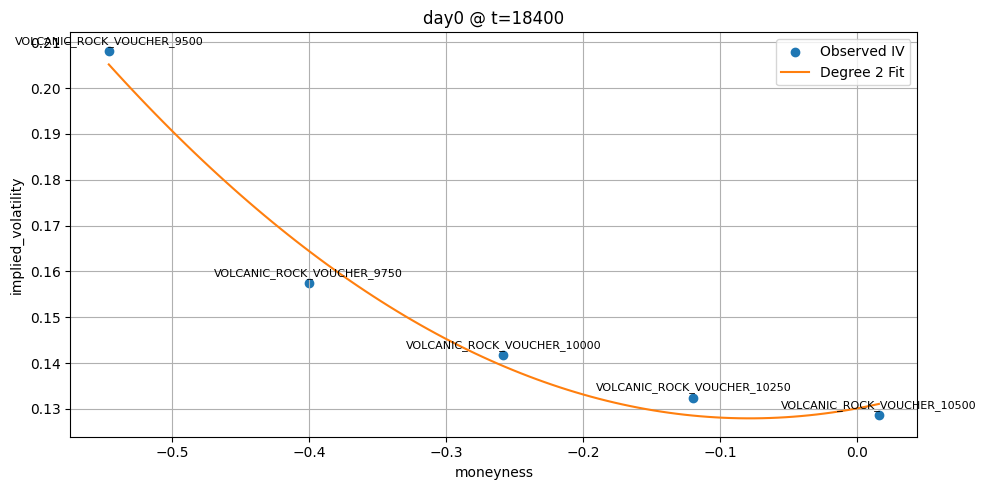

Plotting timestamp 18500...
📈 Spot price of underlying: 10470.5


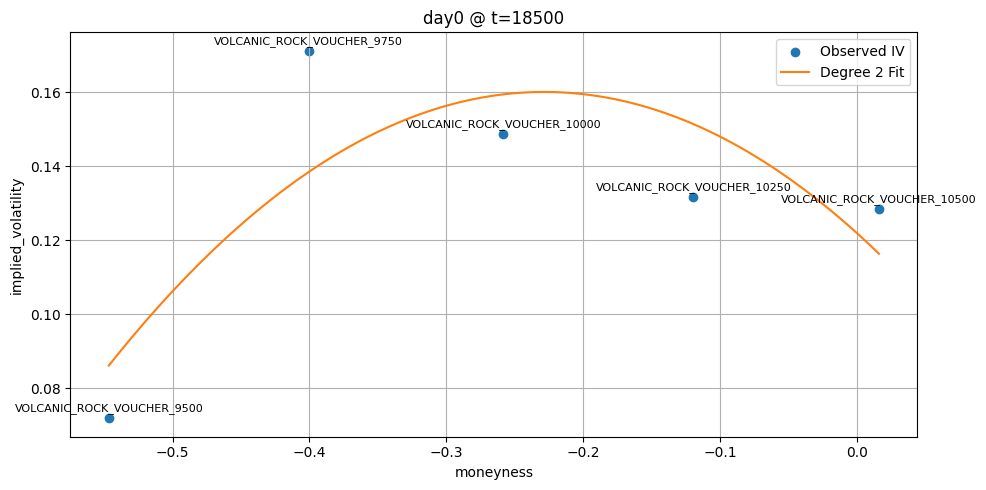

Plotting timestamp 18600...
📈 Spot price of underlying: 10467.5


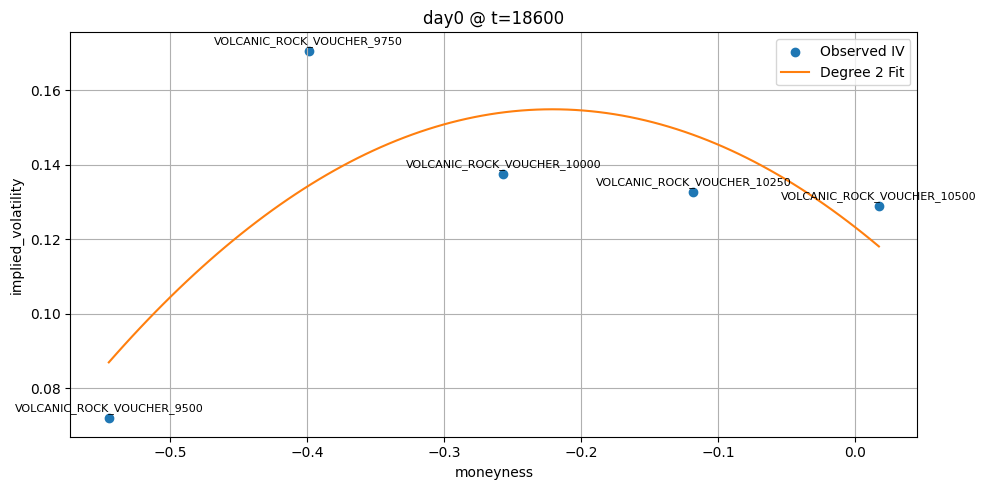

Plotting timestamp 18700...
📈 Spot price of underlying: 10460.5


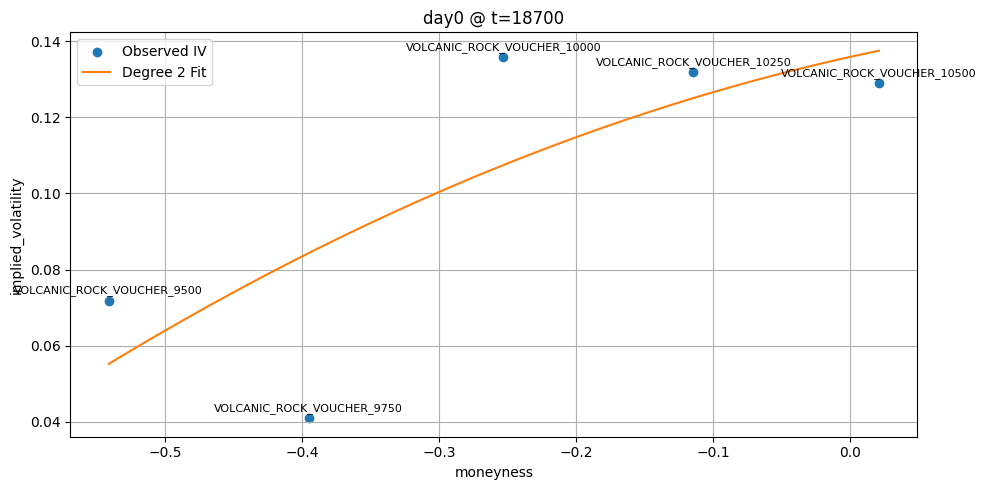

Plotting timestamp 18800...
📈 Spot price of underlying: 10463.5


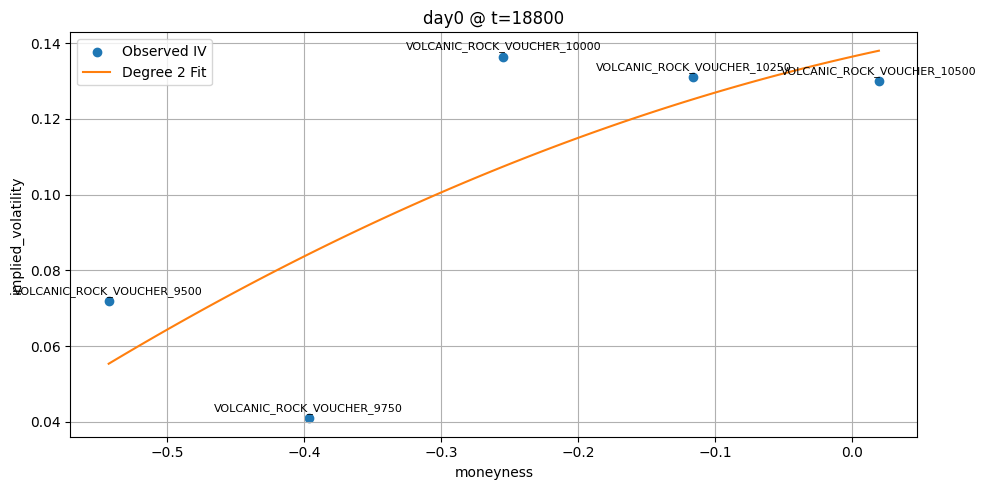

Plotting timestamp 18900...
📈 Spot price of underlying: 10469.0


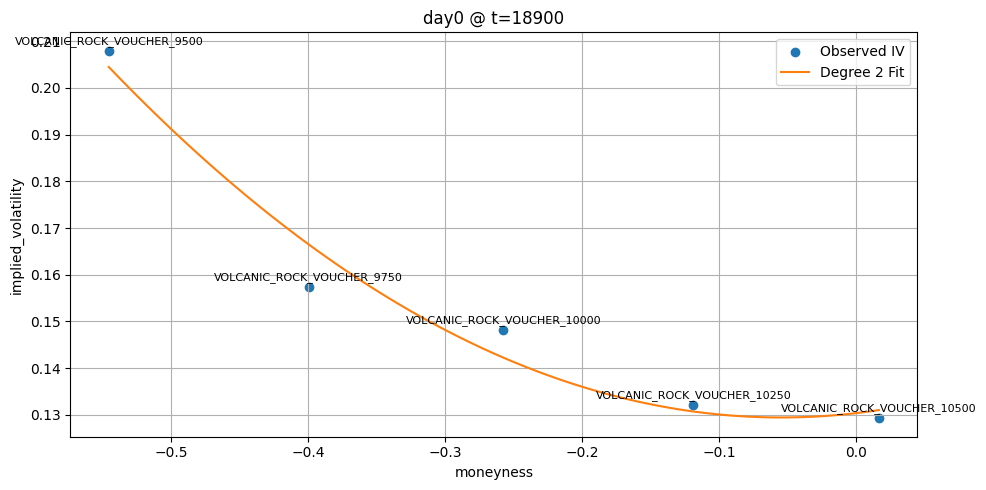

Plotting timestamp 19000...
📈 Spot price of underlying: 10469.0


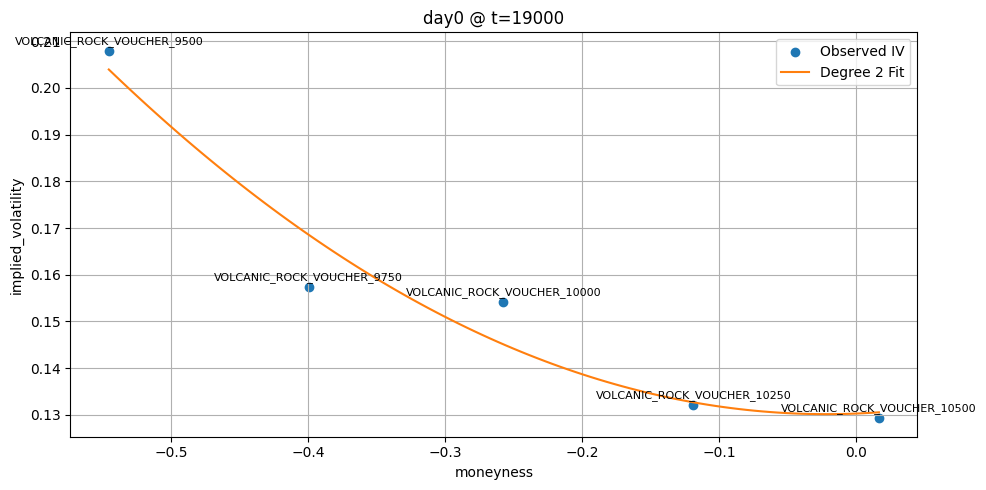

Plotting timestamp 19100...
📈 Spot price of underlying: 10468.5


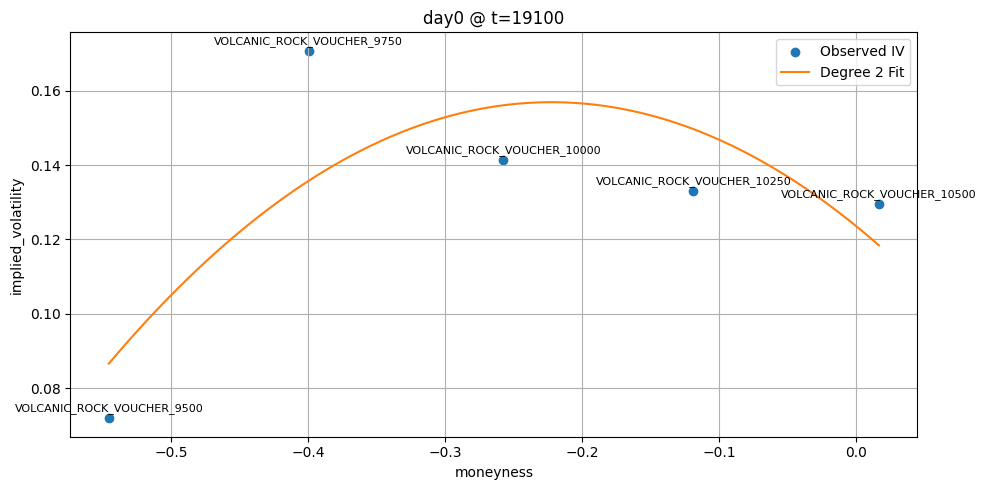

Plotting timestamp 19200...
📈 Spot price of underlying: 10464.5


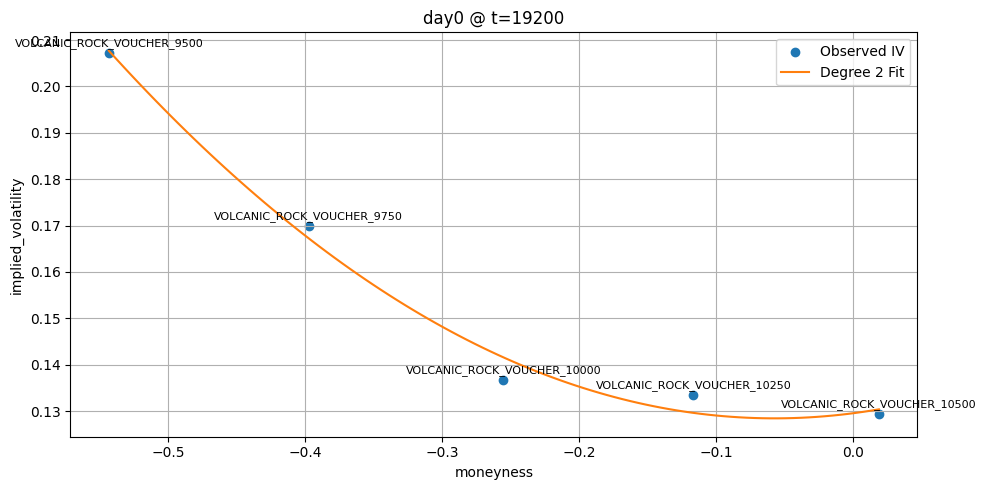

Plotting timestamp 19300...
📈 Spot price of underlying: 10467.5


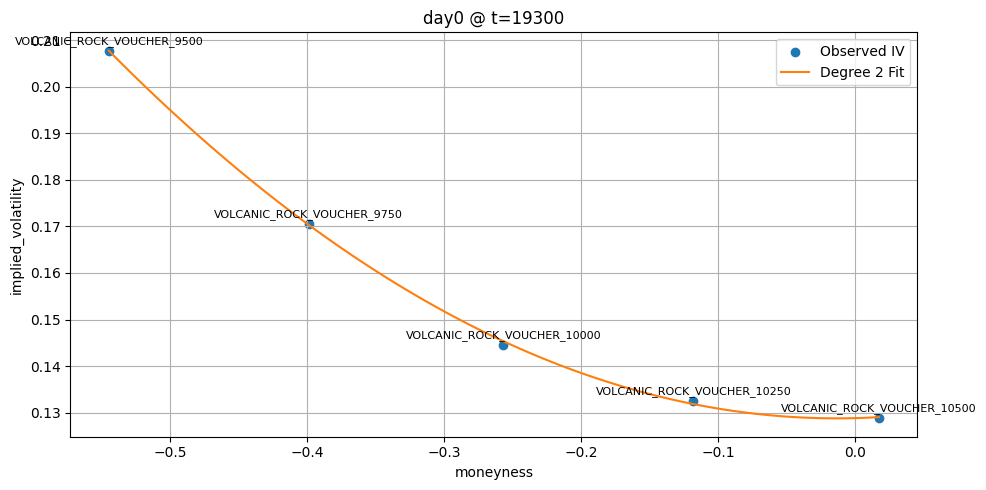

Plotting timestamp 19400...
📈 Spot price of underlying: 10466.5


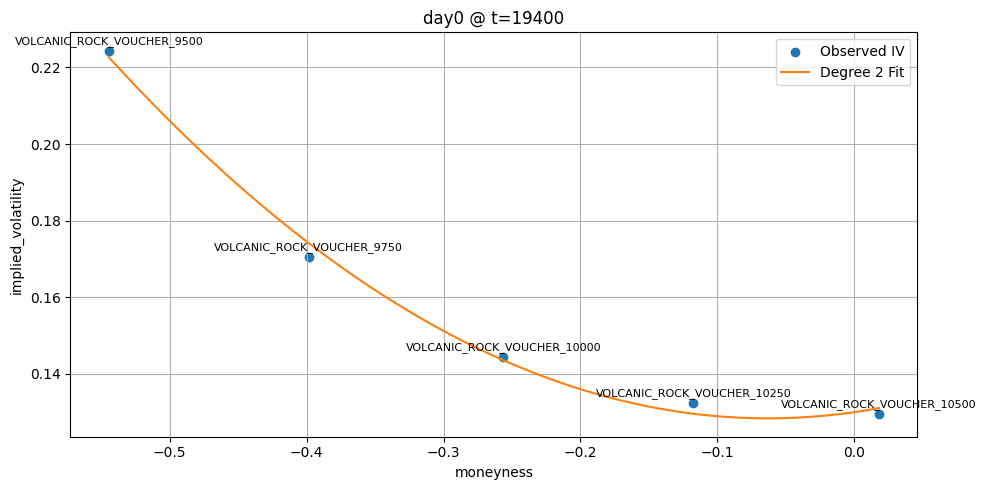

Plotting timestamp 19500...
📈 Spot price of underlying: 10469.0


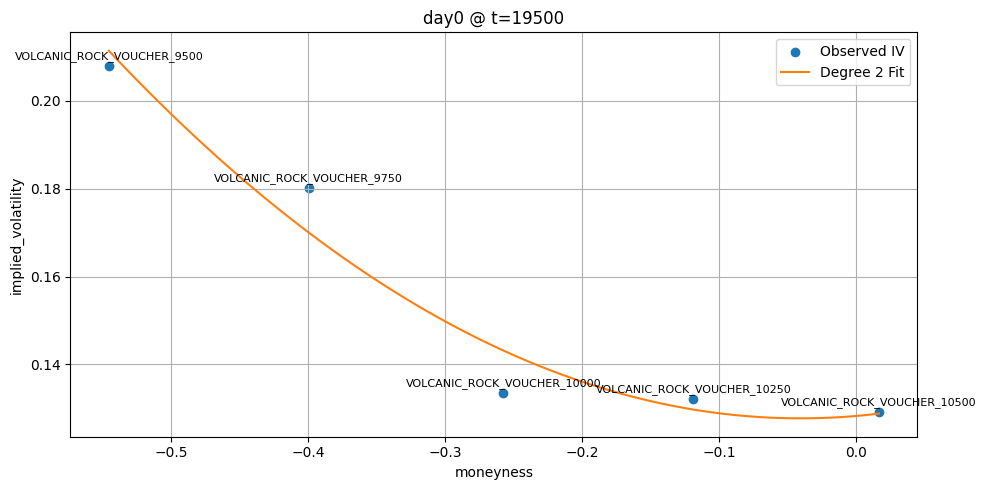

Plotting timestamp 19600...
📈 Spot price of underlying: 10467.5


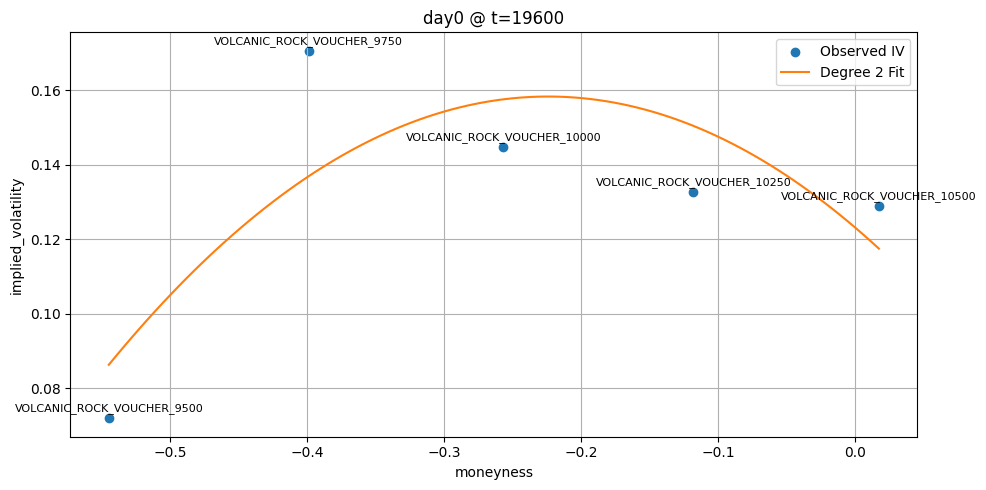

Plotting timestamp 19700...
📈 Spot price of underlying: 10460.5


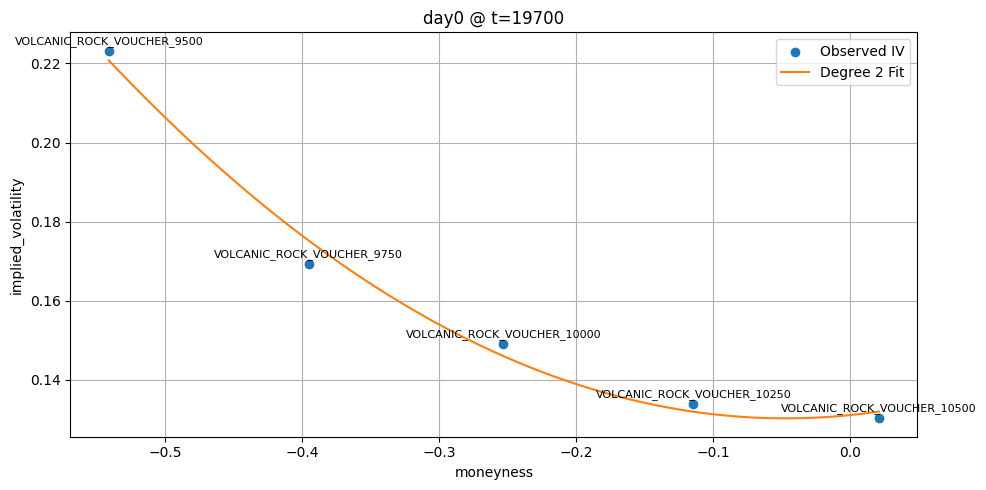

Plotting timestamp 19800...
📈 Spot price of underlying: 10463.0


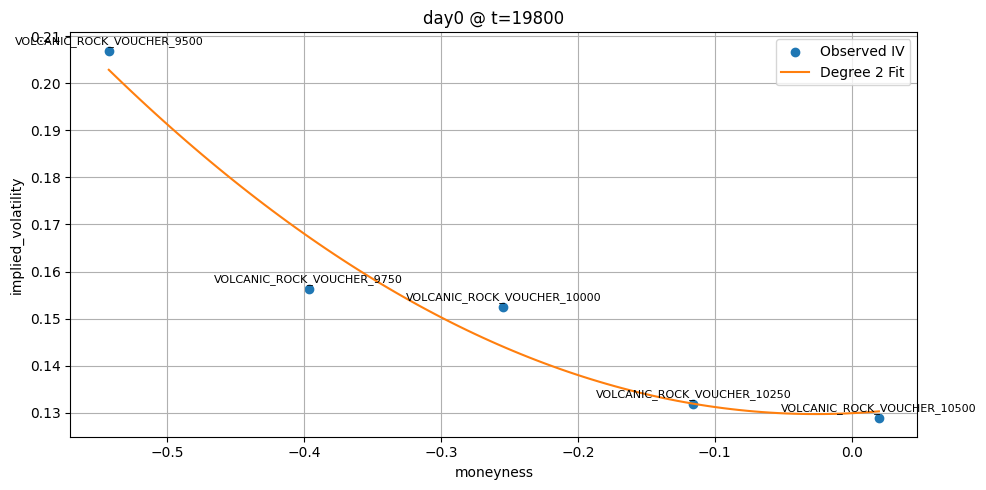

Plotting timestamp 19900...
📈 Spot price of underlying: 10461.5


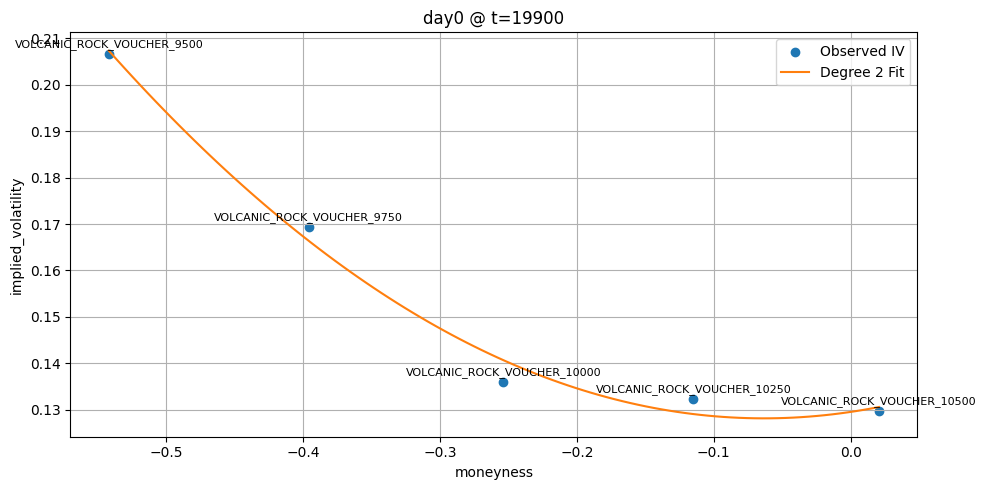

In [12]:
for t in range(0, 20000, 100):
    print(f"Plotting timestamp {t}...")
    plot_iv_vs_moneyness("day0", t)


In [13]:
def plot_iv_timeseries_for_strike(strike_price, day_label, start_timestamp=None, end_timestamp=None, return_df=False):
    import matplotlib.pyplot as plt

    product_name = f"VOLCANIC_ROCK_VOUCHER_{strike_price}"
    df = product_data_by_day[day_label].get(product_name)
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    if df is None or spot_df is None:
        print(f"[Error] Missing data for strike {strike_price} on {day_label}")
        return

    if start_timestamp is not None and end_timestamp is not None:
        df = df[(df["timestamp"] >= start_timestamp) & (df["timestamp"] <= end_timestamp)]
        spot_df = spot_df[(spot_df["timestamp"] >= start_timestamp) & (spot_df["timestamp"] <= end_timestamp)]

    df = df.copy()
    df["spot_price"] = df["timestamp"].map(
        spot_df.set_index("timestamp")["mid_price"]
    )

    total_ticks = 8_000_000
    day_offset = int(day_label.replace("day", "")) * 1_000_000
    df["time_to_expiry"] = (total_ticks - (day_offset + df["timestamp"])) / 252_000_000

    ivs = []
    for row in df.itertuples():
        try:
            iv = implied_volatility(
                call_price=row.mid_price,
                spot=row.spot_price,
                strike=strike_price,
                time_to_expiry=row.time_to_expiry,
                debug=False
            )
        except:
            iv = float("nan")
        ivs.append(iv)

    df["implied_volatility"] = ivs

    if return_df:
        return df[["timestamp", "implied_volatility"]]

    plt.figure(figsize=(10, 5))
    plt.plot(df["timestamp"], df["implied_volatility"], color='tab:blue')
    plt.title(f"Implied Volatility for Strike {strike_price} - {day_label}")
    plt.xlabel("Timestamp")
    plt.ylabel("Implied Volatility")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [14]:
def compute_fair_iv_band(df_iv, std_band=1.5):
    iv_series = df_iv["implied_volatility"].dropna()
    mean_iv = iv_series.mean()
    std_iv = iv_series.std()

    lower_bound = mean_iv - std_band * std_iv
    upper_bound = mean_iv + std_band * std_iv

    print(f"📊 Fair IV range for 9500: {lower_bound:.4f} to {upper_bound:.4f}")
    return lower_bound, upper_bound


In [15]:
def plot_iv_band(df_iv, lower, upper):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 5))
    plt.plot(df_iv["timestamp"], df_iv["implied_volatility"], label="IV 9500", color='tab:blue')
    plt.axhline(lower, color="red", linestyle="--", label="Lower Bound")
    plt.axhline(upper, color="green", linestyle="--", label="Upper Bound")
    plt.title("Implied Volatility for Strike 9500 with Fair Range")
    plt.xlabel("Timestamp")
    plt.ylabel("Implied Volatility")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


📊 Fair IV range for 9500: 0.0460 to 0.2583


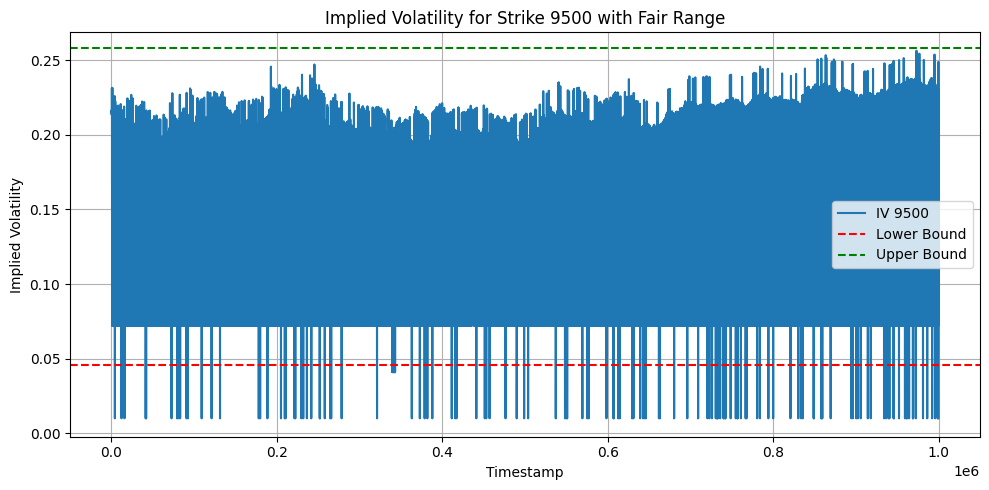

In [16]:
iv_9500_df = plot_iv_timeseries_for_strike(9500, "day0", return_df=True)
low, high = compute_fair_iv_band(iv_9500_df)
plot_iv_band(iv_9500_df, low, high)


In [17]:
def get_valid_9500_timestamps(df_iv_9500, lower_bound, upper_bound):
    """
    Return a list of timestamps where strike 9500's IV is within the fair range.
    """
    valid_rows = df_iv_9500[
        (df_iv_9500["implied_volatility"] >= lower_bound) &
        (df_iv_9500["implied_volatility"] <= upper_bound)
    ]
    return set(valid_rows["timestamp"].values)


📊 Fair IV range for 9500: 0.0460 to 0.2583
📈 Spot price of underlying: 10495.5


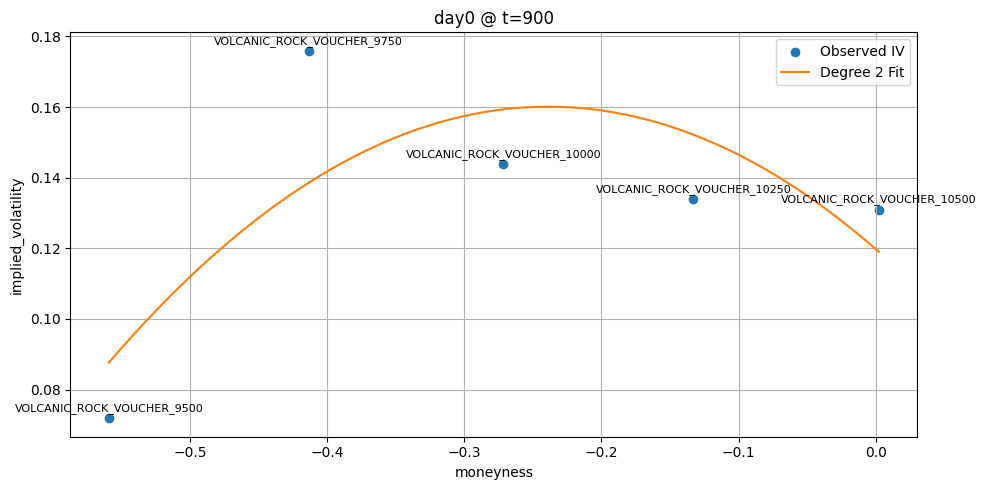

In [18]:
# Step 1: Load IVs and compute bounds
iv_9500_df = plot_iv_timeseries_for_strike(9500, "day0", return_df=True)
low, high = compute_fair_iv_band(iv_9500_df)
valid_ts_9500 = get_valid_9500_timestamps(iv_9500_df, low, high)

# Step 2: Plot a smile at a timestamp
plot_iv_vs_moneyness("day0", 900, valid_9500_timestamps=valid_ts_9500)


**Everything above here is testing just iv vs moneyness. Below here we will look at v_t(m_t = 0)**

In [19]:
def track_atm_iv_over_day(day_label, timestamps, valid_9500_timestamps=None):
    """
    For a list of timestamps in a day, compute fitted IV at moneyness = 0 over time.
    
    Parameters:
        day_label (str): e.g. 'day0'
        timestamps (list): list of integer timestamps to analyze
        valid_9500_timestamps (set): optional filter for including strike 9500
    
    Returns:
        pd.DataFrame: with columns ['timestamp', 'atm_iv']
    """
    results = []

    for ts in timestamps:
        try:
            # Get options
            options_df = volcanic_data_by_day[day_label]
            options = options_df[(options_df["timestamp"] == ts) & options_df["product"].str.contains("VOUCHER")]

            # Get spot
            spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
            spot_price = spot_df[spot_df["timestamp"] == ts]["mid_price"].values[0]

            current_day_index = int(day_label.replace("day", ""))
            options = compute_ivs_for_timestamp(options, spot_price, current_day_index, ts)
            options = compute_moneyness_for_timestamp(options, spot_price, current_day_index, ts)

            # Exclude 9500 if needed
            if valid_9500_timestamps is not None:
                is_9500 = options["product"] == "VOLCANIC_ROCK_VOUCHER_9500"
                not_in_valid = ts not in valid_9500_timestamps
                if not_in_valid:
                    options = options[~is_9500]

            # Fit parabola
            fit_df = options.dropna(subset=["moneyness", "implied_volatility"])
            if len(fit_df) < 3:
                continue  # need at least 3 points to fit parabola

            x = fit_df["moneyness"].values
            y = fit_df["implied_volatility"].values
            coeffs = np.polyfit(x, y, 2)
            poly = np.poly1d(coeffs)
            atm_iv = poly(0.0)  # moneyness = 0

            results.append((ts, atm_iv))
        except Exception as e:
            print(f"[WARN] Failed at timestamp {ts}: {e}")
            continue

    return pd.DataFrame(results, columns=["timestamp", "atm_iv"])


In [20]:
def plot_atm_iv_timeseries(df, title="ATM Implied Volatility Over Time"):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 5))
    plt.plot(df["timestamp"], df["atm_iv"], color='tab:blue')
    plt.xlabel("Timestamp")
    plt.ylabel("ATM Implied Volatility")
    plt.title(title)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


📊 Fair IV range for 9500: 0.0460 to 0.2583


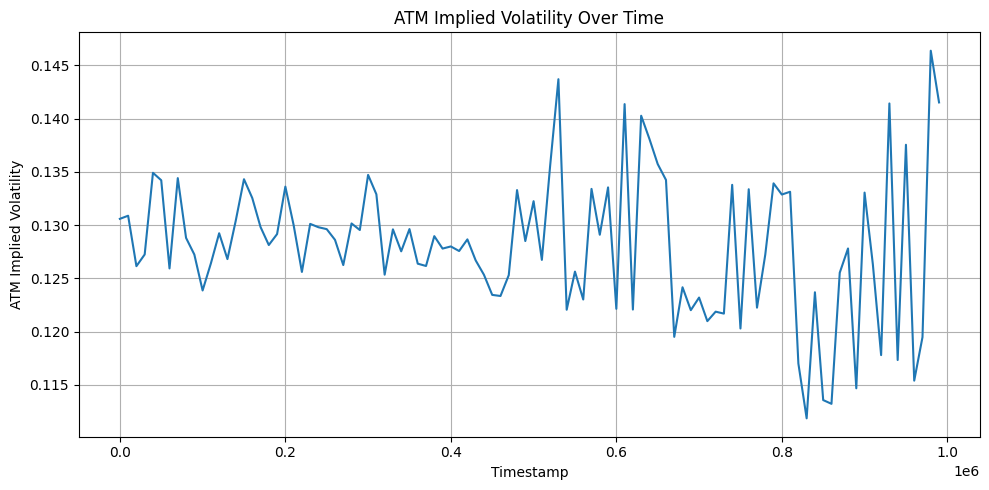

In [21]:
# Step 1: Prepare valid timestamps for 9500 (optional)
iv_9500_df = plot_iv_timeseries_for_strike(9500, "day0", return_df=True)
low, high = compute_fair_iv_band(iv_9500_df)
valid_ts_9500 = get_valid_9500_timestamps(iv_9500_df, low, high)

# Step 2: Track smile center
timestamps = list(range(0, 1000000, 10000))  # every 10k ticks
atm_iv_df = track_atm_iv_over_day("day4", timestamps, valid_9500_timestamps=valid_ts_9500)

# Step 3: Plot
plot_atm_iv_timeseries(atm_iv_df)


In [22]:
def plot_iv_and_spot(atm_iv_df, day_label):
    import matplotlib.pyplot as plt

    # Load spot price for this day
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]

    # Filter to overlapping timestamps
    spot_df = spot_df[spot_df["timestamp"].isin(atm_iv_df["timestamp"])]
    atm_iv_df = atm_iv_df[atm_iv_df["timestamp"].isin(spot_df["timestamp"])]

    plt.figure(figsize=(10, 5))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    ax1.plot(atm_iv_df["timestamp"], atm_iv_df["atm_iv"], label="ATM IV", color='tab:blue')
    ax2.plot(spot_df["timestamp"], spot_df["mid_price"], label="Spot Price", color='tab:orange')

    ax1.set_ylabel("ATM Implied Volatility", color='tab:blue')
    ax2.set_ylabel("Spot Price", color='tab:orange')
    ax1.set_xlabel("Timestamp")
    plt.title(f"ATM IV and Spot Price Over Time ({day_label})")
    ax1.grid(True)
    plt.tight_layout()
    plt.show()


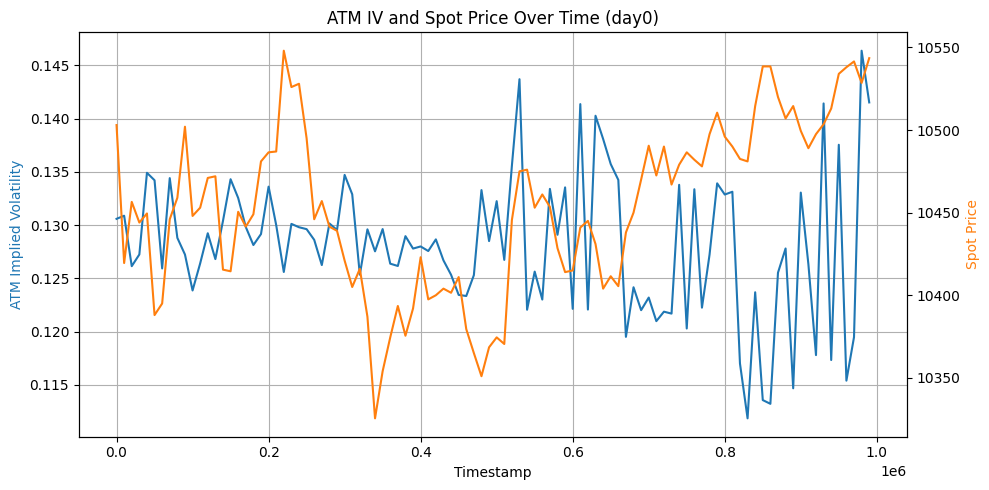

In [23]:
plot_iv_and_spot(atm_iv_df, "day0")


In [24]:
def plot_iv_and_spot_timeseries(atm_iv_df, day_label):
    import matplotlib.pyplot as plt

    # Pull matching spot data
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    spot_df = spot_df[spot_df["timestamp"].isin(atm_iv_df["timestamp"])]
    atm_iv_df = atm_iv_df[atm_iv_df["timestamp"].isin(spot_df["timestamp"])]

    # Merge into one DataFrame
    merged = atm_iv_df.merge(spot_df[["timestamp", "mid_price"]], on="timestamp")

    # Plot both over time
    plt.figure(figsize=(10, 5))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    ax1.plot(merged["timestamp"], merged["atm_iv"], color='tab:blue', label="ATM IV")
    ax2.plot(merged["timestamp"], merged["mid_price"], color='tab:orange', label="Spot Price")

    ax1.set_ylabel("ATM Implied Volatility", color='tab:blue')
    ax2.set_ylabel("Spot Price", color='tab:orange')
    ax1.set_xlabel("Timestamp")
    plt.title(f"ATM IV and Spot Price Over Time ({day_label})")
    ax1.grid(True)
    plt.tight_layout()
    plt.show()


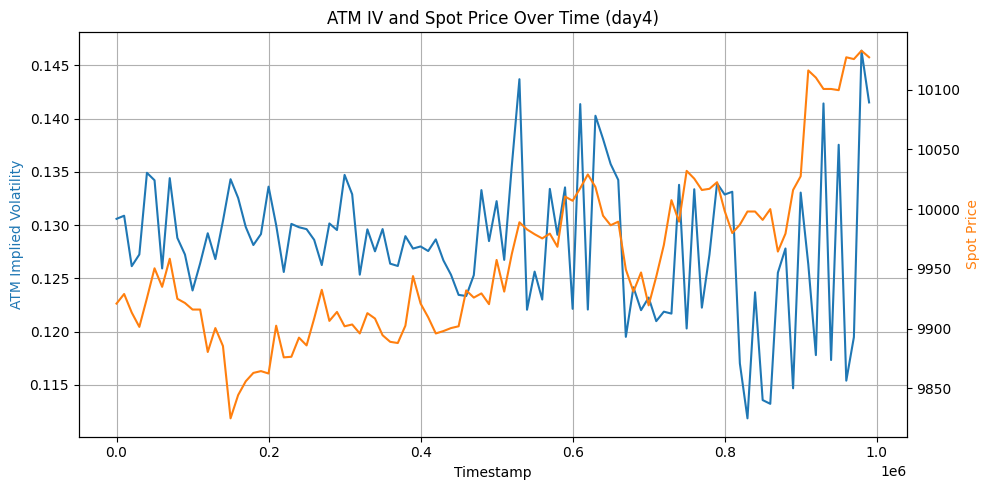

In [25]:
plot_iv_and_spot_timeseries(atm_iv_df, "day4")


In [26]:
def plot_iv_parabola_fit_excluding_9500(df, spot_price, x_col="moneyness", y_col="implied_volatility", label_col="product", degree=2, title=None):
    import numpy as np
    import matplotlib.pyplot as plt

    # Filter out strike 9500
    df = df[~df[label_col].str.contains("9500")]

    # Drop NaNs and sort
    df = df[[x_col, y_col, label_col]].dropna().sort_values(by=x_col)
    x = df[x_col].values
    y = df[y_col].values
    labels = df[label_col].values

    # Fit parabola
    coeffs = np.polyfit(x, y, degree)
    poly = np.poly1d(coeffs)
    x_fit = np.linspace(min(x), max(x), 100)
    y_fit = poly(x_fit)

    # Plot
    plt.figure(figsize=(10, 5))
    plt.scatter(x, y, color='tab:blue', label="Observed IV")
    plt.plot(x_fit, y_fit, color='tab:orange', label=f"Degree {degree} Fit")

    for xi, yi, label in zip(x, y, labels):
        plt.annotate(label, (xi, yi), textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8)

    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(title or f"IV Smile (excluding 9500) — Spot = {spot_price}")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [27]:
# With 9500


day_label = "day0"
timestamp = 3000

spot_price = product_data_by_day[day_label]["VOLCANIC_ROCK"]\
    .query("timestamp == @timestamp")["mid_price"].values[0]

df = volcanic_data_by_day[day_label]
options = df[(df["timestamp"] == timestamp) & df["product"].str.contains("VOUCHER")]
options = compute_ivs_for_timestamp(options, spot_price, int(day_label.replace("day", "")), timestamp)
options = compute_moneyness_for_timestamp(options, spot_price, int(day_label.replace("day", "")), timestamp)

plot_iv_parabola_fit_with_labels(
    options,
    spot_price=spot_price,
    x_col="moneyness",
    y_col="implied_volatility",
    label_col="product",
    degree=2,
    title=f"{day_label} @ t={timestamp} — Including 9500"
)

# Without 9500
plot_iv_parabola_fit_excluding_9500(
    options,
    spot_price=spot_price,
    x_col="moneyness",
    y_col="implied_volatility",
    label_col="product",
    degree=2,
    title=f"{day_label} @ t={timestamp} — Excluding 9500"
)


NameError: name 'compute_ivs_for_timestamp' is not defined

In [28]:
def compute_iv_vs_moneyness_points(day_label, timestamps):
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    options_df = volcanic_data_by_day[day_label]

    points = []

    for ts in timestamps:
        try:
            spot_price = spot_df.query("timestamp == @ts")["mid_price"].values[0]
            current_day_index = int(day_label.replace("day", ""))
            tte = (8_000_000 - (current_day_index * 1_000_000 + ts)) / 252_000_000

            options = options_df[(options_df["timestamp"] == ts) & options_df["product"].str.contains("VOUCHER")]
            options = compute_ivs_for_timestamp(options, spot_price, current_day_index, ts)
            options = compute_moneyness_for_timestamp(options, spot_price, current_day_index, ts)

            for row in options.itertuples():
                strike = int(row.product.split("_")[-1])
                if np.isnan(row.implied_volatility) or np.isnan(row.moneyness):
                    continue
                points.append((row.moneyness, row.implied_volatility, strike))
        except:
            continue

    return points


In [29]:
def plot_iv_vs_moneyness_scatter(points, title="Implied Volatility vs Moneyness"):
    df = pd.DataFrame(points, columns=["moneyness", "implied_volatility", "strike"])

    plt.figure(figsize=(10, 6))
    for strike in sorted(df["strike"].unique()):
        sub = df[df["strike"] == strike]
        plt.scatter(sub["moneyness"], sub["implied_volatility"], s=12, label=f"Strike {strike}", alpha=0.7)

    plt.xlabel("Moneyness (log(K/S) / sqrt(T))")
    plt.ylabel("Implied Volatility")
    plt.title(title)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


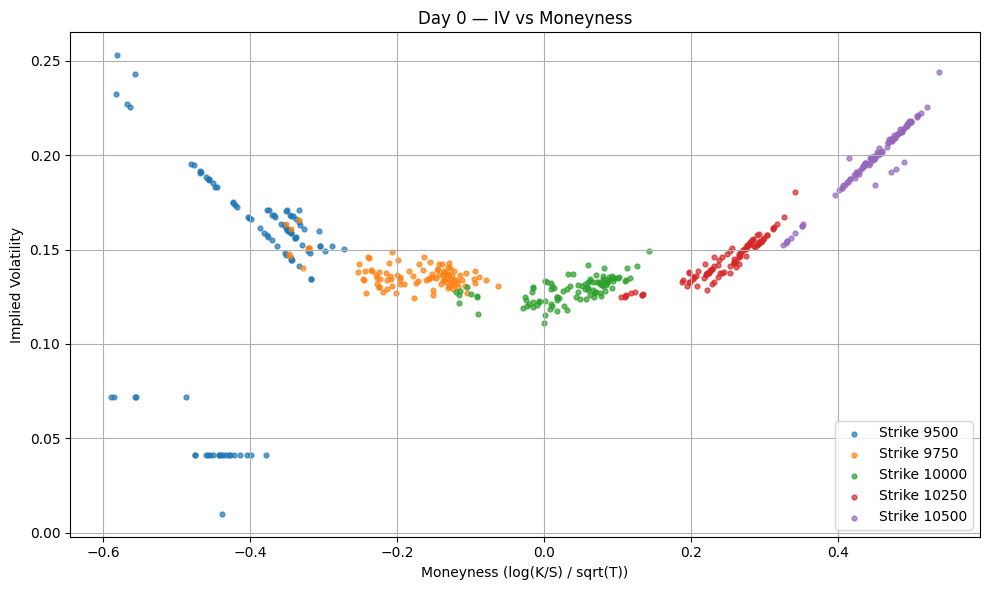

In [30]:
timestamps = list(range(0, 1_000_000, 10000))
points = compute_iv_vs_moneyness_points("day4", timestamps)
plot_iv_vs_moneyness_scatter(points, title="Day 0 — IV vs Moneyness")


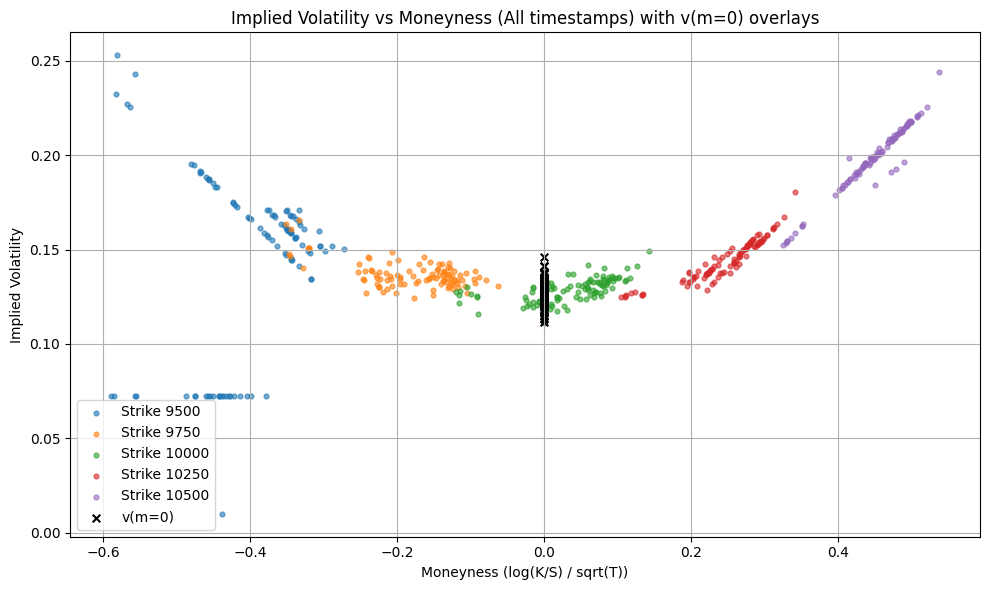

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statistics import NormalDist

def compute_ivs_for_timestamp(df, spot_price, current_day, timestamp):
    ivs = []
    total_ticks = 8_000_000
    ticks_elapsed = current_day * 1_000_000 + timestamp
    tte = (total_ticks - ticks_elapsed) / 252_000_000

    for row in df.itertuples():
        strike = int(row.product.split("_")[-1])
        call_price = row.mid_price
        try:
            if call_price <= 0 or spot_price <= 0 or strike <= 0 or tte <= 0:
                raise ValueError("Invalid input")
            low_vol, high_vol = 0.01, 2.0
            for _ in range(100):
                mid_vol = (low_vol + high_vol) / 2
                d1 = (np.log(spot_price / strike) + 0.5 * mid_vol**2 * tte) / (mid_vol * np.sqrt(tte))
                d2 = d1 - mid_vol * np.sqrt(tte)
                est_price = spot_price * NormalDist().cdf(d1) - strike * NormalDist().cdf(d2)
                if abs(est_price - call_price) < 1e-5:
                    break
                if est_price > call_price:
                    high_vol = mid_vol
                else:
                    low_vol = mid_vol
            ivs.append(mid_vol)
        except:
            ivs.append(float("nan"))

    df = df.copy()
    df["implied_volatility"] = ivs
    return df

def compute_moneyness_for_timestamp(df, spot_price, current_day, timestamp):
    total_ticks = 8_000_000
    ticks_elapsed = current_day * 1_000_000 + timestamp
    tte = (total_ticks - ticks_elapsed) / 252_000_000

    moneyness = []
    for row in df.itertuples():
        strike = int(row.product.split("_")[-1])
        try:
            m = np.log(strike / spot_price) / np.sqrt(tte)
        except:
            m = float("nan")
        moneyness.append(m)
    df = df.copy()
    df["moneyness"] = moneyness
    return df

# Compute all points and base IVs
def compute_scatter_and_baseiv(day_label, timestamps):
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    options_df = volcanic_data_by_day[day_label]
    
    all_points = []
    base_iv_points = []

    for ts in timestamps:
        try:
            spot_price = spot_df.query("timestamp == @ts")["mid_price"].values[0]
            day_index = int(day_label.replace("day", ""))
            tte = (8_000_000 - (day_index * 1_000_000 + ts)) / 252_000_000

            options = options_df[(options_df["timestamp"] == ts) & options_df["product"].str.contains("VOUCHER")]
            options = compute_ivs_for_timestamp(options, spot_price, day_index, ts)
            options = compute_moneyness_for_timestamp(options, spot_price, day_index, ts)

            # Drop NaNs
            options = options.dropna(subset=["implied_volatility", "moneyness"])
            for row in options.itertuples():
                strike = int(row.product.split("_")[-1])
                all_points.append((row.moneyness, row.implied_volatility, strike))

            # Fit parabola for base IV
            if len(options) >= 3:
                x = options["moneyness"].values
                y = options["implied_volatility"].values
                coeffs = np.polyfit(x, y, 2)
                poly = np.poly1d(coeffs)
                base_iv_points.append((0, poly(0)))  # m=0
        except:
            continue

    return pd.DataFrame(all_points, columns=["moneyness", "implied_volatility", "strike"]), pd.DataFrame(base_iv_points, columns=["moneyness", "implied_volatility"])

# Run and plot
timestamps = list(range(0, 1_000_000, 10000))
scatter_df, base_iv_df = compute_scatter_and_baseiv("day4", timestamps)

plt.figure(figsize=(10, 6))
for strike in sorted(scatter_df["strike"].unique()):
    sub = scatter_df[scatter_df["strike"] == strike]
    plt.scatter(sub["moneyness"], sub["implied_volatility"], s=12, label=f"Strike {strike}", alpha=0.6)

plt.scatter(base_iv_df["moneyness"], base_iv_df["implied_volatility"], s=30, color='black', marker='x', label="v(m=0)")

plt.xlabel("Moneyness (log(K/S) / sqrt(T))")
plt.ylabel("Implied Volatility")
plt.title("Implied Volatility vs Moneyness (All timestamps) with v(m=0) overlays")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statistics import NormalDist

def compute_ivs_for_timestamp(df, spot_price, current_day, timestamp):
    ivs = []
    total_ticks = 8_000_000
    ticks_elapsed = current_day * 1_000_000 + timestamp
    tte = (total_ticks - ticks_elapsed) / 252_000_000

    for row in df.itertuples():
        strike = int(row.product.split("_")[-1])
        call_price = row.mid_price
        try:
            if call_price <= 0 or spot_price <= 0 or strike <= 0 or tte <= 0:
                raise ValueError("Invalid input")
            low_vol, high_vol = 0.01, 2.0
            for _ in range(100):
                mid_vol = (low_vol + high_vol) / 2
                d1 = (np.log(spot_price / strike) + 0.5 * mid_vol**2 * tte) / (mid_vol * np.sqrt(tte))
                d2 = d1 - mid_vol * np.sqrt(tte)
                est_price = spot_price * NormalDist().cdf(d1) - strike * NormalDist().cdf(d2)
                if abs(est_price - call_price) < 1e-5:
                    break
                if est_price > call_price:
                    high_vol = mid_vol
                else:
                    low_vol = mid_vol
            ivs.append(mid_vol)
        except:
            ivs.append(float("nan"))

    df = df.copy()
    df["implied_volatility"] = ivs
    return df

def compute_moneyness_for_timestamp(df, spot_price, current_day, timestamp):
    total_ticks = 8_000_000
    ticks_elapsed = current_day * 1_000_000 + timestamp
    tte = (total_ticks - ticks_elapsed) / 252_000_000

    moneyness = []
    for row in df.itertuples():
        strike = int(row.product.split("_")[-1])
        try:
            m = np.log(strike / spot_price) / np.sqrt(tte)
        except:
            m = float("nan")
        moneyness.append(m)
    df = df.copy()
    df["moneyness"] = moneyness
    return df

def get_full_base_iv_series(day_label):
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    options_df = volcanic_data_by_day[day_label]
    base_ivs = []

    for ts in range(0, 1_000_000, 100):  # ⬅️ Every timestamp
        try:
            spot_price = spot_df.query("timestamp == @ts")["mid_price"].values[0]
            current_day = int(day_label.replace("day", ""))
            options = options_df[(options_df["timestamp"] == ts) & options_df["product"].str.contains("VOUCHER")]
            options = compute_ivs_for_timestamp(options, spot_price, current_day, ts)
            options = compute_moneyness_for_timestamp(options, spot_price, current_day, ts)
            options = options.dropna(subset=["implied_volatility", "moneyness"])

            if len(options) >= 3:
                x = options["moneyness"].values
                y = options["implied_volatility"].values
                coeffs = np.polyfit(x, y, 2)
                poly = np.poly1d(coeffs)
                base_ivs.append((ts, poly(0)))
        except:
            continue
=
    return pd.DataFrame(base_ivs, columns=["timestamp", "atm_iv"])

# Compute and plot
base_iv_df = get_full_base_iv_series("day1")

plt.figure(figsize=(12, 5))
plt.plot(base_iv_df["timestamp"], base_iv_df["atm_iv"], label="v(m=0)", color='tab:blue')
plt.xlabel("Timestamp")
plt.ylabel("Fitted ATM Implied Volatility (v(m=0))")
plt.title("Smile Center (ATM IV) Over Time — Day 0 (Full Resolution)")
plt.grid(True)
plt.tight_layout()
plt.show()


SyntaxError: invalid syntax (1720808617.py, line 77)

In [1]:
def get_voucher_price_series(strike, day_label):
    product = f"VOLCANIC_ROCK_VOUCHER_{strike}"
    option_df = product_data_by_day[day_label][product]

    return option_df[["timestamp", "mid_price"]].rename(columns={"mid_price": "voucher_price"}).reset_index(drop=True)


In [2]:
def get_base_iv_series(day_label):
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    options_df = volcanic_data_by_day[day_label]
    base_ivs = []

    for ts in range(0, 1_000_000, 100):
        try:
            spot_price = spot_df.query("timestamp == @ts")["mid_price"].values[0]
            current_day = int(day_label.replace("day", ""))
            options = options_df[(options_df["timestamp"] == ts) & options_df["product"].str.contains("VOUCHER")]

            ivs = []
            tte = (8_000_000 - (current_day * 1_000_000 + ts)) / 252_000_000
            for row in options.itertuples():
                strike = int(row.product.split("_")[-1])
                call_price = row.mid_price
                try:
                    if call_price <= 0 or spot_price <= 0 or strike <= 0 or tte <= 0:
                        raise ValueError("Invalid input")
                    low_vol, high_vol = 0.01, 2.0
                    for _ in range(100):
                        mid_vol = (low_vol + high_vol) / 2
                        d1 = (np.log(spot_price / strike) + 0.5 * mid_vol**2 * tte) / (mid_vol * np.sqrt(tte))
                        d2 = d1 - mid_vol * np.sqrt(tte)
                        est_price = spot_price * NormalDist().cdf(d1) - strike * NormalDist().cdf(d2)
                        if abs(est_price - call_price) < 1e-5:
                            break
                        if est_price > call_price:
                            high_vol = mid_vol
                        else:
                            low_vol = mid_vol
                    m = np.log(strike / spot_price) / np.sqrt(tte)
                    ivs.append((m, mid_vol))
                except:
                    continue

            if len(ivs) >= 3:
                x, y = zip(*ivs)
                coeffs = np.polyfit(x, y, 2)
                poly = np.poly1d(coeffs)
                base_ivs.append((ts, poly(0)))
        except:
            continue

    return pd.DataFrame(base_ivs, columns=["timestamp", "base_iv"])


In [3]:
def plot_voucher_price_vs_base_iv(strike=10250, day_label="day0"):
    price_df = get_voucher_price_series(strike, day_label)
    base_iv_df = get_base_iv_series(day_label)

    merged = pd.merge(price_df, base_iv_df, on="timestamp", how="inner")

    plt.figure(figsize=(12, 5))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    ax1.plot(merged["timestamp"], merged["voucher_price"], color="tab:blue", label=f"Voucher Price {strike}")
    ax2.plot(merged["timestamp"], merged["base_iv"], color="tab:orange", label="v(m=0)")

    ax1.set_ylabel("Option Price", color="tab:blue")
    ax2.set_ylabel("Base IV (v(m=0))", color="tab:orange")
    ax1.set_xlabel("Timestamp")
    plt.title(f"Price of Strike {strike} vs Smile Base IV — {day_label}")
    ax1.grid(True)
    plt.tight_layout()
    plt.show()


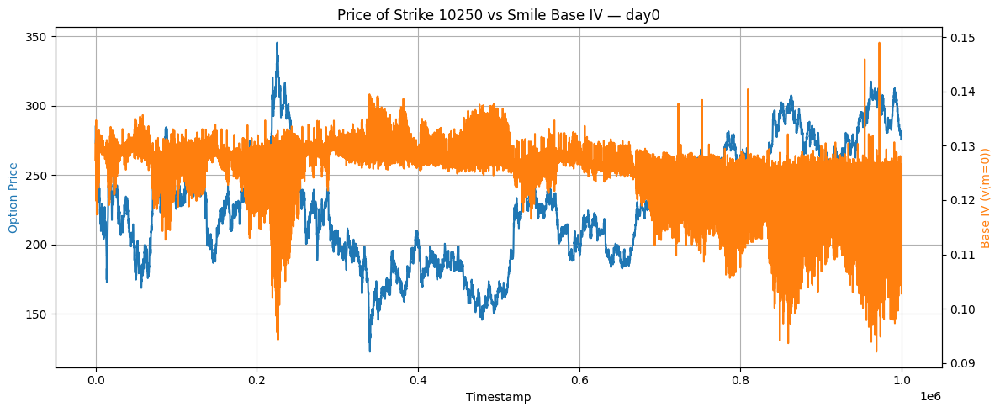

In [7]:
plot_voucher_price_vs_base_iv(strike=10250, day_label="day0")

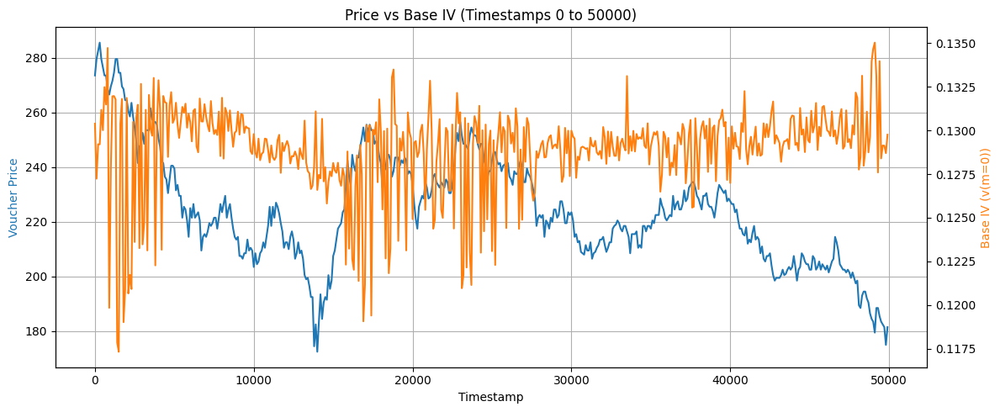

interactive(children=(IntSlider(value=0, continuous_update=False, description='Start:', max=950000, step=1000)…

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statistics import NormalDist
import ipywidgets as widgets
from IPython.display import display

# ---- Get Option Price Series ----
def get_voucher_price_series(strike, day_label):
    product = f"VOLCANIC_ROCK_VOUCHER_{strike}"
    option_df = product_data_by_day[day_label][product]
    return option_df[["timestamp", "mid_price"]].rename(columns={"mid_price": "voucher_price"}).reset_index(drop=True)

# ---- Get Base IV (v(m=0)) Series ----
def get_base_iv_series(day_label):
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]
    options_df = volcanic_data_by_day[day_label]
    base_ivs = []

    for ts in range(0, 1_000_000, 100):
        try:
            spot_price = spot_df.query("timestamp == @ts")["mid_price"].values[0]
            current_day = int(day_label.replace("day", ""))
            options = options_df[(options_df["timestamp"] == ts) & options_df["product"].str.contains("VOUCHER")]

            ivs = []
            tte = (8_000_000 - (current_day * 1_000_000 + ts)) / 252_000_000
            for row in options.itertuples():
                strike = int(row.product.split("_")[-1])
                call_price = row.mid_price
                try:
                    if call_price <= 0 or spot_price <= 0 or strike <= 0 or tte <= 0:
                        raise ValueError("Invalid input")
                    low_vol, high_vol = 0.01, 2.0
                    for _ in range(100):
                        mid_vol = (low_vol + high_vol) / 2
                        d1 = (np.log(spot_price / strike) + 0.5 * mid_vol**2 * tte) / (mid_vol * np.sqrt(tte))
                        d2 = d1 - mid_vol * np.sqrt(tte)
                        est_price = spot_price * NormalDist().cdf(d1) - strike * NormalDist().cdf(d2)
                        if abs(est_price - call_price) < 1e-5:
                            break
                        if est_price > call_price:
                            high_vol = mid_vol
                        else:
                            low_vol = mid_vol
                    m = np.log(strike / spot_price) / np.sqrt(tte)
                    ivs.append((m, mid_vol))
                except:
                    continue

            if len(ivs) >= 3:
                x, y = zip(*ivs)
                coeffs = np.polyfit(x, y, 2)
                poly = np.poly1d(coeffs)
                base_ivs.append((ts, poly(0)))
        except:
            continue

    return pd.DataFrame(base_ivs, columns=["timestamp", "base_iv"])

# ---- Interactive Plotter ----
def interactive_price_vs_base_iv(merged_df, window_size=50000):
    def plot_window(start):
        end = start + window_size
        window_df = merged_df[(merged_df["timestamp"] >= start) & (merged_df["timestamp"] < end)]

        plt.figure(figsize=(12, 5))
        ax1 = plt.gca()
        ax2 = ax1.twinx()

        ax1.plot(window_df["timestamp"], window_df["voucher_price"], color="tab:blue", label="Voucher Price")
        ax2.plot(window_df["timestamp"], window_df["base_iv"], color="tab:orange", label="Base IV")

        ax1.set_ylabel("Voucher Price", color="tab:blue")
        ax2.set_ylabel("Base IV (v(m=0))", color="tab:orange")
        ax1.set_xlabel("Timestamp")
        plt.title(f"Price vs Base IV (Timestamps {start} to {end})")
        ax1.grid(True)
        plt.tight_layout()
        plt.show()

    slider = widgets.IntSlider(
        value=0,
        min=0,
        max=1_000_000 - window_size,
        step=1000,
        description='Start:',
        continuous_update=False
    )

    display(slider)
    widgets.interact(plot_window, start=slider)

# ---- Run Everything ----
strike = 10250
day = "day0"

voucher_df = get_voucher_price_series(strike, day)
base_iv_df = get_base_iv_series(day)
merged_df = pd.merge(voucher_df, base_iv_df, on="timestamp", how="inner")



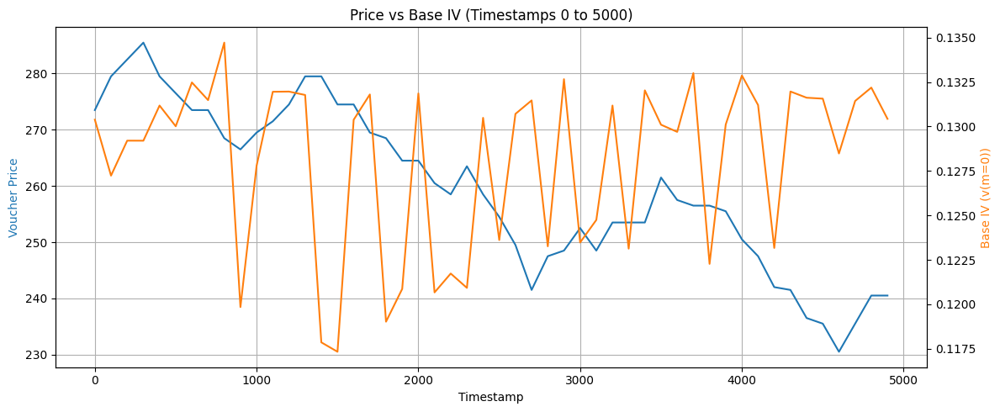

interactive(children=(IntSlider(value=0, continuous_update=False, description='Start:', max=995000, step=1000)…

In [15]:
interactive_price_vs_base_iv(merged_df, window_size=5000)


In [16]:
def plot_normalized_diff_vs_price(merged_df):
    df = merged_df.copy()

    # Normalize both series (min-max normalization)
    df["norm_price"] = (df["voucher_price"] - df["voucher_price"].min()) / (df["voucher_price"].max() - df["voucher_price"].min())
    df["norm_base_iv"] = (df["base_iv"] - df["base_iv"].min()) / (df["base_iv"].max() - df["base_iv"].min())

    # Difference between normalized series
    df["norm_diff"] = df["norm_price"] - df["norm_base_iv"]

    # Plot
    plt.figure(figsize=(12, 5))
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    ax1.plot(df["timestamp"], df["norm_diff"], label="Normalized Price - Base IV", color='tab:red')
    ax2.plot(df["timestamp"], df["voucher_price"], label="Raw Voucher Price", color='tab:blue')

    ax1.set_ylabel("Normalized Diff", color="tab:red")
    ax2.set_ylabel("Voucher Price", color="tab:blue")
    ax1.set_xlabel("Timestamp")
    plt.title("Normalized Diff (Price - Base IV) and Voucher Price")
    ax1.grid(True)
    plt.tight_layout()
    plt.show()


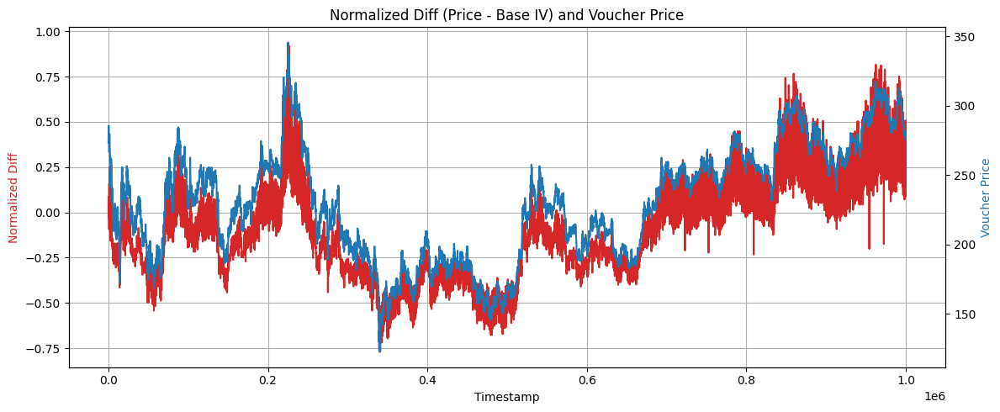

In [17]:
plot_normalized_diff_vs_price(merged_df)


In [18]:
def interactive_normalized_diff_zoom(merged_df, window_size=50000):
    df = merged_df.copy()

    # Normalize both
    df["norm_price"] = (df["voucher_price"] - df["voucher_price"].min()) / (df["voucher_price"].max() - df["voucher_price"].min())
    df["norm_base_iv"] = (df["base_iv"] - df["base_iv"].min()) / (df["base_iv"].max() - df["base_iv"].min())
    df["norm_diff"] = df["norm_price"] - df["norm_base_iv"]

    def plot_window(start):
        end = start + window_size
        window_df = df[(df["timestamp"] >= start) & (df["timestamp"] < end)]

        plt.figure(figsize=(12, 5))
        ax1 = plt.gca()
        ax2 = ax1.twinx()

        ax1.plot(window_df["timestamp"], window_df["norm_diff"], color="tab:red", label="Normalized Diff")
        ax2.plot(window_df["timestamp"], window_df["voucher_price"], color="tab:blue", label="Voucher Price")

        ax1.set_ylabel("Normalized Diff (Price - Base IV)", color="tab:red")
        ax2.set_ylabel("Voucher Price", color="tab:blue")
        ax1.set_xlabel("Timestamp")
        plt.title(f"Zoomed View: Normalized Diff & Price [{start} - {end}]")
        ax1.grid(True)
        plt.tight_layout()
        plt.show()

    slider = widgets.IntSlider(
        value=0,
        min=0,
        max=1_000_000 - window_size,
        step=1000,
        description='Start:',
        continuous_update=False
    )

    display(slider)
    widgets.interact(plot_window, start=slider)


In [21]:
interactive_normalized_diff_zoom(merged_df['base_iv'], window_size=10000)


KeyError: 'voucher_price'

In [22]:
def plot_iv_of_strike_over_time(strike=9750, day_label="day0"):
    product = f"VOLCANIC_ROCK_VOUCHER_{strike}"
    option_df = product_data_by_day[day_label][product]
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]

    ivs = []

    for ts in range(0, 1_000_000, 100):
        try:
            spot_price = spot_df.query("timestamp == @ts")["mid_price"].values[0]
            call_price = option_df.query("timestamp == @ts")["mid_price"].values[0]
            current_day = int(day_label.replace("day", ""))
            tte = (8_000_000 - (current_day * 1_000_000 + ts)) / 252_000_000

            # Compute implied volatility
            low_vol, high_vol = 0.01, 2.0
            for _ in range(100):
                mid_vol = (low_vol + high_vol) / 2
                d1 = (np.log(spot_price / strike) + 0.5 * mid_vol**2 * tte) / (mid_vol * np.sqrt(tte))
                d2 = d1 - mid_vol * np.sqrt(tte)
                est_price = spot_price * NormalDist().cdf(d1) - strike * NormalDist().cdf(d2)
                if abs(est_price - call_price) < 1e-5:
                    break
                if est_price > call_price:
                    high_vol = mid_vol
                else:
                    low_vol = mid_vol

            ivs.append((ts, mid_vol))
        except:
            continue

    iv_df = pd.DataFrame(ivs, columns=["timestamp", "implied_volatility"])

    # Plot
    plt.figure(figsize=(12, 5))
    plt.plot(iv_df["timestamp"], iv_df["implied_volatility"], label=f"IV Strike {strike}", color='tab:green')
    plt.xlabel("Timestamp")
    plt.ylabel("Implied Volatility")
    plt.title(f"Implied Volatility Over Time — {product} ({day_label})")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


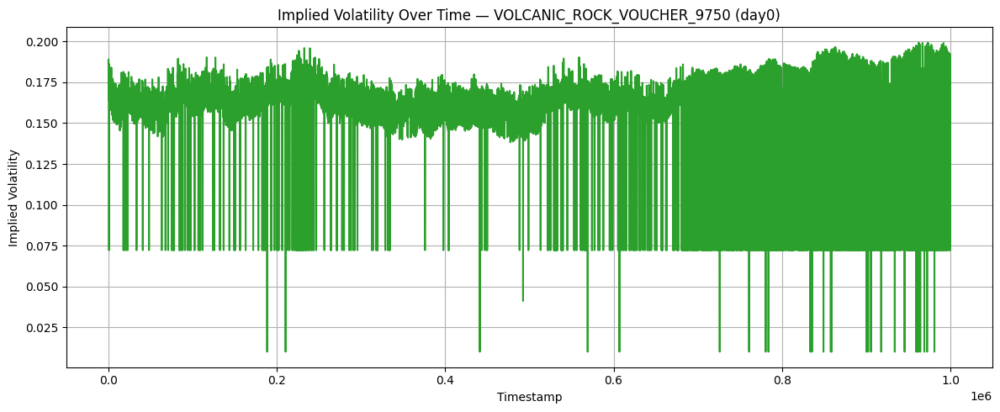

In [23]:
plot_iv_of_strike_over_time(strike=9750, day_label="day0")


In [24]:
import ipywidgets as widgets
from IPython.display import display

def interactive_iv_and_price_of_strike(strike=9750, day_label="day0", window_size=50000):
    product = f"VOLCANIC_ROCK_VOUCHER_{strike}"
    option_df = product_data_by_day[day_label][product]
    spot_df = product_data_by_day[day_label]["VOLCANIC_ROCK"]

    # Precompute implied volatility series
    ivs = []

    for ts in range(0, 1_000_000, 100):
        try:
            spot_price = spot_df.query("timestamp == @ts")["mid_price"].values[0]
            call_price = option_df.query("timestamp == @ts")["mid_price"].values[0]
            current_day = int(day_label.replace("day", ""))
            tte = (8_000_000 - (current_day * 1_000_000 + ts)) / 252_000_000

            low_vol, high_vol = 0.01, 2.0
            for _ in range(100):
                mid_vol = (low_vol + high_vol) / 2
                d1 = (np.log(spot_price / strike) + 0.5 * mid_vol**2 * tte) / (mid_vol * np.sqrt(tte))
                d2 = d1 - mid_vol * np.sqrt(tte)
                est_price = spot_price * NormalDist().cdf(d1) - strike * NormalDist().cdf(d2)
                if abs(est_price - call_price) < 1e-5:
                    break
                if est_price > call_price:
                    high_vol = mid_vol
                else:
                    low_vol = mid_vol

            ivs.append((ts, call_price, mid_vol))
        except:
            continue

    df = pd.DataFrame(ivs, columns=["timestamp", "voucher_price", "implied_volatility"])

    # Interactive zoom plot
    def plot_window(start):
        end = start + window_size
        window_df = df[(df["timestamp"] >= start) & (df["timestamp"] < end)]

        plt.figure(figsize=(12, 5))
        ax1 = plt.gca()
        ax2 = ax1.twinx()

        ax1.plot(window_df["timestamp"], window_df["implied_volatility"], color="tab:green", label="Implied Vol")
        ax2.plot(window_df["timestamp"], window_df["voucher_price"], color="tab:blue", label="Voucher Price")

        ax1.set_ylabel("Implied Volatility", color="tab:green")
        ax2.set_ylabel("Option Price", color="tab:blue")
        ax1.set_xlabel("Timestamp")
        plt.title(f"{product} — IV and Price Over Time ({day_label}) [{start} - {end}]")
        ax1.grid(True)
        plt.tight_layout()
        plt.show()

    slider = widgets.IntSlider(
        value=0,
        min=0,
        max=1_000_000 - window_size,
        step=1000,
        description='Start:',
        continuous_update=False
    )

    display(slider)
    widgets.interact(plot_window, start=slider)


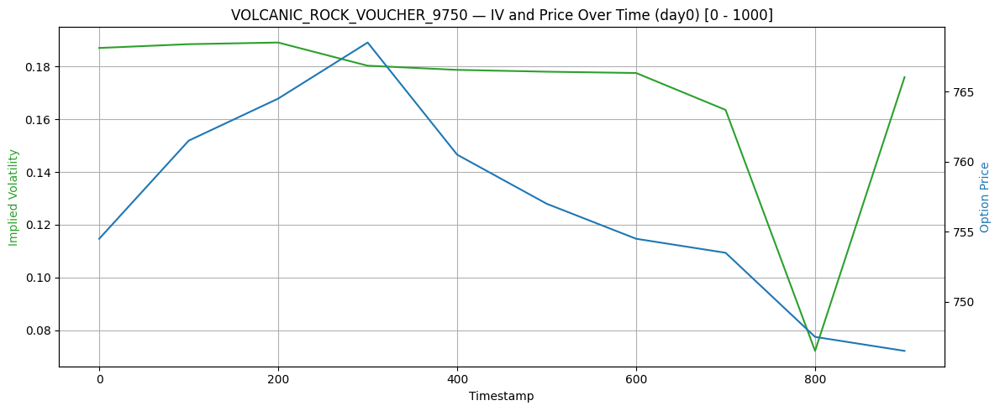

interactive(children=(IntSlider(value=0, continuous_update=False, description='Start:', max=999000, step=1000)…

In [26]:
interactive_iv_and_price_of_strike(strike=9750, day_label="day0", window_size=1000)
